In [225]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.base import BaseEstimator, TransformerMixin

In [226]:
#Надстройки!
import sklearn
sklearn.set_config(transform_output="pandas")

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score

In [227]:
# Надстройки Дарины

from sklearn.linear_model import Lasso
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder, StandardScaler, RobustScaler, MinMaxScaler, OrdinalEncoder
from sklearn.model_selection import GridSearchCV, KFold
from category_encoders import TargetEncoder

In [228]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [229]:
test_id = pd.read_csv('test.csv', usecols=['Id'])

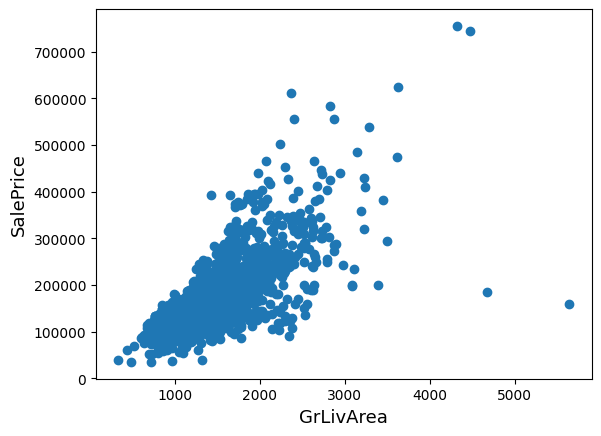

In [230]:
fig, ax = plt.subplots()
ax.scatter(x = train['GrLivArea'], y = train['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GrLivArea', fontsize=13)
plt.show()



In [231]:
# Удаляе выброcы
train.drop(train[(train['OverallQual']<5) & (train['SalePrice']>200000)].index, inplace=True)
train.drop(train[(train['GrLivArea']>4500) & (train['SalePrice']<300000)].index, inplace=True)
train.reset_index(drop=True, inplace=True)

In [232]:
ntrain = train.shape[0]

In [233]:
X_train, y_train = train.drop('SalePrice', axis=1), train['SalePrice']

In [234]:
y_train1 = np.log1p(y_train)

In [235]:
X_train.shape, test.shape

((1457, 80), (1459, 80))

In [236]:
X_full = pd.concat([X_train, test], axis=0)

# Проверим размерность датасета X_train после присоединения test
print("Размерность X_full после присоединения test:", X_full.shape)

Размерность X_full после присоединения test: (2916, 80)


# Немного feature-ingineering

In [237]:
# Можно эти при3наки упростить до есть/нет
X_full['HasOpenPorch'] = (X_full['OpenPorchSF'] == 0) * 1
X_full['HasEnclosedPorch'] = (X_full['EnclosedPorch'] == 0) * 1
X_full['Has3SsnPorch'] = (X_full['3SsnPorch'] == 0) * 1
X_full['HasScreenPorch'] = (X_full['ScreenPorch'] == 0) * 1

# И вынести общую площадь крыльца
X_full['Total_porch_sf'] = (X_full['OpenPorchSF'] + X_full['3SsnPorch'] +
                              X_full['EnclosedPorch'] + X_full['ScreenPorch'] +
                              X_full['WoodDeckSF'])

In [238]:
# Бассеин можно оставить, но упростить до есть/нет
X_full['haspool'] = X_full['PoolArea'].apply(lambda x: 1 if x > 0 else 0)

In [239]:
#Объединим год постройки и реконструкции
X_full['YrBltAndRemod'] = X_full['YearBuilt'] + X_full['YearRemodAdd']

In [240]:
# Добавляем общую площадь подвала, первого и второго этажей каждого дома
X_full['TotalSF'] = X_full['TotalBsmtSF'] + X_full['1stFlrSF'] + X_full['2ndFlrSF']
# Добавляем общую площадь ванных комнат
X_full['TotalBath'] = X_full['FullBath'] + X_full['HalfBath']

In [241]:
to_drop = ['OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'WoodDeckSF', 'PoolArea', 'TotalBsmtSF', '1stFlrSF',
           '2ndFlrSF', 'FullBath', 'HalfBath', 'Utilities', 'PoolQC', 'Id']

In [242]:
X_full.drop(to_drop, axis=1, inplace=True)

In [243]:
X_full

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,...,SaleCondition,HasOpenPorch,HasEnclosedPorch,Has3SsnPorch,HasScreenPorch,Total_porch_sf,haspool,YrBltAndRemod,TotalSF,TotalBath
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,Inside,Gtl,...,Normal,0,1,1,1,61,0,4006,2566.0,3
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,FR2,Gtl,...,Normal,1,1,1,1,298,0,3952,2524.0,2
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,Inside,Gtl,...,Normal,0,1,1,1,42,0,4003,2706.0,3
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,Corner,Gtl,...,Abnorml,0,0,1,1,307,0,3885,2473.0,1
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,FR2,Gtl,...,Normal,0,1,1,1,276,0,4000,3343.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,Inside,Gtl,...,Normal,1,1,1,1,0,0,3940,1638.0,2
1455,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,Inside,Gtl,...,Abnorml,0,1,1,1,24,0,3940,1638.0,2
1456,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,Inside,Gtl,...,Abnorml,1,1,1,1,474,0,3956,2448.0,1
1457,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,Inside,Gtl,...,Normal,0,1,1,1,112,0,3984,1882.0,1


# Работа с пропусками в данных

In [244]:
#Количество пропусков
d1 = pd.DataFrame(data={'NaN_count': X_full.isna().sum()})
missing_data = d1[d1['NaN_count'] > 0]
missing_data = missing_data['NaN_count'].sort_values(ascending=False)

Text(0.5, 1.0, 'Доля пропущенных значений по каждому признаку')

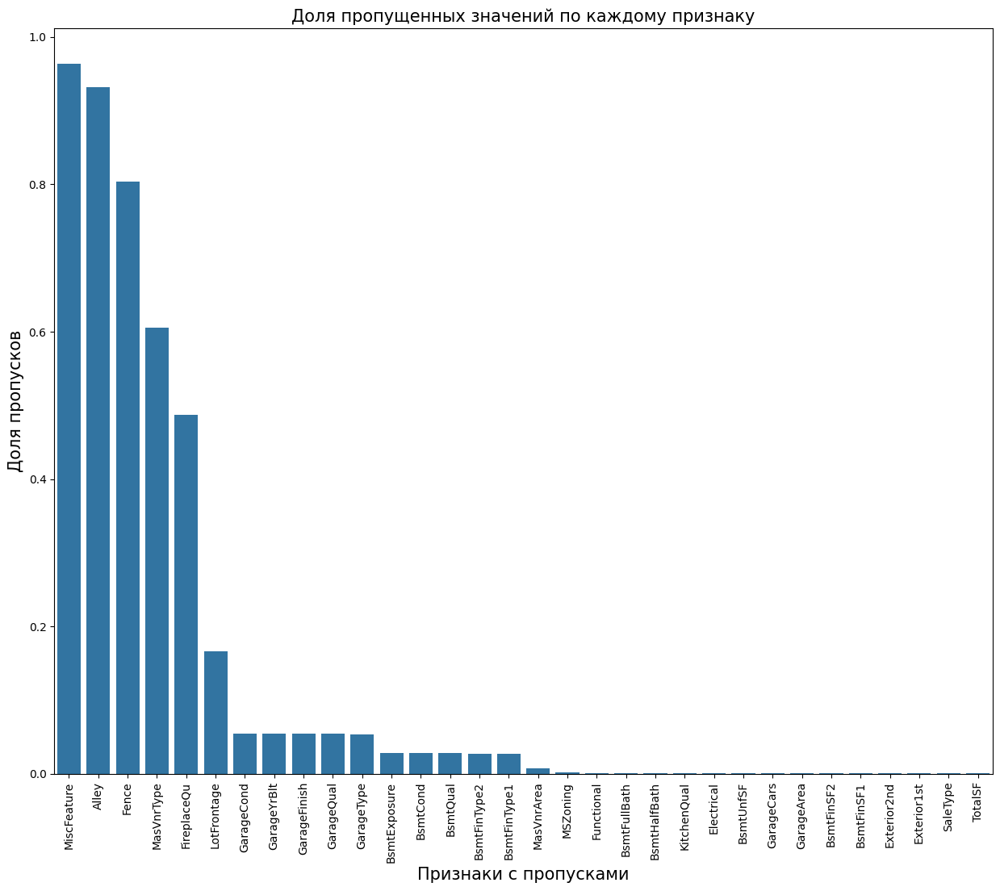

In [245]:
f, ax = plt.subplots(figsize=(15, 12))
plt.xticks(rotation='vertical')
sns.barplot(x=missing_data.index, y=missing_data/X_full.shape[0])
plt.xlabel('Признаки с пропусками', fontsize=15)
plt.ylabel('Доля пропусков', fontsize=15)
plt.title('Доля пропущенных значений по каждому признаку', fontsize=15)



In [246]:
# #Из описания данных видно, что в некоторых столбцах  Nan означают не пропуск в данных, а отсутствие данного признака
# # IMPUTE
IMPUTE_FEATURES_ZEROS = ['MasVnrArea', 'GarageYrBlt', 'BsmtFullBath', 'BsmtHalfBath', 'GarageArea', 'GarageCars',
                         'BsmtUnfSF', 'BsmtFinSF2', 'BsmtFinSF1']
IMPUTE_FEATURES_NONE = ['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure','BsmtFinType1', 'BsmtFinType2',
                         'GarageCond', 'GarageQual', 'GarageFinish', 'GarageType','Fence', 'Alley', 'MiscFeature', 'Exterior2nd', 'FireplaceQu']
IMPUTE_FEATURES_MODA = ['Electrical', 'MSZoning', 'Heating', 'HeatingQC', 'Functional', 'KitchenQual', 'Exterior1st', 'SaleType']
IMPUTE_FEATURES_LOTFR = ['Neighborhood', 'LotFrontage']
IMPUTE_FEATURES_MEAN = ['TotalSF']

In [247]:
from sklearn.base import BaseEstimator, TransformerMixin

class LotFrontageImputer(BaseEstimator, TransformerMixin): 
    def fit(self, X, y=None):
        # Вычисление медианы для каждого района и сохранение их в атрибуте объекта
        self.lotfrontage_medians_ = X.groupby('Neighborhood')['LotFrontage'].median()
        return self
    
    def transform(self, X, y=None):
        X_copy = X.copy()
        # Заполнение пропущенных значений медианами, соответствующими районам
        X_copy['LotFrontage'] = X_copy.apply(lambda row: self.lotfrontage_medians_[row['Neighborhood']] if pd.isnull(row['LotFrontage']) else row['LotFrontage'], axis=1)
        return X_copy



In [248]:

# drop_features = ['Id'] # Здесь пока помечаю столбцы, которые будем удалять


my_imputer = ColumnTransformer(
    transformers = [
        # ('drop_features', 'drop', drop_features),
        ('num_imputer', SimpleImputer(strategy='constant', fill_value=0), IMPUTE_FEATURES_ZEROS),
        ('cat_imputer', SimpleImputer(strategy='constant', fill_value='NA'), IMPUTE_FEATURES_NONE),
        ('moda_imputer', SimpleImputer(strategy='most_frequent'), IMPUTE_FEATURES_MODA),
        ('lot_fr_imputer', LotFrontageImputer(), IMPUTE_FEATURES_LOTFR),
        ('neam_imputer', SimpleImputer(strategy='mean'), IMPUTE_FEATURES_MEAN)
    ],
    verbose_feature_names_out = False,
    remainder = 'passthrough' 
)    

In [249]:
# X_full = my_imputer.fit_transform(X_full)

In [250]:
train = X_full[:ntrain]
test = X_full[ntrain:]

In [251]:
# определяем фичи для типов кодирования
ordinal_features = ['LotShape', 'LandSlope', 'ExterQual', 'ExterCond', 
'Foundation', 'BsmtQual', 'BsmtCond',  'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'Electrical', 
'KitchenQual','Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond']


# Настройка one-hot кодирования
# onehot_features = ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LandContour', 
# 'LotConfig', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'Heating', 'CentralAir', 'GarageType', 
# 'PavedDrive', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']

target_features = ['Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'Exterior1st', 'Exterior2nd', 'MSSubClass', 'MSZoning', 'Street', 'Alley', 'LandContour', 
'LotConfig', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'Heating', 'CentralAir', 'GarageType', 
'PavedDrive', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


# порядок категорий для ordinal_features
ordinal_categories = [
    ['Reg', 'IR1', 'IR2', 'IR3'],  # Порядок для LotShape
    ['Gtl', 'Mod', 'Sev'], # Порядок для LandSlope
    ['Ex', 'Gd', 'TA', 'Fa', 'Po'],  # ExterQual 
    ['Ex', 'Gd', 'TA', 'Fa', 'Po'],  # ExterCond
    ['PConc', 'CBlock', 'BrkTil', 'Stone', 'Wood', 'Slab'],  # Foundation
    ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'NA'],  # BsmtQual
    ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'NA'],  # BsmtCond
    ['Gd', 'Av', 'Mn', 'No', 'NA'],  # BsmtExposure
    ['GLQ', 'ALQ', 'BLQ', 'Rec', 'LwQ', 'Unf', 'NA'], # BsmtFinType1
    ['GLQ', 'ALQ', 'BLQ', 'Rec', 'LwQ', 'Unf', 'NA'], # BsmtFinType2
    ['Ex', 'Gd', 'TA', 'Fa', 'Po'], # HeatingQC
    ['SBrkr', 'FuseA', 'FuseF', 'FuseP', 'Mix'], # Electrical 
    ['Ex', 'Gd', 'TA', 'Fa', 'Po'], #  KitchenQual
    ['Typ', 'Min1', 'Min2', 'Mod', 'Maj1', 'Maj2', 'Sev', 'Sal'], # Functional
    ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'NA'], # FireplaceQu
    ['Fin', 'RFn', 'Unf', 'NA'], # GarageFinish
    ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'NA'], # GarageQual
    ['Ex', 'Gd', 'TA', 'Fa', 'Po', 'NA'], # GarageCond 
]

In [252]:
#  Закодируем данные
encoder = ColumnTransformer(
    transformers=[
        ('ordinal', OrdinalEncoder(categories=ordinal_categories), ordinal_features),
        # ('onehot', OneHotEncoder(sparse_output=False), onehot_features),
        ('target_encoder', TargetEncoder(), target_features)
    ],
    remainder='passthrough',
    verbose_feature_names_out = False
)

In [253]:
# encoder.fit_transform(train, y_train)

In [254]:
preprocessor1 = Pipeline(
    [
        ('imputer', my_imputer),
        ('encoder', encoder)
    ]
)

In [255]:
# preprocessor1.fit_transform(train, y_train)

In [256]:
scaler = ColumnTransformer(
    transformers=[
        ('scaling_num_columns', StandardScaler(), preprocessor1.fit_transform(train, y_train).columns)
    ],
    remainder='passthrough',
    verbose_feature_names_out = False
)

In [257]:
preprocessor2 = Pipeline(
    [
        ('preprocessor1', preprocessor1),
        ('scaler', scaler)
    ]
)

In [258]:
# preprocessor2.fit_transform(train, y_train)

In [259]:
preprocessor2.fit(train, y_train)

Pipeline(steps=[('preprocessor1',
                 Pipeline(steps=[('imputer',
                                  ColumnTransformer(remainder='passthrough',
                                                    transformers=[('num_imputer',
                                                                   SimpleImputer(fill_value=0,
                                                                                 strategy='constant'),
                                                                   ['MasVnrArea',
                                                                    'GarageYrBlt',
                                                                    'BsmtFullBath',
                                                                    'BsmtHalfBath',
                                                                    'GarageArea',
                                                                    'GarageCars',
                                                                    'BsmtUnfSF',
                                                                    'BsmtFinSF2',
                                                                    'BsmtFinSF1']),
                                                                  ('cat_imputer',
                                                                   SimpleImputer(fill_value='NA',
                                                                                 st...
       'BsmtFinSF2', 'BsmtFinSF1', 'LotFrontage', 'TotalSF', 'LotArea',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'LowQualFinSF', 'GrLivArea', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'MiscVal', 'MoSold', 'YrSold',
       'HasOpenPorch', 'HasEnclosedPorch', 'Has3SsnPorch', 'HasScreenPorch',
       'Total_porch_sf', 'haspool', 'YrBltAndRemod', 'TotalBath'],
      dtype='object'))],
                                   verbose_feature_names_out=False))])

In [260]:
# joblib.dump(preprocessor2, 'preprocessor2.pkl')

In [261]:
# train = preprocessor2.fit_transform(train, y_train)

In [262]:
# test = preprocessor2.transform(test)

In [263]:
# lasso = Lasso(alpha=0.4)
# lasso.fit(preprocessor2.fit_transform(train, y_train), y_train)

# # Сортировка коэффициентов Lasso и выбор признаков для удаления
# corr = pd.Series(dict(zip(train.columns, lasso.coef_))).sort_values(key=lambda x: abs(x), ascending=False)
# to_drop = corr[corr < 100].tail(40).index.to_list()


In [264]:

# Создаем собственный трансформер для удаления выбранных столбцов
class ColumnDroper(BaseEstimator, TransformerMixin):
    def __init__(self, columns_to_drop):
        self.columns_to_drop = columns_to_drop
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        return X.drop(columns=self.columns_to_drop)

# Создание модели Lasso и её обучение
lasso = Lasso(alpha=0.4)
lasso.fit(preprocessor2.fit_transform(train, y_train), y_train)

# Сортировка коэффициентов Lasso и выбор признаков для удаления
corr = pd.Series(dict(zip(train.columns, lasso.coef_))).sort_values(key=lambda x: abs(x), ascending=False)
to_drop = corr[corr < 100].tail(40).index.to_list()

# Итоговый пайплайн предобработки данных
final_preprocessing = Pipeline(
    [
        ('preprocessor2', preprocessor2),
        ('deliter', ColumnDroper(columns_to_drop=to_drop))
    ]
)


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.196e+11, tolerance: 9.202e+08
  model = cd_fast.enet_coordinate_descent(


In [265]:
final_preprocessing


Pipeline(steps=[('preprocessor2',
                 Pipeline(steps=[('preprocessor1',
                                  Pipeline(steps=[('imputer',
                                                   ColumnTransformer(remainder='passthrough',
                                                                     transformers=[('num_imputer',
                                                                                    SimpleImputer(fill_value=0,
                                                                                                  strategy='constant'),
                                                                                    ['MasVnrArea',
                                                                                     'GarageYrBlt',
                                                                                     'BsmtFullBath',
                                                                                     'BsmtHalfBath',
                                                                                     'GarageArea',
                                                                                     'GarageCars',
                                                                                     'BsmtUnfSF',
                                                                                     'BsmtFinSF2',
                                                                                     'BsmtFinSF1']),
                                                                                   ('cat_imputer'...
                                               'MiscFeature', 'LotFrontage',
                                               'LandContour', 'ExterQual',
                                               'Condition2', 'OverallCond',
                                               'TotalSF', 'MiscVal', 'BldgType',
                                               'Fireplaces', 'Alley',
                                               'Neighborhood', 'Heating',
                                               'BsmtFinType2', 'SaleCondition',
                                               'Total_porch_sf', 'MasVnrArea',
                                               'RoofMatl', 'PavedDrive',
                                               'MSZoning', 'Exterior1st',
                                               'CentralAir', 'Electrical',
                                               'KitchenAbvGr', 'BsmtFinSF2',
                                               'Street', 'Exterior2nd',
                                               'SaleType', ...]))])

In [266]:
# final_preprocessing.fit(train, y_train)

In [267]:
joblib.dump(final_preprocessing, 'final_preprocessing.pkl')

['final_preprocessing.pkl']

In [268]:
#Старая версия
# lasso = Lasso(alpha= 0.4)
# lasso.fit(train, y_train)
# corr = pd.Series(dict(zip(train.columns, lasso.coef_))).sort_values(key=lambda x: abs(x), ascending=False)

# to_drop = corr[corr < 100].tail(40).index.to_list()

In [269]:
# train = train.drop(to_drop, axis = 1)

In [270]:
# test = test.drop(to_drop, axis = 1)

# CatBoost

In [271]:
# train = final_preprocessing.transform(train)
# test = final_preprocessing.transform(test)

In [272]:
from catboost import CatBoostRegressor

In [273]:
# X_train, X_valid, y_train, y_valid = train_test_split(train, y_train1, test_size=0.2, random_state=42)
# 

In [204]:
# cb = CatBoostRegressor()
# cb.fit(X_train, y_train, eval_set=(X_valid, y_valid), verbose=False)

In [275]:
#После оптюны
params = {
    'colsample_bylevel': 0.09388205804582872,
    'depth': 3,
    'boosting_type': 'Plain',
    'bootstrap_type': 'MVS'
}
cb1 = CatBoostRegressor(**params)
cb1.fit(test, y_train1, verbose=False)

CatBoostError: Length of label=1457 and length of data=1459 is different.

In [206]:
n_folds = 10

def rmsle_cv(model, X, y):
    kf = KFold(n_folds, shuffle=True, random_state=42)
    rmse = np.sqrt(-cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=kf))
    return rmse.mean()

In [207]:
# preds_log = cb.predict(test)

In [208]:
# preds = np.exp(preds_log)

In [209]:
# preds

In [210]:
# submission = pd.DataFrame(index=test1['Id'], data=preds, columns=['SalePrice'])

In [211]:
# submission.to_csv('submission.csv')

In [212]:
rmsle_cv(cb1, X_valid, y_valid)

Learning rate set to 0.033134
0:	learn: 0.3910292	total: 859us	remaining: 858ms
1:	learn: 0.3858003	total: 973us	remaining: 486ms
2:	learn: 0.3819750	total: 1.09ms	remaining: 363ms
3:	learn: 0.3761896	total: 1.83ms	remaining: 457ms
4:	learn: 0.3717574	total: 2.11ms	remaining: 420ms
5:	learn: 0.3662914	total: 2.23ms	remaining: 370ms
6:	learn: 0.3621065	total: 2.33ms	remaining: 331ms
7:	learn: 0.3577549	total: 2.42ms	remaining: 300ms
8:	learn: 0.3577548	total: 2.46ms	remaining: 271ms
9:	learn: 0.3546410	total: 2.56ms	remaining: 253ms
10:	learn: 0.3546410	total: 2.6ms	remaining: 233ms
11:	learn: 0.3487357	total: 9ms	remaining: 741ms
12:	learn: 0.3457383	total: 9.17ms	remaining: 696ms
13:	learn: 0.3408460	total: 9.35ms	remaining: 658ms
14:	learn: 0.3363114	total: 9.49ms	remaining: 623ms
15:	learn: 0.3322952	total: 9.65ms	remaining: 594ms
16:	learn: 0.3270326	total: 9.78ms	remaining: 566ms
17:	learn: 0.3225092	total: 9.91ms	remaining: 541ms
18:	learn: 0.3187344	total: 10.1ms	remaining: 519m

742:	learn: 0.0747147	total: 135ms	remaining: 46.9ms
743:	learn: 0.0746893	total: 136ms	remaining: 46.8ms
744:	learn: 0.0746511	total: 137ms	remaining: 46.8ms
745:	learn: 0.0745936	total: 137ms	remaining: 46.6ms
746:	learn: 0.0745264	total: 137ms	remaining: 46.4ms
747:	learn: 0.0744258	total: 138ms	remaining: 46.5ms
748:	learn: 0.0743930	total: 138ms	remaining: 46.3ms
749:	learn: 0.0743132	total: 138ms	remaining: 46.1ms
750:	learn: 0.0742411	total: 138ms	remaining: 45.9ms
751:	learn: 0.0741614	total: 139ms	remaining: 46ms
752:	learn: 0.0741116	total: 140ms	remaining: 45.8ms
753:	learn: 0.0740257	total: 140ms	remaining: 45.6ms
754:	learn: 0.0739294	total: 140ms	remaining: 45.4ms
755:	learn: 0.0739015	total: 140ms	remaining: 45.2ms
756:	learn: 0.0738770	total: 140ms	remaining: 44.9ms
757:	learn: 0.0737551	total: 140ms	remaining: 44.7ms
758:	learn: 0.0737422	total: 140ms	remaining: 44.5ms
759:	learn: 0.0737281	total: 140ms	remaining: 44.3ms
760:	learn: 0.0737215	total: 140ms	remaining: 44

0.1500244750539529

In [213]:
import optuna

In [214]:
# def objective(trial):
#     param = {
#         "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
#         "depth": trial.suggest_int("depth", 1, 12),
#         "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
#         "bootstrap_type": trial.suggest_categorical(
#             "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]
#         ),
#         "used_ram_limit": "3gb",
#     }

#     if param["bootstrap_type"] == "Bayesian":
#         param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
#     elif param["bootstrap_type"] == "Bernoulli":
#         param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

#     gbm = CatBoostRegressor(**param)

#     gbm.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], verbose=0, early_stopping_rounds=100)

#     preds = gbm.predict(X_valid)
#     accuracy = rmsle_cv(gbm, X_valid, y_valid)
#     return accuracy


# if __name__ == "__main__":
#     study = optuna.create_study(direction="minimize")
#     study.optimize(objective, n_trials=100, timeout=600)

#     print("Number of finished trials: {}".format(len(study.trials)))

#     print("Best trial:")
#     trial = study.best_trial

#     print("  Value: {}".format(trial.value))

#     print("  Params: ")
#     for key, value in trial.params.items():
#         print("    {}: {}".format(key, value))



In [215]:
# Number of finished trials: 44
# Best trial:
#   Value: 0.11973023018520831
#   Params: 
#     colsample_bylevel: 0.09388205804582872
#     depth: 3
#     boosting_type: Plain
#     bootstrap_type: MVS

# Ridge

In [216]:
from sklearn.linear_model import RidgeCV

In [217]:
ridge_alphas = [1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100]

ridge_cv = RidgeCV(alphas=ridge_alphas, cv=10)

In [218]:
ridge_cv = RidgeCV(alphas=ridge_alphas, cv=10)

In [219]:
rmsle_cv(ridge_cv, test, y_train1)

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.32348e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=8.78035e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.27451e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.10708e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

KeyboardInterrupt: 

# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf = RandomForestRegressor(n_estimators=30, random_state=1)

In [ ]:
rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=30, random_state=1)

In [ ]:
rmsle_cv(rf, test, y_train1)

0.17515250716725486

In [ ]:
# def objective(trial):
    
#     # Параметры самой модели
#     model_params = {
#         'max_depth' : trial.suggest_int('max_depth', 2, 10, 1),
#         'criterion' : trial.suggest_categorical('criterion', ['squared_error', 'poisson', 'friedman_mse', 'absolute_error']),
#         'min_samples_split': trial.suggest_int('min_samples_split', 2, 5, 1)
#     }
    
    
#     rf.set_params(**model_params)

        
#     # Вычисление метрик точности с использованием кросс-валидации
#     scores = rmsle_cv(rf, X_train, y_train)
    
#     accuracy = scores.mean()
    
#     return accuracy


# # Создание объекта для проведения оптимизации
# study = optuna.create_study(direction='minimize')


# # Запуск оптимизации
# study.optimize(objective, n_trials=100)


# # Вывод результатов
# best_params = study.best_params
# best_value = study.best_value


# print(f"Лучшие параметры: {best_params}")
# print(f"Лучшее значение: {best_value}")

Тут будет датасет со всеми результатами по моделям (пока что их 3) - для презентации

In [ ]:
new_df = pd.DataFrame(index=['CatBoost', 'RandomForest', 'Ridge'], columns=['train', 'valid'], dtype=float)

In [ ]:
new_df.loc['CatBoost', 'valid'] = rmsle_cv(cb1, X_valid, y_valid)
new_df.loc['CatBoost', 'train'] = rmsle_cv(cb1, X_train, y_train)
new_df.loc['RandomForest', 'valid'] = rmsle_cv(rf, X_valid, y_valid)
new_df.loc['RandomForest', 'train'] = rmsle_cv(rf, X_train, y_train)
new_df.loc['Ridge', 'valid'] = rmsle_cv(ridge_cv, X_valid, y_valid)
new_df.loc['Ridge', 'train'] = rmsle_cv(ridge_cv, X_train, y_train)

ValueError: 
All the 10 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
9 fits failed with the following error:
Traceback (most recent call last):
  File "_catboost.pyx", line 2383, in _catboost.get_float_feature
  File "_catboost.pyx", line 1188, in _catboost._FloatOrNan
  File "_catboost.pyx", line 983, in _catboost._FloatOrNanFromString
TypeError: Cannot convert 'b'RL'' to float

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 5827, in fit
    return self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 2385, in _fit
    train_params = self._prepare_train_params(
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 2265, in _prepare_train_params
    train_pool = _build_train_pool(X, y, cat_features, text_features, embedding_features, pairs,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 1503, in _build_train_pool
    train_pool = Pool(X, y, cat_features=cat_features, text_features=text_features, embedding_features=embedding_features, pairs=pairs, weight=sample_weight, group_id=group_id,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 848, in __init__
    self._init(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 1481, in _init
    self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
  File "_catboost.pyx", line 4159, in _catboost._PoolBase._init_pool
  File "_catboost.pyx", line 4209, in _catboost._PoolBase._init_pool
  File "_catboost.pyx", line 4025, in _catboost._PoolBase._init_features_order_layout_pool
  File "_catboost.pyx", line 2963, in _catboost._set_features_order_data_pd_data_frame
  File "_catboost.pyx", line 2427, in _catboost.create_num_factor_data
  File "_catboost.pyx", line 2385, in _catboost.get_float_feature
_catboost.CatBoostError: Bad value for num_feature[non_default_doc_idx=0,feature_idx=1]="RL": Cannot convert 'b'RL'' to float

--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "_catboost.pyx", line 2383, in _catboost.get_float_feature
  File "_catboost.pyx", line 1188, in _catboost._FloatOrNan
  File "_catboost.pyx", line 983, in _catboost._FloatOrNanFromString
TypeError: Cannot convert 'b'RH'' to float

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 5827, in fit
    return self._fit(X, y, cat_features, text_features, embedding_features, None, sample_weight, None, None, None, None, baseline,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 2385, in _fit
    train_params = self._prepare_train_params(
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 2265, in _prepare_train_params
    train_pool = _build_train_pool(X, y, cat_features, text_features, embedding_features, pairs,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 1503, in _build_train_pool
    train_pool = Pool(X, y, cat_features=cat_features, text_features=text_features, embedding_features=embedding_features, pairs=pairs, weight=sample_weight, group_id=group_id,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 848, in __init__
    self._init(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
  File "/home/vera/miniforge3/lib/python3.10/site-packages/catboost/core.py", line 1481, in _init
    self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
  File "_catboost.pyx", line 4159, in _catboost._PoolBase._init_pool
  File "_catboost.pyx", line 4209, in _catboost._PoolBase._init_pool
  File "_catboost.pyx", line 4025, in _catboost._PoolBase._init_features_order_layout_pool
  File "_catboost.pyx", line 2963, in _catboost._set_features_order_data_pd_data_frame
  File "_catboost.pyx", line 2427, in _catboost.create_num_factor_data
  File "_catboost.pyx", line 2385, in _catboost.get_float_feature
_catboost.CatBoostError: Bad value for num_feature[non_default_doc_idx=0,feature_idx=1]="RH": Cannot convert 'b'RH'' to float


In [ ]:
new_df

,train,valid
CatBoost,0.114429,0.124284
RandomForest,0.119215,0.124744
Ridge,NaN,NaN


# SVR

In [ ]:
from sklearn.svm import SVR

In [ ]:
# ml_svr = SVR(C= 20, epsilon= 0.008, gamma=0.0003)

In [ ]:
# SVR.fit(X_train, y_train)

AttributeError: 'DataFrame' object has no attribute '_validate_params'

# НАДО СДЕЛАТЬ VOTES!!!!

In [220]:
from sklearn.ensemble import VotingRegressor

In [276]:
# weights = [0.7, 0.3]  # Например, дадим CatBoost вес 0.6, а RidgeCV - 0.4

# Создаем VotingRegressor
voting_regressor = VotingRegressor(
    estimators=[('catboost', cb1), ('ridge_cv', ridge_cv)],
    weights=[0.7, 0.3]
)

In [277]:
ml_pipeline = Pipeline(
    [
        ('preprocessing', final_preprocessing),
        ('model', voting_regressor)
    ]
)

ml_pipeline

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('preprocessor2',
                                  Pipeline(steps=[('preprocessor1',
                                                   Pipeline(steps=[('imputer',
                                                                    ColumnTransformer(remainder='passthrough',
                                                                                      transformers=[('num_imputer',
                                                                                                     SimpleImputer(fill_value=0,
                                                                                                                   strategy='constant'),
                                                                                                     ['MasVnrArea',
                                                                                                      'GarageYrBlt',
                                                                                                      'BsmtFullBath',
                                                                                                      'BsmtHalfBath',
                                                                                                      'GarageArea',
                                                                                                      'GarageCars',
                                                                                                      'BsmtUnfSF',
                                                                                                      'BsmtFinS...
                                                                'Electrical',
                                                                'KitchenAbvGr',
                                                                'BsmtFinSF2',
                                                                'Street',
                                                                'Exterior2nd',
                                                                'SaleType', ...]))])),
                ('model',
                 VotingRegressor(estimators=[('catboost',
                                              <catboost.core.CatBoostRegressor object at 0x76145772bdf0>),
                                             ('ridge_cv',
                                              RidgeCV(alphas=[1e-15, 1e-10,
                                                              1e-08, 0.0009,
                                                              0.0007, 0.0005,
                                                              0.0003, 0.0001,
                                                              0.001, 0.05, 0.01,
                                                              0.1, 0.3, 1, 3, 5,
                                                              10, 15, 18, 20,
                                                              30, 50, 75, 100],
                                                      cv=10))],
                                 weights=[0.7, 0.3]))])

In [280]:
ml_pipeline.fit(train, y_train1)

Learning rate set to 0.043452
0:	learn: 0.3938934	total: 329us	remaining: 329ms
1:	learn: 0.3855894	total: 545us	remaining: 272ms
2:	learn: 0.3774858	total: 772us	remaining: 257ms
3:	learn: 0.3695629	total: 995us	remaining: 248ms
4:	learn: 0.3608492	total: 1.22ms	remaining: 243ms
5:	learn: 0.3540724	total: 1.44ms	remaining: 239ms
6:	learn: 0.3480683	total: 2.05ms	remaining: 291ms
7:	learn: 0.3439783	total: 2.25ms	remaining: 279ms
8:	learn: 0.3439783	total: 2.36ms	remaining: 260ms
9:	learn: 0.3380556	total: 2.57ms	remaining: 255ms
10:	learn: 0.3380556	total: 2.67ms	remaining: 240ms
11:	learn: 0.3305673	total: 2.93ms	remaining: 241ms
12:	learn: 0.3242568	total: 3.12ms	remaining: 237ms
13:	learn: 0.3181057	total: 3.31ms	remaining: 233ms
14:	learn: 0.3114191	total: 3.53ms	remaining: 232ms
15:	learn: 0.3068294	total: 3.74ms	remaining: 230ms
16:	learn: 0.3009100	total: 3.94ms	remaining: 228ms
17:	learn: 0.2975207	total: 4.25ms	remaining: 232ms
18:	learn: 0.2916292	total: 4.46ms	remaining: 23

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=1.59832e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=4.75233e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=2.03825e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('preprocessor2',
                                  Pipeline(steps=[('preprocessor1',
                                                   Pipeline(steps=[('imputer',
                                                                    ColumnTransformer(remainder='passthrough',
                                                                                      transformers=[('num_imputer',
                                                                                                     SimpleImputer(fill_value=0,
                                                                                                                   strategy='constant'),
                                                                                                     ['MasVnrArea',
                                                                                                      'GarageYrBlt',
                                                                                                      'BsmtFullBath',
                                                                                                      'BsmtHalfBath',
                                                                                                      'GarageArea',
                                                                                                      'GarageCars',
                                                                                                      'BsmtUnfSF',
                                                                                                      'BsmtFinS...
                                                                'Electrical',
                                                                'KitchenAbvGr',
                                                                'BsmtFinSF2',
                                                                'Street',
                                                                'Exterior2nd',
                                                                'SaleType', ...]))])),
                ('model',
                 VotingRegressor(estimators=[('catboost',
                                              <catboost.core.CatBoostRegressor object at 0x76145772bdf0>),
                                             ('ridge_cv',
                                              RidgeCV(alphas=[1e-15, 1e-10,
                                                              1e-08, 0.0009,
                                                              0.0007, 0.0005,
                                                              0.0003, 0.0001,
                                                              0.001, 0.05, 0.01,
                                                              0.1, 0.3, 1, 3, 5,
                                                              10, 15, 18, 20,
                                                              30, 50, 75, 100],
                                                      cv=10))],
                                 weights=[0.7, 0.3]))])

In [281]:
joblib.dump(ml_pipeline, 'ml_pipeline.pkl')

['ml_pipeline.pkl']

In [344]:
def objective(trial):
    # Определение весов для каждой модели в VotingRegressor
    weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
    weight_ridge_cv = trial.suggest_uniform('weight_ridge_cv', 0.1, 0.9)
    weight_random_forest = 1 - weight_catboost - weight_ridge_cv
    
    # Создание VotingRegressor с определенными весами
    voting_regressor = VotingRegressor(
        estimators=[
            ('catboost', cb1), 
            ('ridge_cv', ridge_cv), 
            ('random_forest', rf)
        ],
        weights=[weight_catboost, weight_ridge_cv, weight_random_forest]
    )
    
    # Обучение модели и расчет метрики
    voting_regressor.fit(X_train, y_train)
    # preds = voting_regressor.predict(X_valid)
    
    # Оценка качества модели с помощью функции rmsle
    rmsle = rmsle_cv(voting_regressor, X_valid, y_valid)
    
    return rmsle

# Создание объекта для проведения оптимизации
study = optuna.create_study(direction='minimize')

# Запуск оптимизации
study.optimize(objective, n_trials=100)

# Вывод результатов
best_weights = study.best_params
best_rmsle = study.best_value

print(f"Лучшие веса: {best_weights}")
print(f"Лучшее значение RMSLE: {best_rmsle}")

[I 2024-04-26 13:42:26,935] A new study created in memory with name: no-name-7b7df4b2-8a4d-4407-b8d7-8d70e353fbf4
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/tmp/ipykernel_113108/3977511122.py:4: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_ridge_cv = trial.suggest_uniform('weight_ridge_cv', 0.1, 0.9)


Learning rate set to 0.041943
0:	learn: 0.3924468	total: 287us	remaining: 287ms
1:	learn: 0.3831579	total: 541us	remaining: 270ms
2:	learn: 0.3777929	total: 748us	remaining: 249ms
3:	learn: 0.3723821	total: 960us	remaining: 239ms
4:	learn: 0.3648787	total: 1.18ms	remaining: 235ms
5:	learn: 0.3582287	total: 1.39ms	remaining: 230ms
6:	learn: 0.3551223	total: 1.57ms	remaining: 222ms
7:	learn: 0.3500955	total: 1.73ms	remaining: 214ms
8:	learn: 0.3500955	total: 1.82ms	remaining: 200ms
9:	learn: 0.3453352	total: 2ms	remaining: 198ms
10:	learn: 0.3453352	total: 2.09ms	remaining: 188ms
11:	learn: 0.3385809	total: 2.31ms	remaining: 190ms
12:	learn: 0.3328799	total: 2.47ms	remaining: 187ms
13:	learn: 0.3283767	total: 2.65ms	remaining: 186ms
14:	learn: 0.3213880	total: 2.84ms	remaining: 187ms
15:	learn: 0.3150874	total: 3.02ms	remaining: 186ms
16:	learn: 0.3093345	total: 3.23ms	remaining: 187ms
17:	learn: 0.3028195	total: 3.68ms	remaining: 201ms
18:	learn: 0.2967494	total: 3.9ms	remaining: 201ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 230us	remaining: 231ms
1:	learn: 0.3854173	total: 362us	remaining: 181ms
2:	learn: 0.3809704	total: 501us	remaining: 167ms
3:	learn: 0.3744060	total: 617us	remaining: 154ms
4:	learn: 0.3698620	total: 734us	remaining: 146ms
5:	learn: 0.3649829	total: 854us	remaining: 142ms
6:	learn: 0.3597086	total: 957us	remaining: 136ms
7:	learn: 0.3540937	total: 1.09ms	remaining: 136ms
8:	learn: 0.3540937	total: 1.13ms	remaining: 124ms
9:	learn: 0.3494422	total: 1.23ms	remaining: 122ms
10:	learn: 0.3494422	total: 1.27ms	remaining: 114ms
11:	learn: 0.3437161	total: 1.36ms	remaining: 112ms
12:	learn: 0.3385000	total: 1.46ms	remaining: 111ms
13:	learn: 0.3348293	total: 1.6ms	remaining: 113ms
14:	learn: 0.3292374	total: 1.71ms	remaining: 112ms
15:	learn: 0.3248350	total: 1.83ms	remaining: 112ms
16:	learn: 0.3200901	total: 1.93ms	remaining: 112ms
17:	learn: 0.3161191	total: 2.04ms	remaining: 111ms
18:	learn: 0.3118331	total: 2.21ms	remaining: 114ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 231us	remaining: 231ms
1:	learn: 0.3836550	total: 401us	remaining: 201ms
2:	learn: 0.3781601	total: 545us	remaining: 181ms
3:	learn: 0.3713650	total: 662us	remaining: 165ms
4:	learn: 0.3647454	total: 783us	remaining: 156ms
5:	learn: 0.3602953	total: 901us	remaining: 149ms
6:	learn: 0.3551418	total: 1ms	remaining: 142ms
7:	learn: 0.3503807	total: 1.08ms	remaining: 135ms
8:	learn: 0.3503807	total: 1.12ms	remaining: 124ms
9:	learn: 0.3460177	total: 1.23ms	remaining: 122ms
10:	learn: 0.3460177	total: 1.27ms	remaining: 114ms
11:	learn: 0.3414536	total: 1.36ms	remaining: 112ms
12:	learn: 0.3354241	total: 1.44ms	remaining: 110ms
13:	learn: 0.3319505	total: 1.54ms	remaining: 108ms
14:	learn: 0.3265319	total: 1.64ms	remaining: 108ms
15:	learn: 0.3217321	total: 1.76ms	remaining: 108ms
16:	learn: 0.3181135	total: 1.85ms	remaining: 107ms
17:	learn: 0.3140570	total: 1.98ms	remaining: 108ms
18:	learn: 0.3099351	total: 2.1ms	remaining: 108ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 204us	remaining: 204ms
1:	learn: 0.3860726	total: 323us	remaining: 161ms
2:	learn: 0.3812676	total: 467us	remaining: 155ms
3:	learn: 0.3742713	total: 589us	remaining: 147ms
4:	learn: 0.3688775	total: 722us	remaining: 144ms
5:	learn: 0.3645906	total: 842us	remaining: 140ms
6:	learn: 0.3593438	total: 946us	remaining: 134ms
7:	learn: 0.3547043	total: 1.03ms	remaining: 127ms
8:	learn: 0.3547043	total: 1.06ms	remaining: 117ms
9:	learn: 0.3501410	total: 1.17ms	remaining: 116ms
10:	learn: 0.3501410	total: 1.21ms	remaining: 109ms
11:	learn: 0.3444804	total: 1.3ms	remaining: 107ms
12:	learn: 0.3390678	total: 1.39ms	remaining: 105ms
13:	learn: 0.3353661	total: 1.48ms	remaining: 105ms
14:	learn: 0.3298945	total: 1.59ms	remaining: 104ms
15:	learn: 0.3251965	total: 1.71ms	remaining: 105ms
16:	learn: 0.3204448	total: 1.81ms	remaining: 104ms
17:	learn: 0.3160984	total: 1.92ms	remaining: 105ms
18:	learn: 0.3118362	total: 2.25ms	remaining: 116ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 232us	remaining: 232ms
1:	learn: 0.3682046	total: 352us	remaining: 176ms
2:	learn: 0.3640525	total: 512us	remaining: 170ms
3:	learn: 0.3574071	total: 637us	remaining: 159ms
4:	learn: 0.3518423	total: 757us	remaining: 151ms
5:	learn: 0.3473771	total: 877us	remaining: 145ms
6:	learn: 0.3421698	total: 979us	remaining: 139ms
7:	learn: 0.3375633	total: 1.06ms	remaining: 132ms
8:	learn: 0.3375633	total: 1.11ms	remaining: 122ms
9:	learn: 0.3336131	total: 1.21ms	remaining: 120ms
10:	learn: 0.3336131	total: 1.25ms	remaining: 112ms
11:	learn: 0.3289772	total: 1.34ms	remaining: 110ms
12:	learn: 0.3239074	total: 1.44ms	remaining: 110ms
13:	learn: 0.3202839	total: 1.54ms	remaining: 108ms
14:	learn: 0.3150027	total: 1.65ms	remaining: 108ms
15:	learn: 0.3101590	total: 1.76ms	remaining: 108ms
16:	learn: 0.3063080	total: 1.86ms	remaining: 107ms
17:	learn: 0.3021950	total: 1.97ms	remaining: 107ms
18:	learn: 0.2976487	total: 2.1ms	remaining: 108ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 205us	remaining: 205ms
1:	learn: 0.3898834	total: 323us	remaining: 162ms
2:	learn: 0.3840413	total: 473us	remaining: 157ms
3:	learn: 0.3772374	total: 595us	remaining: 148ms
4:	learn: 0.3702211	total: 719us	remaining: 143ms
5:	learn: 0.3653157	total: 846us	remaining: 140ms
6:	learn: 0.3601577	total: 948us	remaining: 135ms
7:	learn: 0.3547047	total: 1.03ms	remaining: 128ms
8:	learn: 0.3547047	total: 1.07ms	remaining: 118ms
9:	learn: 0.3504354	total: 1.18ms	remaining: 117ms
10:	learn: 0.3504354	total: 1.22ms	remaining: 109ms
11:	learn: 0.3448793	total: 1.31ms	remaining: 108ms
12:	learn: 0.3406532	total: 1.39ms	remaining: 106ms
13:	learn: 0.3371531	total: 1.49ms	remaining: 105ms
14:	learn: 0.3315058	total: 1.59ms	remaining: 105ms
15:	learn: 0.3265184	total: 1.71ms	remaining: 105ms
16:	learn: 0.3225585	total: 1.81ms	remaining: 105ms
17:	learn: 0.3184544	total: 8.97ms	remaining: 489ms
18:	learn: 0.3142018	total: 9.12ms	remaining: 471ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 222us	remaining: 222ms
1:	learn: 0.3881650	total: 359us	remaining: 179ms
2:	learn: 0.3835714	total: 530us	remaining: 176ms
3:	learn: 0.3766851	total: 662us	remaining: 165ms
4:	learn: 0.3697124	total: 817us	remaining: 163ms
5:	learn: 0.3647521	total: 960us	remaining: 159ms
6:	learn: 0.3590924	total: 1.08ms	remaining: 154ms
7:	learn: 0.3545294	total: 1.19ms	remaining: 147ms
8:	learn: 0.3545294	total: 1.23ms	remaining: 136ms
9:	learn: 0.3502828	total: 1.35ms	remaining: 133ms
10:	learn: 0.3502828	total: 1.38ms	remaining: 124ms
11:	learn: 0.3447259	total: 1.48ms	remaining: 122ms
12:	learn: 0.3395598	total: 2.46ms	remaining: 187ms
13:	learn: 0.3356915	total: 2.56ms	remaining: 180ms
14:	learn: 0.3296759	total: 10.2ms	remaining: 669ms
15:	learn: 0.3247604	total: 10.6ms	remaining: 651ms
16:	learn: 0.3205855	total: 10.7ms	remaining: 618ms
17:	learn: 0.3164628	total: 10.8ms	remaining: 591ms
18:	learn: 0.3121889	total: 11ms	remaining: 567ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 185us	remaining: 185ms
1:	learn: 0.3831777	total: 305us	remaining: 153ms
2:	learn: 0.3779738	total: 447us	remaining: 149ms
3:	learn: 0.3723532	total: 570us	remaining: 142ms
4:	learn: 0.3678856	total: 706us	remaining: 141ms
5:	learn: 0.3613354	total: 9.01ms	remaining: 1.49s
6:	learn: 0.3550913	total: 9.39ms	remaining: 1.33s
7:	learn: 0.3522022	total: 9.5ms	remaining: 1.18s
8:	learn: 0.3522021	total: 9.55ms	remaining: 1.05s
9:	learn: 0.3465581	total: 9.69ms	remaining: 960ms
10:	learn: 0.3413931	total: 9.89ms	remaining: 889ms
11:	learn: 0.3359937	total: 10ms	remaining: 824ms
12:	learn: 0.3309148	total: 10.1ms	remaining: 769ms
13:	learn: 0.3266453	total: 10.3ms	remaining: 723ms
14:	learn: 0.3204329	total: 10.4ms	remaining: 683ms
15:	learn: 0.3168523	total: 10.5ms	remaining: 648ms
16:	learn: 0.3127371	total: 10.7ms	remaining: 617ms
17:	learn: 0.3074047	total: 10.8ms	remaining: 588ms
18:	learn: 0.3025153	total: 14.9ms	remaining: 770ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 222us	remaining: 222ms
1:	learn: 0.3885002	total: 340us	remaining: 170ms
2:	learn: 0.3838902	total: 484us	remaining: 161ms
3:	learn: 0.3769796	total: 612us	remaining: 152ms
4:	learn: 0.3702908	total: 734us	remaining: 146ms
5:	learn: 0.3658071	total: 856us	remaining: 142ms
6:	learn: 0.3601877	total: 965us	remaining: 137ms
7:	learn: 0.3552343	total: 1.05ms	remaining: 131ms
8:	learn: 0.3552343	total: 1.09ms	remaining: 120ms
9:	learn: 0.3507575	total: 1.24ms	remaining: 122ms
10:	learn: 0.3507574	total: 1.27ms	remaining: 114ms
11:	learn: 0.3450550	total: 1.36ms	remaining: 112ms
12:	learn: 0.3390838	total: 1.46ms	remaining: 111ms
13:	learn: 0.3352650	total: 1.55ms	remaining: 109ms
14:	learn: 0.3294738	total: 1.66ms	remaining: 109ms
15:	learn: 0.3243751	total: 1.77ms	remaining: 109ms
16:	learn: 0.3205394	total: 1.87ms	remaining: 108ms
17:	learn: 0.3164313	total: 1.99ms	remaining: 108ms
18:	learn: 0.3123391	total: 2.1ms	remaining: 109ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 217us	remaining: 218ms
1:	learn: 0.3833719	total: 332us	remaining: 166ms
2:	learn: 0.3793380	total: 501us	remaining: 167ms
3:	learn: 0.3725660	total: 875us	remaining: 218ms
4:	learn: 0.3667918	total: 2.69ms	remaining: 535ms
5:	learn: 0.3618684	total: 2.89ms	remaining: 479ms
6:	learn: 0.3564436	total: 3ms	remaining: 426ms
7:	learn: 0.3510147	total: 3.09ms	remaining: 383ms
8:	learn: 0.3510147	total: 3.13ms	remaining: 344ms
9:	learn: 0.3471475	total: 3.23ms	remaining: 320ms
10:	learn: 0.3471475	total: 3.26ms	remaining: 293ms
11:	learn: 0.3414919	total: 3.35ms	remaining: 276ms
12:	learn: 0.3359719	total: 3.44ms	remaining: 261ms
13:	learn: 0.3322058	total: 3.53ms	remaining: 249ms
14:	learn: 0.3263635	total: 3.63ms	remaining: 239ms
15:	learn: 0.3215149	total: 5.45ms	remaining: 335ms
16:	learn: 0.3171039	total: 5.61ms	remaining: 325ms
17:	learn: 0.3131393	total: 6.29ms	remaining: 343ms
18:	learn: 0.3085202	total: 6.42ms	remaining: 331ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:42:49,521] Trial 0 finished with value: 0.12069257947094554 and parameters: {'weight_catboost': 0.26116832952940827, 'weight_ridge_cv': 0.44857083455186153}. Best is trial 0 with value: 0.12069257947094554.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 302us	remaining: 303ms
1:	learn: 0.3831579	total: 658us	remaining: 329ms
2:	learn: 0.3777929	total: 902us	remaining: 300ms
3:	learn: 0.3723821	total: 1.12ms	remaining: 279ms
4:	learn: 0.3648787	total: 3.38ms	remaining: 673ms
5:	learn: 0.3582287	total: 3.63ms	remaining: 601ms
6:	learn: 0.3551223	total: 3.84ms	remaining: 544ms
7:	learn: 0.3500955	total: 4.03ms	remaining: 499ms
8:	learn: 0.3500955	total: 4.13ms	remaining: 454ms
9:	learn: 0.3453352	total: 4.38ms	remaining: 433ms
10:	learn: 0.3453352	total: 4.47ms	remaining: 402ms
11:	learn: 0.3385809	total: 7.93ms	remaining: 653ms
12:	learn: 0.3328799	total: 8.14ms	remaining: 618ms
13:	learn: 0.3283767	total: 8.35ms	remaining: 588ms
14:	learn: 0.3213880	total: 8.57ms	remaining: 563ms
15:	learn: 0.3150874	total: 8.78ms	remaining: 540ms
16:	learn: 0.3093345	total: 9ms	remaining: 520ms
17:	learn: 0.3028195	total: 9.31ms	remaining: 508ms
18:	learn: 0.2967494	total: 9.56ms	remaining: 494m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 209us	remaining: 210ms
1:	learn: 0.3854173	total: 334us	remaining: 167ms
2:	learn: 0.3809704	total: 488us	remaining: 162ms
3:	learn: 0.3744060	total: 625us	remaining: 156ms
4:	learn: 0.3698620	total: 753us	remaining: 150ms
5:	learn: 0.3649829	total: 884us	remaining: 147ms
6:	learn: 0.3597086	total: 989us	remaining: 140ms
7:	learn: 0.3540937	total: 1.07ms	remaining: 133ms
8:	learn: 0.3540937	total: 1.11ms	remaining: 122ms
9:	learn: 0.3494422	total: 1.23ms	remaining: 121ms
10:	learn: 0.3494422	total: 1.26ms	remaining: 114ms
11:	learn: 0.3437161	total: 1.36ms	remaining: 112ms
12:	learn: 0.3385000	total: 1.44ms	remaining: 110ms
13:	learn: 0.3348293	total: 1.54ms	remaining: 109ms
14:	learn: 0.3292374	total: 1.65ms	remaining: 108ms
15:	learn: 0.3248350	total: 1.77ms	remaining: 109ms
16:	learn: 0.3200901	total: 1.87ms	remaining: 108ms
17:	learn: 0.3161191	total: 1.99ms	remaining: 109ms
18:	learn: 0.3118331	total: 2.13ms	remaining: 110ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 231us	remaining: 231ms
1:	learn: 0.3836550	total: 400us	remaining: 200ms
2:	learn: 0.3781601	total: 533us	remaining: 177ms
3:	learn: 0.3713650	total: 643us	remaining: 160ms
4:	learn: 0.3647454	total: 764us	remaining: 152ms
5:	learn: 0.3602953	total: 878us	remaining: 146ms
6:	learn: 0.3551418	total: 979us	remaining: 139ms
7:	learn: 0.3503807	total: 1.06ms	remaining: 131ms
8:	learn: 0.3503807	total: 1.09ms	remaining: 121ms
9:	learn: 0.3460177	total: 1.2ms	remaining: 118ms
10:	learn: 0.3460177	total: 1.23ms	remaining: 111ms
11:	learn: 0.3414536	total: 1.35ms	remaining: 111ms
12:	learn: 0.3354241	total: 1.44ms	remaining: 109ms
13:	learn: 0.3319505	total: 1.53ms	remaining: 108ms
14:	learn: 0.3265319	total: 1.66ms	remaining: 109ms
15:	learn: 0.3217321	total: 1.77ms	remaining: 109ms
16:	learn: 0.3181135	total: 1.87ms	remaining: 108ms
17:	learn: 0.3140570	total: 1.98ms	remaining: 108ms
18:	learn: 0.3099351	total: 2.13ms	remaining: 110ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 229us	remaining: 229ms
1:	learn: 0.3860726	total: 353us	remaining: 176ms
2:	learn: 0.3812676	total: 510us	remaining: 170ms
3:	learn: 0.3742713	total: 626us	remaining: 156ms
4:	learn: 0.3688775	total: 749us	remaining: 149ms
5:	learn: 0.3645906	total: 875us	remaining: 145ms
6:	learn: 0.3593438	total: 976us	remaining: 139ms
7:	learn: 0.3547043	total: 1.06ms	remaining: 131ms
8:	learn: 0.3547043	total: 1.11ms	remaining: 122ms
9:	learn: 0.3501410	total: 1.22ms	remaining: 120ms
10:	learn: 0.3501410	total: 1.25ms	remaining: 112ms
11:	learn: 0.3444804	total: 1.34ms	remaining: 111ms
12:	learn: 0.3390678	total: 1.43ms	remaining: 109ms
13:	learn: 0.3353661	total: 1.52ms	remaining: 107ms
14:	learn: 0.3298945	total: 1.63ms	remaining: 107ms
15:	learn: 0.3251965	total: 1.74ms	remaining: 107ms
16:	learn: 0.3204448	total: 1.84ms	remaining: 106ms
17:	learn: 0.3160984	total: 1.95ms	remaining: 107ms
18:	learn: 0.3118362	total: 2.07ms	remaining: 107ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 214us	remaining: 214ms
1:	learn: 0.3682046	total: 334us	remaining: 167ms
2:	learn: 0.3640525	total: 475us	remaining: 158ms
3:	learn: 0.3574071	total: 590us	remaining: 147ms
4:	learn: 0.3518423	total: 3.15ms	remaining: 627ms
5:	learn: 0.3473771	total: 3.3ms	remaining: 546ms
6:	learn: 0.3421698	total: 3.41ms	remaining: 484ms
7:	learn: 0.3375633	total: 3.5ms	remaining: 434ms
8:	learn: 0.3375633	total: 3.54ms	remaining: 389ms
9:	learn: 0.3336131	total: 3.64ms	remaining: 361ms
10:	learn: 0.3336131	total: 3.68ms	remaining: 331ms
11:	learn: 0.3289772	total: 3.77ms	remaining: 311ms
12:	learn: 0.3239074	total: 3.97ms	remaining: 302ms
13:	learn: 0.3202839	total: 4.07ms	remaining: 287ms
14:	learn: 0.3150027	total: 4.18ms	remaining: 274ms
15:	learn: 0.3101590	total: 4.3ms	remaining: 265ms
16:	learn: 0.3063080	total: 4.41ms	remaining: 255ms
17:	learn: 0.3021950	total: 4.52ms	remaining: 247ms
18:	learn: 0.2976487	total: 5.72ms	remaining: 296ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 233us	remaining: 233ms
1:	learn: 0.3898834	total: 379us	remaining: 189ms
2:	learn: 0.3840413	total: 534us	remaining: 178ms
3:	learn: 0.3772374	total: 666us	remaining: 166ms
4:	learn: 0.3702211	total: 808us	remaining: 161ms
5:	learn: 0.3653157	total: 2.12ms	remaining: 351ms
6:	learn: 0.3601577	total: 2.27ms	remaining: 321ms
7:	learn: 0.3547047	total: 2.36ms	remaining: 293ms
8:	learn: 0.3547047	total: 2.6ms	remaining: 287ms
9:	learn: 0.3504354	total: 2.72ms	remaining: 269ms
10:	learn: 0.3504354	total: 2.76ms	remaining: 248ms
11:	learn: 0.3448793	total: 2.86ms	remaining: 236ms
12:	learn: 0.3406532	total: 2.95ms	remaining: 224ms
13:	learn: 0.3371531	total: 3.05ms	remaining: 215ms
14:	learn: 0.3315058	total: 3.15ms	remaining: 207ms
15:	learn: 0.3265184	total: 3.27ms	remaining: 201ms
16:	learn: 0.3225585	total: 3.37ms	remaining: 195ms
17:	learn: 0.3184544	total: 3.49ms	remaining: 191ms
18:	learn: 0.3142018	total: 3.62ms	remaining: 187m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 10.2ms	remaining: 10.2s
1:	learn: 0.3881650	total: 10.3ms	remaining: 5.15s
2:	learn: 0.3835714	total: 10.5ms	remaining: 3.48s
3:	learn: 0.3766851	total: 10.6ms	remaining: 2.64s
4:	learn: 0.3697124	total: 10.7ms	remaining: 2.14s
5:	learn: 0.3647521	total: 11.3ms	remaining: 1.87s
6:	learn: 0.3590924	total: 11.4ms	remaining: 1.62s
7:	learn: 0.3545294	total: 11.5ms	remaining: 1.43s
8:	learn: 0.3545294	total: 11.6ms	remaining: 1.27s
9:	learn: 0.3502828	total: 12ms	remaining: 1.19s
10:	learn: 0.3502828	total: 16.5ms	remaining: 1.48s
11:	learn: 0.3447259	total: 16.6ms	remaining: 1.37s
12:	learn: 0.3395598	total: 16.7ms	remaining: 1.27s
13:	learn: 0.3356915	total: 16.8ms	remaining: 1.19s
14:	learn: 0.3296759	total: 16.9ms	remaining: 1.11s
15:	learn: 0.3247604	total: 17.1ms	remaining: 1.05s
16:	learn: 0.3205855	total: 17.2ms	remaining: 993ms
17:	learn: 0.3164628	total: 17.3ms	remaining: 943ms
18:	learn: 0.3121889	total: 17.4ms	remaining: 

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 196us	remaining: 196ms
1:	learn: 0.3831777	total: 6.13ms	remaining: 3.06s
2:	learn: 0.3779738	total: 6.28ms	remaining: 2.08s
3:	learn: 0.3723532	total: 6.47ms	remaining: 1.61s
4:	learn: 0.3678856	total: 6.57ms	remaining: 1.31s
5:	learn: 0.3613354	total: 6.7ms	remaining: 1.11s
6:	learn: 0.3550913	total: 11.8ms	remaining: 1.68s
7:	learn: 0.3522022	total: 11.9ms	remaining: 1.48s
8:	learn: 0.3522021	total: 12ms	remaining: 1.32s
9:	learn: 0.3465581	total: 12.1ms	remaining: 1.2s
10:	learn: 0.3413931	total: 12.4ms	remaining: 1.11s
11:	learn: 0.3359937	total: 12.5ms	remaining: 1.03s
12:	learn: 0.3309148	total: 12.6ms	remaining: 958ms
13:	learn: 0.3266453	total: 16ms	remaining: 1.13s
14:	learn: 0.3204329	total: 16.2ms	remaining: 1.06s
15:	learn: 0.3168523	total: 19.2ms	remaining: 1.18s
16:	learn: 0.3127371	total: 19.4ms	remaining: 1.12s
17:	learn: 0.3074047	total: 19.5ms	remaining: 1.06s
18:	learn: 0.3025153	total: 19.6ms	remaining: 1.01s

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 214us	remaining: 214ms
1:	learn: 0.3885002	total: 331us	remaining: 165ms
2:	learn: 0.3838902	total: 525us	remaining: 175ms
3:	learn: 0.3769796	total: 644us	remaining: 160ms
4:	learn: 0.3702908	total: 764us	remaining: 152ms
5:	learn: 0.3658071	total: 879us	remaining: 146ms
6:	learn: 0.3601877	total: 982us	remaining: 139ms
7:	learn: 0.3552343	total: 1.06ms	remaining: 132ms
8:	learn: 0.3552343	total: 1.1ms	remaining: 121ms
9:	learn: 0.3507575	total: 1.21ms	remaining: 120ms
10:	learn: 0.3507574	total: 1.24ms	remaining: 112ms
11:	learn: 0.3450550	total: 1.34ms	remaining: 110ms
12:	learn: 0.3390838	total: 1.42ms	remaining: 108ms
13:	learn: 0.3352650	total: 1.51ms	remaining: 107ms
14:	learn: 0.3294738	total: 1.62ms	remaining: 106ms
15:	learn: 0.3243751	total: 1.73ms	remaining: 106ms
16:	learn: 0.3205394	total: 1.83ms	remaining: 106ms
17:	learn: 0.3164313	total: 1.94ms	remaining: 106ms
18:	learn: 0.3123391	total: 2.07ms	remaining: 107ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 237us	remaining: 237ms
1:	learn: 0.3833719	total: 393us	remaining: 196ms
2:	learn: 0.3793380	total: 541us	remaining: 180ms
3:	learn: 0.3725660	total: 671us	remaining: 167ms
4:	learn: 0.3667918	total: 928us	remaining: 185ms
5:	learn: 0.3618684	total: 1.06ms	remaining: 176ms
6:	learn: 0.3564436	total: 1.2ms	remaining: 171ms
7:	learn: 0.3510147	total: 1.3ms	remaining: 161ms
8:	learn: 0.3510147	total: 1.37ms	remaining: 151ms
9:	learn: 0.3471475	total: 1.51ms	remaining: 150ms
10:	learn: 0.3471475	total: 1.57ms	remaining: 141ms
11:	learn: 0.3414919	total: 1.68ms	remaining: 138ms
12:	learn: 0.3359719	total: 1.81ms	remaining: 137ms
13:	learn: 0.3322058	total: 1.92ms	remaining: 135ms
14:	learn: 0.3263635	total: 2.05ms	remaining: 135ms
15:	learn: 0.3215149	total: 2.19ms	remaining: 135ms
16:	learn: 0.3171039	total: 2.31ms	remaining: 134ms
17:	learn: 0.3131393	total: 2.45ms	remaining: 134ms
18:	learn: 0.3085202	total: 2.61ms	remaining: 135ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:43:13,216] Trial 1 finished with value: 0.12054070273108346 and parameters: {'weight_catboost': 0.5242037025491066, 'weight_ridge_cv': 0.25655559223106994}. Best is trial 1 with value: 0.12054070273108346.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/t

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 274us	remaining: 274ms
1:	learn: 0.3831579	total: 533us	remaining: 266ms
2:	learn: 0.3777929	total: 723us	remaining: 240ms
3:	learn: 0.3723821	total: 917us	remaining: 228ms
4:	learn: 0.3648787	total: 1.13ms	remaining: 224ms
5:	learn: 0.3582287	total: 1.31ms	remaining: 218ms
6:	learn: 0.3551223	total: 1.49ms	remaining: 211ms
7:	learn: 0.3500955	total: 1.65ms	remaining: 205ms
8:	learn: 0.3500955	total: 1.74ms	remaining: 192ms
9:	learn: 0.3453352	total: 1.96ms	remaining: 194ms
10:	learn: 0.3453352	total: 2.04ms	remaining: 184ms
11:	learn: 0.3385809	total: 2.26ms	remaining: 186ms
12:	learn: 0.3328799	total: 2.42ms	remaining: 184ms
13:	learn: 0.3283767	total: 2.6ms	remaining: 183ms
14:	learn: 0.3213880	total: 2.79ms	remaining: 183ms
15:	learn: 0.3150874	total: 3.07ms	remaining: 189ms
16:	learn: 0.3093345	total: 3.27ms	remaining: 189ms
17:	learn: 0.3028195	total: 3.46ms	remaining: 189ms
18:	learn: 0.2967494	total: 3.64ms	remaining: 188

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 229us	remaining: 229ms
1:	learn: 0.3854173	total: 351us	remaining: 175ms
2:	learn: 0.3809704	total: 502us	remaining: 167ms
3:	learn: 0.3744060	total: 623us	remaining: 155ms
4:	learn: 0.3698620	total: 745us	remaining: 148ms
5:	learn: 0.3649829	total: 873us	remaining: 145ms
6:	learn: 0.3597086	total: 975us	remaining: 138ms
7:	learn: 0.3540937	total: 1.06ms	remaining: 132ms
8:	learn: 0.3540937	total: 1.1ms	remaining: 121ms
9:	learn: 0.3494422	total: 1.21ms	remaining: 120ms
10:	learn: 0.3494422	total: 1.25ms	remaining: 112ms
11:	learn: 0.3437161	total: 1.34ms	remaining: 111ms
12:	learn: 0.3385000	total: 1.44ms	remaining: 109ms
13:	learn: 0.3348293	total: 5.3ms	remaining: 373ms
14:	learn: 0.3292374	total: 5.49ms	remaining: 360ms
15:	learn: 0.3248350	total: 5.63ms	remaining: 346ms
16:	learn: 0.3200901	total: 5.74ms	remaining: 332ms
17:	learn: 0.3161191	total: 5.88ms	remaining: 321ms
18:	learn: 0.3118331	total: 6.03ms	remaining: 311ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 210us	remaining: 210ms
1:	learn: 0.3836550	total: 332us	remaining: 166ms
2:	learn: 0.3781601	total: 534us	remaining: 178ms
3:	learn: 0.3713650	total: 659us	remaining: 164ms
4:	learn: 0.3647454	total: 787us	remaining: 157ms
5:	learn: 0.3602953	total: 1.04ms	remaining: 172ms
6:	learn: 0.3551418	total: 1.15ms	remaining: 164ms
7:	learn: 0.3503807	total: 1.25ms	remaining: 155ms
8:	learn: 0.3503807	total: 1.29ms	remaining: 142ms
9:	learn: 0.3460177	total: 1.41ms	remaining: 140ms
10:	learn: 0.3460177	total: 1.57ms	remaining: 141ms
11:	learn: 0.3414536	total: 1.68ms	remaining: 138ms
12:	learn: 0.3354241	total: 1.77ms	remaining: 135ms
13:	learn: 0.3319505	total: 1.88ms	remaining: 132ms
14:	learn: 0.3265319	total: 2ms	remaining: 131ms
15:	learn: 0.3217321	total: 2.13ms	remaining: 131ms
16:	learn: 0.3181135	total: 2.23ms	remaining: 129ms
17:	learn: 0.3140570	total: 2.36ms	remaining: 129ms
18:	learn: 0.3099351	total: 2.51ms	remaining: 129ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 418us	remaining: 418ms
1:	learn: 0.3860726	total: 749us	remaining: 374ms
2:	learn: 0.3812676	total: 1.09ms	remaining: 363ms
3:	learn: 0.3742713	total: 1.23ms	remaining: 307ms
4:	learn: 0.3688775	total: 1.37ms	remaining: 273ms
5:	learn: 0.3645906	total: 1.7ms	remaining: 282ms
6:	learn: 0.3593438	total: 2.02ms	remaining: 286ms
7:	learn: 0.3547043	total: 2.12ms	remaining: 263ms
8:	learn: 0.3547043	total: 2.17ms	remaining: 239ms
9:	learn: 0.3501410	total: 2.5ms	remaining: 247ms
10:	learn: 0.3501410	total: 2.55ms	remaining: 229ms
11:	learn: 0.3444804	total: 2.68ms	remaining: 221ms
12:	learn: 0.3390678	total: 2.82ms	remaining: 214ms
13:	learn: 0.3353661	total: 2.96ms	remaining: 209ms
14:	learn: 0.3298945	total: 3.28ms	remaining: 215ms
15:	learn: 0.3251965	total: 4.45ms	remaining: 274ms
16:	learn: 0.3204448	total: 4.59ms	remaining: 266ms
17:	learn: 0.3160984	total: 4.74ms	remaining: 258ms
18:	learn: 0.3118362	total: 5.65ms	remaining: 29

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 215us	remaining: 216ms
1:	learn: 0.3682046	total: 370us	remaining: 185ms
2:	learn: 0.3640525	total: 2.08ms	remaining: 692ms
3:	learn: 0.3574071	total: 2.22ms	remaining: 552ms
4:	learn: 0.3518423	total: 2.36ms	remaining: 469ms
5:	learn: 0.3473771	total: 2.49ms	remaining: 413ms
6:	learn: 0.3421698	total: 2.62ms	remaining: 371ms
7:	learn: 0.3375633	total: 2.71ms	remaining: 336ms
8:	learn: 0.3375633	total: 2.75ms	remaining: 303ms
9:	learn: 0.3336131	total: 2.87ms	remaining: 284ms
10:	learn: 0.3336131	total: 2.91ms	remaining: 262ms
11:	learn: 0.3289772	total: 3.02ms	remaining: 249ms
12:	learn: 0.3239074	total: 3.13ms	remaining: 237ms
13:	learn: 0.3202839	total: 3.24ms	remaining: 228ms
14:	learn: 0.3150027	total: 13.3ms	remaining: 872ms
15:	learn: 0.3101590	total: 13.5ms	remaining: 827ms
16:	learn: 0.3063080	total: 13.6ms	remaining: 786ms
17:	learn: 0.3021950	total: 13.7ms	remaining: 749ms
18:	learn: 0.2976487	total: 13.9ms	remaining: 

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 6.83ms	remaining: 6.83s
1:	learn: 0.3898834	total: 6.98ms	remaining: 3.48s
2:	learn: 0.3840413	total: 7.19ms	remaining: 2.39s
3:	learn: 0.3772374	total: 7.32ms	remaining: 1.82s
4:	learn: 0.3702211	total: 7.44ms	remaining: 1.48s
5:	learn: 0.3653157	total: 7.57ms	remaining: 1.25s
6:	learn: 0.3601577	total: 7.67ms	remaining: 1.09s
7:	learn: 0.3547047	total: 7.76ms	remaining: 962ms
8:	learn: 0.3547047	total: 7.8ms	remaining: 859ms
9:	learn: 0.3504354	total: 7.92ms	remaining: 784ms
10:	learn: 0.3504354	total: 7.95ms	remaining: 715ms
11:	learn: 0.3448793	total: 8.04ms	remaining: 662ms
12:	learn: 0.3406532	total: 8.13ms	remaining: 618ms
13:	learn: 0.3371531	total: 8.23ms	remaining: 580ms
14:	learn: 0.3315058	total: 8.34ms	remaining: 548ms
15:	learn: 0.3265184	total: 8.46ms	remaining: 520ms
16:	learn: 0.3225585	total: 8.56ms	remaining: 495ms
17:	learn: 0.3184544	total: 8.68ms	remaining: 473ms
18:	learn: 0.3142018	total: 8.81ms	remaining:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 211us	remaining: 211ms
1:	learn: 0.3881650	total: 749us	remaining: 374ms
2:	learn: 0.3835714	total: 941us	remaining: 313ms
3:	learn: 0.3766851	total: 1.13ms	remaining: 281ms
4:	learn: 0.3697124	total: 2.14ms	remaining: 425ms
5:	learn: 0.3647521	total: 8.75ms	remaining: 1.45s
6:	learn: 0.3590924	total: 9.02ms	remaining: 1.28s
7:	learn: 0.3545294	total: 9.13ms	remaining: 1.13s
8:	learn: 0.3545294	total: 9.18ms	remaining: 1.01s
9:	learn: 0.3502828	total: 9.31ms	remaining: 922ms
10:	learn: 0.3502828	total: 9.36ms	remaining: 842ms
11:	learn: 0.3447259	total: 9.49ms	remaining: 781ms
12:	learn: 0.3395598	total: 9.6ms	remaining: 729ms
13:	learn: 0.3356915	total: 10.4ms	remaining: 731ms
14:	learn: 0.3296759	total: 10.7ms	remaining: 704ms
15:	learn: 0.3247604	total: 10.9ms	remaining: 669ms
16:	learn: 0.3205855	total: 11ms	remaining: 638ms
17:	learn: 0.3164628	total: 11.2ms	remaining: 612ms
18:	learn: 0.3121889	total: 11.4ms	remaining: 588m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 202us	remaining: 203ms
1:	learn: 0.3831777	total: 345us	remaining: 172ms
2:	learn: 0.3779738	total: 498us	remaining: 166ms
3:	learn: 0.3723532	total: 670us	remaining: 167ms
4:	learn: 0.3678856	total: 1.31ms	remaining: 260ms
5:	learn: 0.3613354	total: 1.49ms	remaining: 247ms
6:	learn: 0.3550913	total: 1.63ms	remaining: 231ms
7:	learn: 0.3522022	total: 1.74ms	remaining: 216ms
8:	learn: 0.3522021	total: 1.79ms	remaining: 197ms
9:	learn: 0.3465581	total: 2.83ms	remaining: 280ms
10:	learn: 0.3413931	total: 2.98ms	remaining: 268ms
11:	learn: 0.3359937	total: 3.1ms	remaining: 256ms
12:	learn: 0.3309148	total: 3.23ms	remaining: 245ms
13:	learn: 0.3266453	total: 3.37ms	remaining: 237ms
14:	learn: 0.3204329	total: 3.49ms	remaining: 229ms
15:	learn: 0.3168523	total: 3.63ms	remaining: 224ms
16:	learn: 0.3127371	total: 3.8ms	remaining: 220ms
17:	learn: 0.3074047	total: 3.94ms	remaining: 215ms
18:	learn: 0.3025153	total: 4.12ms	remaining: 213m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 208us	remaining: 208ms
1:	learn: 0.3885002	total: 327us	remaining: 164ms
2:	learn: 0.3838902	total: 473us	remaining: 157ms
3:	learn: 0.3769796	total: 589us	remaining: 147ms
4:	learn: 0.3702908	total: 707us	remaining: 141ms
5:	learn: 0.3658071	total: 824us	remaining: 137ms
6:	learn: 0.3601877	total: 927us	remaining: 132ms
7:	learn: 0.3552343	total: 1.03ms	remaining: 128ms
8:	learn: 0.3552343	total: 1.07ms	remaining: 118ms
9:	learn: 0.3507575	total: 1.18ms	remaining: 116ms
10:	learn: 0.3507574	total: 1.21ms	remaining: 109ms
11:	learn: 0.3450550	total: 1.3ms	remaining: 107ms
12:	learn: 0.3390838	total: 1.39ms	remaining: 106ms
13:	learn: 0.3352650	total: 1.49ms	remaining: 105ms
14:	learn: 0.3294738	total: 9.67ms	remaining: 635ms
15:	learn: 0.3243751	total: 9.85ms	remaining: 606ms
16:	learn: 0.3205394	total: 9.96ms	remaining: 576ms
17:	learn: 0.3164313	total: 10.1ms	remaining: 550ms
18:	learn: 0.3123391	total: 10.2ms	remaining: 528ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 206us	remaining: 207ms
1:	learn: 0.3833719	total: 333us	remaining: 166ms
2:	learn: 0.3793380	total: 490us	remaining: 163ms
3:	learn: 0.3725660	total: 1.66ms	remaining: 412ms
4:	learn: 0.3667918	total: 1.8ms	remaining: 358ms
5:	learn: 0.3618684	total: 1.94ms	remaining: 321ms
6:	learn: 0.3564436	total: 2.06ms	remaining: 292ms
7:	learn: 0.3510147	total: 2.16ms	remaining: 268ms
8:	learn: 0.3510147	total: 2.21ms	remaining: 243ms
9:	learn: 0.3471475	total: 2.33ms	remaining: 231ms
10:	learn: 0.3471475	total: 2.38ms	remaining: 214ms
11:	learn: 0.3414919	total: 2.49ms	remaining: 205ms
12:	learn: 0.3359719	total: 5.99ms	remaining: 455ms
13:	learn: 0.3322058	total: 6.12ms	remaining: 431ms
14:	learn: 0.3263635	total: 6.26ms	remaining: 411ms
15:	learn: 0.3215149	total: 6.4ms	remaining: 393ms
16:	learn: 0.3171039	total: 6.51ms	remaining: 377ms
17:	learn: 0.3131393	total: 6.67ms	remaining: 364ms
18:	learn: 0.3085202	total: 6.83ms	remaining: 353

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:43:36,400] Trial 2 finished with value: 0.1335086547815712 and parameters: {'weight_catboost': 0.17754459638158782, 'weight_ridge_cv': 0.15902041009350168}. Best is trial 1 with value: 0.12054070273108346.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/t

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 297us	remaining: 297ms
1:	learn: 0.3831579	total: 520us	remaining: 260ms
2:	learn: 0.3777929	total: 731us	remaining: 243ms
3:	learn: 0.3723821	total: 926us	remaining: 231ms
4:	learn: 0.3648787	total: 1.17ms	remaining: 233ms
5:	learn: 0.3582287	total: 1.37ms	remaining: 227ms
6:	learn: 0.3551223	total: 1.55ms	remaining: 220ms
7:	learn: 0.3500955	total: 1.76ms	remaining: 218ms
8:	learn: 0.3500955	total: 1.85ms	remaining: 204ms
9:	learn: 0.3453352	total: 2.04ms	remaining: 202ms
10:	learn: 0.3453352	total: 2.12ms	remaining: 191ms
11:	learn: 0.3385809	total: 2.35ms	remaining: 193ms
12:	learn: 0.3328799	total: 2.51ms	remaining: 190ms
13:	learn: 0.3283767	total: 2.69ms	remaining: 190ms
14:	learn: 0.3213880	total: 2.91ms	remaining: 191ms
15:	learn: 0.3150874	total: 3.11ms	remaining: 191ms
16:	learn: 0.3093345	total: 3.32ms	remaining: 192ms
17:	learn: 0.3028195	total: 3.55ms	remaining: 194ms
18:	learn: 0.2967494	total: 3.82ms	remaining: 19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 193us	remaining: 194ms
1:	learn: 0.3854173	total: 308us	remaining: 154ms
2:	learn: 0.3809704	total: 458us	remaining: 152ms
3:	learn: 0.3744060	total: 578us	remaining: 144ms
4:	learn: 0.3698620	total: 699us	remaining: 139ms
5:	learn: 0.3649829	total: 825us	remaining: 137ms
6:	learn: 0.3597086	total: 925us	remaining: 131ms
7:	learn: 0.3540937	total: 1.01ms	remaining: 125ms
8:	learn: 0.3540937	total: 1.04ms	remaining: 115ms
9:	learn: 0.3494422	total: 1.2ms	remaining: 119ms
10:	learn: 0.3494422	total: 1.24ms	remaining: 112ms
11:	learn: 0.3437161	total: 1.35ms	remaining: 111ms
12:	learn: 0.3385000	total: 1.43ms	remaining: 109ms
13:	learn: 0.3348293	total: 1.53ms	remaining: 108ms
14:	learn: 0.3292374	total: 1.64ms	remaining: 107ms
15:	learn: 0.3248350	total: 1.76ms	remaining: 108ms
16:	learn: 0.3200901	total: 1.85ms	remaining: 107ms
17:	learn: 0.3161191	total: 1.98ms	remaining: 108ms
18:	learn: 0.3118331	total: 2.1ms	remaining: 109ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 242us	remaining: 242ms
1:	learn: 0.3836550	total: 354us	remaining: 177ms
2:	learn: 0.3781601	total: 492us	remaining: 164ms
3:	learn: 0.3713650	total: 608us	remaining: 151ms
4:	learn: 0.3647454	total: 725us	remaining: 144ms
5:	learn: 0.3602953	total: 839us	remaining: 139ms
6:	learn: 0.3551418	total: 941us	remaining: 134ms
7:	learn: 0.3503807	total: 1.02ms	remaining: 127ms
8:	learn: 0.3503807	total: 1.06ms	remaining: 116ms
9:	learn: 0.3460177	total: 1.16ms	remaining: 114ms
10:	learn: 0.3460177	total: 1.19ms	remaining: 107ms
11:	learn: 0.3414536	total: 1.28ms	remaining: 105ms
12:	learn: 0.3354241	total: 1.37ms	remaining: 104ms
13:	learn: 0.3319505	total: 1.46ms	remaining: 103ms
14:	learn: 0.3265319	total: 1.58ms	remaining: 104ms
15:	learn: 0.3217321	total: 1.69ms	remaining: 104ms
16:	learn: 0.3181135	total: 1.79ms	remaining: 104ms
17:	learn: 0.3140570	total: 1.9ms	remaining: 104ms
18:	learn: 0.3099351	total: 2.06ms	remaining: 107ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 240us	remaining: 240ms
1:	learn: 0.3860726	total: 366us	remaining: 183ms
2:	learn: 0.3812676	total: 512us	remaining: 170ms
3:	learn: 0.3742713	total: 630us	remaining: 157ms
4:	learn: 0.3688775	total: 1.54ms	remaining: 308ms
5:	learn: 0.3645906	total: 1.68ms	remaining: 278ms
6:	learn: 0.3593438	total: 1.78ms	remaining: 253ms
7:	learn: 0.3547043	total: 1.87ms	remaining: 232ms
8:	learn: 0.3547043	total: 1.91ms	remaining: 210ms
9:	learn: 0.3501410	total: 2.01ms	remaining: 199ms
10:	learn: 0.3501410	total: 2.04ms	remaining: 184ms
11:	learn: 0.3444804	total: 2.13ms	remaining: 176ms
12:	learn: 0.3390678	total: 2.22ms	remaining: 169ms
13:	learn: 0.3353661	total: 2.31ms	remaining: 163ms
14:	learn: 0.3298945	total: 2.42ms	remaining: 159ms
15:	learn: 0.3251965	total: 2.56ms	remaining: 157ms
16:	learn: 0.3204448	total: 2.67ms	remaining: 155ms
17:	learn: 0.3160984	total: 2.78ms	remaining: 152ms
18:	learn: 0.3118362	total: 2.9ms	remaining: 150

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 213us	remaining: 214ms
1:	learn: 0.3682046	total: 331us	remaining: 166ms
2:	learn: 0.3640525	total: 513us	remaining: 171ms
3:	learn: 0.3574071	total: 636us	remaining: 158ms
4:	learn: 0.3518423	total: 757us	remaining: 151ms
5:	learn: 0.3473771	total: 881us	remaining: 146ms
6:	learn: 0.3421698	total: 983us	remaining: 140ms
7:	learn: 0.3375633	total: 1.07ms	remaining: 132ms
8:	learn: 0.3375633	total: 1.1ms	remaining: 121ms
9:	learn: 0.3336131	total: 1.21ms	remaining: 120ms
10:	learn: 0.3336131	total: 1.24ms	remaining: 112ms
11:	learn: 0.3289772	total: 1.34ms	remaining: 110ms
12:	learn: 0.3239074	total: 1.62ms	remaining: 123ms
13:	learn: 0.3202839	total: 1.72ms	remaining: 121ms
14:	learn: 0.3150027	total: 1.82ms	remaining: 120ms
15:	learn: 0.3101590	total: 1.95ms	remaining: 120ms
16:	learn: 0.3063080	total: 2.05ms	remaining: 118ms
17:	learn: 0.3021950	total: 2.16ms	remaining: 118ms
18:	learn: 0.2976487	total: 2.29ms	remaining: 118ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 195us	remaining: 195ms
1:	learn: 0.3898834	total: 313us	remaining: 156ms
2:	learn: 0.3840413	total: 455us	remaining: 151ms
3:	learn: 0.3772374	total: 623us	remaining: 155ms
4:	learn: 0.3702211	total: 743us	remaining: 148ms
5:	learn: 0.3653157	total: 901us	remaining: 149ms
6:	learn: 0.3601577	total: 1.02ms	remaining: 144ms
7:	learn: 0.3547047	total: 1.1ms	remaining: 136ms
8:	learn: 0.3547047	total: 1.14ms	remaining: 125ms
9:	learn: 0.3504354	total: 1.25ms	remaining: 123ms
10:	learn: 0.3504354	total: 1.28ms	remaining: 115ms
11:	learn: 0.3448793	total: 1.37ms	remaining: 113ms
12:	learn: 0.3406532	total: 1.46ms	remaining: 110ms
13:	learn: 0.3371531	total: 1.58ms	remaining: 111ms
14:	learn: 0.3315058	total: 1.7ms	remaining: 112ms
15:	learn: 0.3265184	total: 1.82ms	remaining: 112ms
16:	learn: 0.3225585	total: 1.94ms	remaining: 112ms
17:	learn: 0.3184544	total: 2.06ms	remaining: 112ms
18:	learn: 0.3142018	total: 2.19ms	remaining: 113ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 214us	remaining: 214ms
1:	learn: 0.3881650	total: 330us	remaining: 165ms
2:	learn: 0.3835714	total: 471us	remaining: 157ms
3:	learn: 0.3766851	total: 589us	remaining: 147ms
4:	learn: 0.3697124	total: 711us	remaining: 142ms
5:	learn: 0.3647521	total: 834us	remaining: 138ms
6:	learn: 0.3590924	total: 941us	remaining: 134ms
7:	learn: 0.3545294	total: 1.02ms	remaining: 127ms
8:	learn: 0.3545294	total: 1.06ms	remaining: 117ms
9:	learn: 0.3502828	total: 1.17ms	remaining: 116ms
10:	learn: 0.3502828	total: 1.2ms	remaining: 108ms
11:	learn: 0.3447259	total: 1.3ms	remaining: 107ms
12:	learn: 0.3395598	total: 1.38ms	remaining: 105ms
13:	learn: 0.3356915	total: 1.49ms	remaining: 105ms
14:	learn: 0.3296759	total: 1.6ms	remaining: 105ms
15:	learn: 0.3247604	total: 1.71ms	remaining: 105ms
16:	learn: 0.3205855	total: 1.81ms	remaining: 105ms
17:	learn: 0.3164628	total: 1.93ms	remaining: 105ms
18:	learn: 0.3121889	total: 2.06ms	remaining: 106ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 268us	remaining: 268ms
1:	learn: 0.3831777	total: 433us	remaining: 216ms
2:	learn: 0.3779738	total: 592us	remaining: 197ms
3:	learn: 0.3723532	total: 725us	remaining: 181ms
4:	learn: 0.3678856	total: 846us	remaining: 168ms
5:	learn: 0.3613354	total: 1.01ms	remaining: 167ms
6:	learn: 0.3550913	total: 1.62ms	remaining: 229ms
7:	learn: 0.3522022	total: 1.73ms	remaining: 215ms
8:	learn: 0.3522021	total: 1.78ms	remaining: 196ms
9:	learn: 0.3465581	total: 1.95ms	remaining: 193ms
10:	learn: 0.3413931	total: 2.07ms	remaining: 186ms
11:	learn: 0.3359937	total: 2.19ms	remaining: 180ms
12:	learn: 0.3309148	total: 2.3ms	remaining: 175ms
13:	learn: 0.3266453	total: 2.43ms	remaining: 171ms
14:	learn: 0.3204329	total: 2.6ms	remaining: 171ms
15:	learn: 0.3168523	total: 2.73ms	remaining: 168ms
16:	learn: 0.3127371	total: 2.86ms	remaining: 165ms
17:	learn: 0.3074047	total: 2.99ms	remaining: 163ms
18:	learn: 0.3025153	total: 3.14ms	remaining: 162ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 260us	remaining: 260ms
1:	learn: 0.3885002	total: 373us	remaining: 186ms
2:	learn: 0.3838902	total: 513us	remaining: 171ms
3:	learn: 0.3769796	total: 628us	remaining: 157ms
4:	learn: 0.3702908	total: 746us	remaining: 149ms
5:	learn: 0.3658071	total: 868us	remaining: 144ms
6:	learn: 0.3601877	total: 973us	remaining: 138ms
7:	learn: 0.3552343	total: 1.12ms	remaining: 139ms
8:	learn: 0.3552343	total: 1.16ms	remaining: 128ms
9:	learn: 0.3507575	total: 1.27ms	remaining: 126ms
10:	learn: 0.3507574	total: 1.31ms	remaining: 118ms
11:	learn: 0.3450550	total: 1.44ms	remaining: 118ms
12:	learn: 0.3390838	total: 1.53ms	remaining: 116ms
13:	learn: 0.3352650	total: 1.62ms	remaining: 114ms
14:	learn: 0.3294738	total: 1.73ms	remaining: 114ms
15:	learn: 0.3243751	total: 1.9ms	remaining: 117ms
16:	learn: 0.3205394	total: 2ms	remaining: 116ms
17:	learn: 0.3164313	total: 2.11ms	remaining: 115ms
18:	learn: 0.3123391	total: 2.23ms	remaining: 115ms
19:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 221us	remaining: 221ms
1:	learn: 0.3833719	total: 356us	remaining: 178ms
2:	learn: 0.3793380	total: 511us	remaining: 170ms
3:	learn: 0.3725660	total: 650us	remaining: 162ms
4:	learn: 0.3667918	total: 3.61ms	remaining: 719ms
5:	learn: 0.3618684	total: 3.77ms	remaining: 625ms
6:	learn: 0.3564436	total: 3.89ms	remaining: 552ms
7:	learn: 0.3510147	total: 4ms	remaining: 496ms
8:	learn: 0.3510147	total: 4.05ms	remaining: 446ms
9:	learn: 0.3471475	total: 4.17ms	remaining: 413ms
10:	learn: 0.3471475	total: 4.22ms	remaining: 379ms
11:	learn: 0.3414919	total: 4.34ms	remaining: 357ms
12:	learn: 0.3359719	total: 4.45ms	remaining: 338ms
13:	learn: 0.3322058	total: 4.57ms	remaining: 322ms
14:	learn: 0.3263635	total: 4.71ms	remaining: 309ms
15:	learn: 0.3215149	total: 4.85ms	remaining: 298ms
16:	learn: 0.3171039	total: 4.98ms	remaining: 288ms
17:	learn: 0.3131393	total: 5.14ms	remaining: 280ms
18:	learn: 0.3085202	total: 5.28ms	remaining: 273ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:44:05,435] Trial 3 finished with value: 0.12261928147815473 and parameters: {'weight_catboost': 0.42809674585387325, 'weight_ridge_cv': 0.23026931658123237}. Best is trial 1 with value: 0.12054070273108346.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 278us	remaining: 279ms
1:	learn: 0.3831579	total: 541us	remaining: 270ms
2:	learn: 0.3777929	total: 738us	remaining: 245ms
3:	learn: 0.3723821	total: 930us	remaining: 232ms
4:	learn: 0.3648787	total: 1.17ms	remaining: 232ms
5:	learn: 0.3582287	total: 1.37ms	remaining: 228ms
6:	learn: 0.3551223	total: 1.55ms	remaining: 220ms
7:	learn: 0.3500955	total: 1.71ms	remaining: 212ms
8:	learn: 0.3500955	total: 1.8ms	remaining: 198ms
9:	learn: 0.3453352	total: 1.98ms	remaining: 196ms
10:	learn: 0.3453352	total: 2.06ms	remaining: 186ms
11:	learn: 0.3385809	total: 2.27ms	remaining: 187ms
12:	learn: 0.3328799	total: 2.44ms	remaining: 185ms
13:	learn: 0.3283767	total: 2.61ms	remaining: 184ms
14:	learn: 0.3213880	total: 2.8ms	remaining: 184ms
15:	learn: 0.3150874	total: 2.98ms	remaining: 184ms
16:	learn: 0.3093345	total: 3.2ms	remaining: 185ms
17:	learn: 0.3028195	total: 3.39ms	remaining: 185ms
18:	learn: 0.2967494	total: 3.58ms	remaining: 185ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 204us	remaining: 204ms
1:	learn: 0.3854173	total: 337us	remaining: 168ms
2:	learn: 0.3809704	total: 484us	remaining: 161ms
3:	learn: 0.3744060	total: 606us	remaining: 151ms
4:	learn: 0.3698620	total: 731us	remaining: 146ms
5:	learn: 0.3649829	total: 859us	remaining: 142ms
6:	learn: 0.3597086	total: 961us	remaining: 136ms
7:	learn: 0.3540937	total: 1.05ms	remaining: 130ms
8:	learn: 0.3540937	total: 1.08ms	remaining: 119ms
9:	learn: 0.3494422	total: 1.2ms	remaining: 118ms
10:	learn: 0.3494422	total: 1.23ms	remaining: 111ms
11:	learn: 0.3437161	total: 1.32ms	remaining: 109ms
12:	learn: 0.3385000	total: 1.41ms	remaining: 107ms
13:	learn: 0.3348293	total: 1.51ms	remaining: 106ms
14:	learn: 0.3292374	total: 1.62ms	remaining: 106ms
15:	learn: 0.3248350	total: 1.77ms	remaining: 109ms
16:	learn: 0.3200901	total: 1.88ms	remaining: 109ms
17:	learn: 0.3161191	total: 2ms	remaining: 109ms
18:	learn: 0.3118331	total: 2.12ms	remaining: 110ms
19:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 2.98ms	remaining: 2.98s
1:	learn: 0.3836550	total: 3.14ms	remaining: 1.57s
2:	learn: 0.3781601	total: 3.29ms	remaining: 1.09s
3:	learn: 0.3713650	total: 3.42ms	remaining: 852ms
4:	learn: 0.3647454	total: 3.54ms	remaining: 705ms
5:	learn: 0.3602953	total: 3.67ms	remaining: 608ms
6:	learn: 0.3551418	total: 3.78ms	remaining: 536ms
7:	learn: 0.3503807	total: 3.87ms	remaining: 480ms
8:	learn: 0.3503807	total: 3.9ms	remaining: 430ms
9:	learn: 0.3460177	total: 4.02ms	remaining: 398ms
10:	learn: 0.3460177	total: 4.05ms	remaining: 365ms
11:	learn: 0.3414536	total: 4.15ms	remaining: 342ms
12:	learn: 0.3354241	total: 4.24ms	remaining: 322ms
13:	learn: 0.3319505	total: 4.34ms	remaining: 306ms
14:	learn: 0.3265319	total: 4.45ms	remaining: 292ms
15:	learn: 0.3217321	total: 4.57ms	remaining: 281ms
16:	learn: 0.3181135	total: 4.67ms	remaining: 270ms
17:	learn: 0.3140570	total: 4.79ms	remaining: 262ms
18:	learn: 0.3099351	total: 4.93ms	remaining:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 5.47ms	remaining: 5.46s
1:	learn: 0.3860726	total: 5.61ms	remaining: 2.8s
2:	learn: 0.3812676	total: 5.75ms	remaining: 1.91s
3:	learn: 0.3742713	total: 5.87ms	remaining: 1.46s
4:	learn: 0.3688775	total: 5.99ms	remaining: 1.19s
5:	learn: 0.3645906	total: 9.07ms	remaining: 1.5s
6:	learn: 0.3593438	total: 9.21ms	remaining: 1.31s
7:	learn: 0.3547043	total: 9.3ms	remaining: 1.15s
8:	learn: 0.3547043	total: 9.33ms	remaining: 1.03s
9:	learn: 0.3501410	total: 9.44ms	remaining: 935ms
10:	learn: 0.3501410	total: 9.47ms	remaining: 852ms
11:	learn: 0.3444804	total: 9.57ms	remaining: 788ms
12:	learn: 0.3390678	total: 9.66ms	remaining: 733ms
13:	learn: 0.3353661	total: 9.75ms	remaining: 687ms
14:	learn: 0.3298945	total: 9.86ms	remaining: 648ms
15:	learn: 0.3251965	total: 9.97ms	remaining: 613ms
16:	learn: 0.3204448	total: 10.1ms	remaining: 584ms
17:	learn: 0.3160984	total: 10.2ms	remaining: 558ms
18:	learn: 0.3118362	total: 10.3ms	remaining: 5

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 210us	remaining: 210ms
1:	learn: 0.3682046	total: 336us	remaining: 168ms
2:	learn: 0.3640525	total: 685us	remaining: 228ms
3:	learn: 0.3574071	total: 847us	remaining: 211ms
4:	learn: 0.3518423	total: 2.14ms	remaining: 425ms
5:	learn: 0.3473771	total: 2.29ms	remaining: 379ms
6:	learn: 0.3421698	total: 2.41ms	remaining: 341ms
7:	learn: 0.3375633	total: 2.51ms	remaining: 311ms
8:	learn: 0.3375633	total: 2.56ms	remaining: 282ms
9:	learn: 0.3336131	total: 2.71ms	remaining: 268ms
10:	learn: 0.3336131	total: 2.77ms	remaining: 249ms
11:	learn: 0.3289772	total: 2.93ms	remaining: 242ms
12:	learn: 0.3239074	total: 4.3ms	remaining: 326ms
13:	learn: 0.3202839	total: 4.43ms	remaining: 312ms
14:	learn: 0.3150027	total: 9.96ms	remaining: 654ms
15:	learn: 0.3101590	total: 10.1ms	remaining: 624ms
16:	learn: 0.3063080	total: 10.3ms	remaining: 593ms
17:	learn: 0.3021950	total: 10.4ms	remaining: 570ms
18:	learn: 0.2976487	total: 10.6ms	remaining: 547

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 246us	remaining: 246ms
1:	learn: 0.3898834	total: 377us	remaining: 188ms
2:	learn: 0.3840413	total: 584us	remaining: 194ms
3:	learn: 0.3772374	total: 778us	remaining: 194ms
4:	learn: 0.3702211	total: 902us	remaining: 180ms
5:	learn: 0.3653157	total: 1.04ms	remaining: 172ms
6:	learn: 0.3601577	total: 1.15ms	remaining: 163ms
7:	learn: 0.3547047	total: 1.24ms	remaining: 154ms
8:	learn: 0.3547047	total: 1.28ms	remaining: 141ms
9:	learn: 0.3504354	total: 1.39ms	remaining: 137ms
10:	learn: 0.3504354	total: 1.42ms	remaining: 128ms
11:	learn: 0.3448793	total: 1.51ms	remaining: 125ms
12:	learn: 0.3406532	total: 2.02ms	remaining: 154ms
13:	learn: 0.3371531	total: 2.12ms	remaining: 149ms
14:	learn: 0.3315058	total: 2.23ms	remaining: 146ms
15:	learn: 0.3265184	total: 2.35ms	remaining: 145ms
16:	learn: 0.3225585	total: 2.45ms	remaining: 142ms
17:	learn: 0.3184544	total: 2.57ms	remaining: 140ms
18:	learn: 0.3142018	total: 4.63ms	remaining: 239

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 213us	remaining: 214ms
1:	learn: 0.3881650	total: 360us	remaining: 180ms
2:	learn: 0.3835714	total: 527us	remaining: 175ms
3:	learn: 0.3766851	total: 5.52ms	remaining: 1.37s
4:	learn: 0.3697124	total: 5.67ms	remaining: 1.13s
5:	learn: 0.3647521	total: 5.82ms	remaining: 964ms
6:	learn: 0.3590924	total: 5.94ms	remaining: 843ms
7:	learn: 0.3545294	total: 6.04ms	remaining: 749ms
8:	learn: 0.3545294	total: 6.08ms	remaining: 670ms
9:	learn: 0.3502828	total: 6.21ms	remaining: 614ms
10:	learn: 0.3502828	total: 6.25ms	remaining: 562ms
11:	learn: 0.3447259	total: 6.36ms	remaining: 524ms
12:	learn: 0.3395598	total: 6.47ms	remaining: 491ms
13:	learn: 0.3356915	total: 6.58ms	remaining: 463ms
14:	learn: 0.3296759	total: 6.7ms	remaining: 440ms
15:	learn: 0.3247604	total: 6.83ms	remaining: 420ms
16:	learn: 0.3205855	total: 6.94ms	remaining: 401ms
17:	learn: 0.3164628	total: 7.07ms	remaining: 385ms
18:	learn: 0.3121889	total: 7.22ms	remaining: 37

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 198us	remaining: 199ms
1:	learn: 0.3831777	total: 311us	remaining: 155ms
2:	learn: 0.3779738	total: 431us	remaining: 144ms
3:	learn: 0.3723532	total: 532us	remaining: 133ms
4:	learn: 0.3678856	total: 629us	remaining: 125ms
5:	learn: 0.3613354	total: 750us	remaining: 124ms
6:	learn: 0.3550913	total: 851us	remaining: 121ms
7:	learn: 0.3522022	total: 969us	remaining: 120ms
8:	learn: 0.3522021	total: 1.01ms	remaining: 111ms
9:	learn: 0.3465581	total: 1.13ms	remaining: 111ms
10:	learn: 0.3413931	total: 1.23ms	remaining: 110ms
11:	learn: 0.3359937	total: 1.32ms	remaining: 109ms
12:	learn: 0.3309148	total: 1.41ms	remaining: 107ms
13:	learn: 0.3266453	total: 1.51ms	remaining: 107ms
14:	learn: 0.3204329	total: 1.63ms	remaining: 107ms
15:	learn: 0.3168523	total: 1.74ms	remaining: 107ms
16:	learn: 0.3127371	total: 1.85ms	remaining: 107ms
17:	learn: 0.3074047	total: 1.95ms	remaining: 106ms
18:	learn: 0.3025153	total: 2.07ms	remaining: 107ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 237us	remaining: 237ms
1:	learn: 0.3885002	total: 369us	remaining: 184ms
2:	learn: 0.3838902	total: 509us	remaining: 169ms
3:	learn: 0.3769796	total: 629us	remaining: 157ms
4:	learn: 0.3702908	total: 750us	remaining: 149ms
5:	learn: 0.3658071	total: 868us	remaining: 144ms
6:	learn: 0.3601877	total: 974us	remaining: 138ms
7:	learn: 0.3552343	total: 1.06ms	remaining: 131ms
8:	learn: 0.3552343	total: 1.11ms	remaining: 123ms
9:	learn: 0.3507575	total: 1.22ms	remaining: 120ms
10:	learn: 0.3507574	total: 1.25ms	remaining: 113ms
11:	learn: 0.3450550	total: 1.35ms	remaining: 111ms
12:	learn: 0.3390838	total: 1.44ms	remaining: 110ms
13:	learn: 0.3352650	total: 1.57ms	remaining: 111ms
14:	learn: 0.3294738	total: 1.68ms	remaining: 111ms
15:	learn: 0.3243751	total: 1.8ms	remaining: 111ms
16:	learn: 0.3205394	total: 1.9ms	remaining: 110ms
17:	learn: 0.3164313	total: 2.28ms	remaining: 124ms
18:	learn: 0.3123391	total: 2.47ms	remaining: 128ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 228us	remaining: 228ms
1:	learn: 0.3833719	total: 338us	remaining: 169ms
2:	learn: 0.3793380	total: 470us	remaining: 156ms
3:	learn: 0.3725660	total: 590us	remaining: 147ms
4:	learn: 0.3667918	total: 710us	remaining: 141ms
5:	learn: 0.3618684	total: 1.61ms	remaining: 267ms
6:	learn: 0.3564436	total: 1.8ms	remaining: 255ms
7:	learn: 0.3510147	total: 1.89ms	remaining: 234ms
8:	learn: 0.3510147	total: 1.93ms	remaining: 213ms
9:	learn: 0.3471475	total: 2.06ms	remaining: 204ms
10:	learn: 0.3471475	total: 2.1ms	remaining: 189ms
11:	learn: 0.3414919	total: 2.19ms	remaining: 180ms
12:	learn: 0.3359719	total: 2.27ms	remaining: 173ms
13:	learn: 0.3322058	total: 2.42ms	remaining: 171ms
14:	learn: 0.3263635	total: 2.54ms	remaining: 167ms
15:	learn: 0.3215149	total: 2.65ms	remaining: 163ms
16:	learn: 0.3171039	total: 2.75ms	remaining: 159ms
17:	learn: 0.3131393	total: 2.87ms	remaining: 156ms
18:	learn: 0.3085202	total: 3ms	remaining: 155ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:44:30,628] Trial 4 finished with value: 0.13019287405061647 and parameters: {'weight_catboost': 0.6163894769830026, 'weight_ridge_cv': 0.8099617187412926}. Best is trial 1 with value: 0.12054070273108346.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/tm

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 291us	remaining: 291ms
1:	learn: 0.3831579	total: 578us	remaining: 289ms
2:	learn: 0.3777929	total: 805us	remaining: 268ms
3:	learn: 0.3723821	total: 1.03ms	remaining: 256ms
4:	learn: 0.3648787	total: 1.28ms	remaining: 254ms
5:	learn: 0.3582287	total: 1.49ms	remaining: 247ms
6:	learn: 0.3551223	total: 1.67ms	remaining: 237ms
7:	learn: 0.3500955	total: 1.84ms	remaining: 228ms
8:	learn: 0.3500955	total: 1.93ms	remaining: 212ms
9:	learn: 0.3453352	total: 2.12ms	remaining: 210ms
10:	learn: 0.3453352	total: 2.21ms	remaining: 198ms
11:	learn: 0.3385809	total: 2.42ms	remaining: 200ms
12:	learn: 0.3328799	total: 2.59ms	remaining: 197ms
13:	learn: 0.3283767	total: 2.77ms	remaining: 195ms
14:	learn: 0.3213880	total: 2.98ms	remaining: 196ms
15:	learn: 0.3150874	total: 3.17ms	remaining: 195ms
16:	learn: 0.3093345	total: 3.37ms	remaining: 195ms
17:	learn: 0.3028195	total: 3.58ms	remaining: 196ms
18:	learn: 0.2967494	total: 3.83ms	remaining: 1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 209us	remaining: 209ms
1:	learn: 0.3854173	total: 8.55ms	remaining: 4.26s
2:	learn: 0.3809704	total: 11.5ms	remaining: 3.82s
3:	learn: 0.3744060	total: 11.6ms	remaining: 2.89s
4:	learn: 0.3698620	total: 11.8ms	remaining: 2.34s
5:	learn: 0.3649829	total: 11.9ms	remaining: 1.97s
6:	learn: 0.3597086	total: 12ms	remaining: 1.7s
7:	learn: 0.3540937	total: 12.1ms	remaining: 1.5s
8:	learn: 0.3540937	total: 12.1ms	remaining: 1.33s
9:	learn: 0.3494422	total: 12.2ms	remaining: 1.21s
10:	learn: 0.3494422	total: 12.3ms	remaining: 1.1s
11:	learn: 0.3437161	total: 12.4ms	remaining: 1.02s
12:	learn: 0.3385000	total: 12.5ms	remaining: 952ms
13:	learn: 0.3348293	total: 12.9ms	remaining: 911ms
14:	learn: 0.3292374	total: 18.8ms	remaining: 1.23s
15:	learn: 0.3248350	total: 18.9ms	remaining: 1.16s
16:	learn: 0.3200901	total: 19ms	remaining: 1.1s
17:	learn: 0.3161191	total: 19.1ms	remaining: 1.04s
18:	learn: 0.3118331	total: 19.3ms	remaining: 996ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 206us	remaining: 206ms
1:	learn: 0.3836550	total: 326us	remaining: 163ms
2:	learn: 0.3781601	total: 476us	remaining: 158ms
3:	learn: 0.3713650	total: 597us	remaining: 149ms
4:	learn: 0.3647454	total: 723us	remaining: 144ms
5:	learn: 0.3602953	total: 854us	remaining: 141ms
6:	learn: 0.3551418	total: 958us	remaining: 136ms
7:	learn: 0.3503807	total: 1.04ms	remaining: 130ms
8:	learn: 0.3503807	total: 1.11ms	remaining: 122ms
9:	learn: 0.3460177	total: 1.27ms	remaining: 126ms
10:	learn: 0.3460177	total: 1.31ms	remaining: 118ms
11:	learn: 0.3414536	total: 1.41ms	remaining: 116ms
12:	learn: 0.3354241	total: 1.5ms	remaining: 114ms
13:	learn: 0.3319505	total: 1.6ms	remaining: 113ms
14:	learn: 0.3265319	total: 1.72ms	remaining: 113ms
15:	learn: 0.3217321	total: 1.85ms	remaining: 114ms
16:	learn: 0.3181135	total: 1.95ms	remaining: 113ms
17:	learn: 0.3140570	total: 2.08ms	remaining: 113ms
18:	learn: 0.3099351	total: 11.4ms	remaining: 588ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 221us	remaining: 221ms
1:	learn: 0.3860726	total: 395us	remaining: 197ms
2:	learn: 0.3812676	total: 576us	remaining: 192ms
3:	learn: 0.3742713	total: 704us	remaining: 175ms
4:	learn: 0.3688775	total: 874us	remaining: 174ms
5:	learn: 0.3645906	total: 1.04ms	remaining: 172ms
6:	learn: 0.3593438	total: 1.15ms	remaining: 163ms
7:	learn: 0.3547043	total: 1.23ms	remaining: 152ms
8:	learn: 0.3547043	total: 1.26ms	remaining: 139ms
9:	learn: 0.3501410	total: 1.37ms	remaining: 136ms
10:	learn: 0.3501410	total: 1.41ms	remaining: 126ms
11:	learn: 0.3444804	total: 1.5ms	remaining: 123ms
12:	learn: 0.3390678	total: 1.58ms	remaining: 120ms
13:	learn: 0.3353661	total: 1.69ms	remaining: 119ms
14:	learn: 0.3298945	total: 4.51ms	remaining: 296ms
15:	learn: 0.3251965	total: 4.67ms	remaining: 287ms
16:	learn: 0.3204448	total: 4.78ms	remaining: 276ms
17:	learn: 0.3160984	total: 4.9ms	remaining: 267ms
18:	learn: 0.3118362	total: 5.02ms	remaining: 259ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 219us	remaining: 220ms
1:	learn: 0.3682046	total: 332us	remaining: 166ms
2:	learn: 0.3640525	total: 471us	remaining: 157ms
3:	learn: 0.3574071	total: 589us	remaining: 147ms
4:	learn: 0.3518423	total: 1.38ms	remaining: 274ms
5:	learn: 0.3473771	total: 1.73ms	remaining: 287ms
6:	learn: 0.3421698	total: 1.91ms	remaining: 270ms
7:	learn: 0.3375633	total: 2.05ms	remaining: 254ms
8:	learn: 0.3375633	total: 2.1ms	remaining: 232ms
9:	learn: 0.3336131	total: 2.23ms	remaining: 220ms
10:	learn: 0.3336131	total: 2.27ms	remaining: 205ms
11:	learn: 0.3289772	total: 2.39ms	remaining: 197ms
12:	learn: 0.3239074	total: 2.49ms	remaining: 189ms
13:	learn: 0.3202839	total: 2.6ms	remaining: 183ms
14:	learn: 0.3150027	total: 2.73ms	remaining: 179ms
15:	learn: 0.3101590	total: 2.86ms	remaining: 176ms
16:	learn: 0.3063080	total: 2.98ms	remaining: 172ms
17:	learn: 0.3021950	total: 3.11ms	remaining: 170ms
18:	learn: 0.2976487	total: 3.25ms	remaining: 168m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 210us	remaining: 210ms
1:	learn: 0.3898834	total: 331us	remaining: 166ms
2:	learn: 0.3840413	total: 482us	remaining: 160ms
3:	learn: 0.3772374	total: 606us	remaining: 151ms
4:	learn: 0.3702211	total: 739us	remaining: 147ms
5:	learn: 0.3653157	total: 867us	remaining: 144ms
6:	learn: 0.3601577	total: 969us	remaining: 138ms
7:	learn: 0.3547047	total: 1.05ms	remaining: 131ms
8:	learn: 0.3547047	total: 1.09ms	remaining: 120ms
9:	learn: 0.3504354	total: 1.21ms	remaining: 119ms
10:	learn: 0.3504354	total: 1.24ms	remaining: 112ms
11:	learn: 0.3448793	total: 1.33ms	remaining: 110ms
12:	learn: 0.3406532	total: 1.42ms	remaining: 108ms
13:	learn: 0.3371531	total: 1.51ms	remaining: 107ms
14:	learn: 0.3315058	total: 1.62ms	remaining: 107ms
15:	learn: 0.3265184	total: 1.75ms	remaining: 107ms
16:	learn: 0.3225585	total: 1.84ms	remaining: 107ms
17:	learn: 0.3184544	total: 1.97ms	remaining: 107ms
18:	learn: 0.3142018	total: 2.11ms	remaining: 109ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 666us	remaining: 666ms
1:	learn: 0.3881650	total: 805us	remaining: 402ms
2:	learn: 0.3835714	total: 952us	remaining: 317ms
3:	learn: 0.3766851	total: 1.08ms	remaining: 269ms
4:	learn: 0.3697124	total: 1.21ms	remaining: 241ms
5:	learn: 0.3647521	total: 2.23ms	remaining: 369ms
6:	learn: 0.3590924	total: 2.57ms	remaining: 365ms
7:	learn: 0.3545294	total: 2.66ms	remaining: 330ms
8:	learn: 0.3545294	total: 2.7ms	remaining: 297ms
9:	learn: 0.3502828	total: 2.81ms	remaining: 278ms
10:	learn: 0.3502828	total: 2.84ms	remaining: 256ms
11:	learn: 0.3447259	total: 2.94ms	remaining: 242ms
12:	learn: 0.3395598	total: 3.03ms	remaining: 230ms
13:	learn: 0.3356915	total: 3.12ms	remaining: 220ms
14:	learn: 0.3296759	total: 3.23ms	remaining: 212ms
15:	learn: 0.3247604	total: 5.23ms	remaining: 321ms
16:	learn: 0.3205855	total: 5.34ms	remaining: 309ms
17:	learn: 0.3164628	total: 5.46ms	remaining: 298ms
18:	learn: 0.3121889	total: 6.23ms	remaining: 32

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 428us	remaining: 428ms
1:	learn: 0.3831777	total: 551us	remaining: 275ms
2:	learn: 0.3779738	total: 1.09ms	remaining: 362ms
3:	learn: 0.3723532	total: 1.19ms	remaining: 297ms
4:	learn: 0.3678856	total: 1.29ms	remaining: 258ms
5:	learn: 0.3613354	total: 2.1ms	remaining: 349ms
6:	learn: 0.3550913	total: 2.44ms	remaining: 346ms
7:	learn: 0.3522022	total: 2.53ms	remaining: 314ms
8:	learn: 0.3522021	total: 2.57ms	remaining: 283ms
9:	learn: 0.3465581	total: 3.29ms	remaining: 326ms
10:	learn: 0.3413931	total: 3.41ms	remaining: 307ms
11:	learn: 0.3359937	total: 3.93ms	remaining: 323ms
12:	learn: 0.3309148	total: 4.24ms	remaining: 322ms
13:	learn: 0.3266453	total: 4.65ms	remaining: 328ms
14:	learn: 0.3204329	total: 5.01ms	remaining: 329ms
15:	learn: 0.3168523	total: 5.35ms	remaining: 329ms
16:	learn: 0.3127371	total: 5.7ms	remaining: 330ms
17:	learn: 0.3074047	total: 6.04ms	remaining: 330ms
18:	learn: 0.3025153	total: 6.41ms	remaining: 33

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 213us	remaining: 213ms
1:	learn: 0.3885002	total: 337us	remaining: 168ms
2:	learn: 0.3838902	total: 492us	remaining: 164ms
3:	learn: 0.3769796	total: 618us	remaining: 154ms
4:	learn: 0.3702908	total: 745us	remaining: 148ms
5:	learn: 0.3658071	total: 889us	remaining: 147ms
6:	learn: 0.3601877	total: 1ms	remaining: 142ms
7:	learn: 0.3552343	total: 1.1ms	remaining: 136ms
8:	learn: 0.3552343	total: 1.15ms	remaining: 127ms
9:	learn: 0.3507575	total: 1.27ms	remaining: 126ms
10:	learn: 0.3507574	total: 1.31ms	remaining: 118ms
11:	learn: 0.3450550	total: 1.41ms	remaining: 116ms
12:	learn: 0.3390838	total: 1.61ms	remaining: 122ms
13:	learn: 0.3352650	total: 1.72ms	remaining: 121ms
14:	learn: 0.3294738	total: 1.83ms	remaining: 120ms
15:	learn: 0.3243751	total: 1.95ms	remaining: 120ms
16:	learn: 0.3205394	total: 2.05ms	remaining: 119ms
17:	learn: 0.3164313	total: 2.17ms	remaining: 118ms
18:	learn: 0.3123391	total: 2.31ms	remaining: 119ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 220us	remaining: 221ms
1:	learn: 0.3833719	total: 365us	remaining: 182ms
2:	learn: 0.3793380	total: 568us	remaining: 189ms
3:	learn: 0.3725660	total: 688us	remaining: 171ms
4:	learn: 0.3667918	total: 807us	remaining: 161ms
5:	learn: 0.3618684	total: 943us	remaining: 156ms
6:	learn: 0.3564436	total: 1.05ms	remaining: 148ms
7:	learn: 0.3510147	total: 1.14ms	remaining: 141ms
8:	learn: 0.3510147	total: 1.18ms	remaining: 130ms
9:	learn: 0.3471475	total: 1.28ms	remaining: 127ms
10:	learn: 0.3471475	total: 1.32ms	remaining: 119ms
11:	learn: 0.3414919	total: 1.54ms	remaining: 127ms
12:	learn: 0.3359719	total: 1.64ms	remaining: 124ms
13:	learn: 0.3322058	total: 1.74ms	remaining: 122ms
14:	learn: 0.3263635	total: 1.84ms	remaining: 121ms
15:	learn: 0.3215149	total: 1.97ms	remaining: 121ms
16:	learn: 0.3171039	total: 2.07ms	remaining: 120ms
17:	learn: 0.3131393	total: 2.19ms	remaining: 119ms
18:	learn: 0.3085202	total: 2.31ms	remaining: 119m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:44:55,512] Trial 5 finished with value: 0.11962680445549408 and parameters: {'weight_catboost': 0.3138657181340989, 'weight_ridge_cv': 0.6568734950680168}. Best is trial 5 with value: 0.11962680445549408.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/tm

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 281us	remaining: 281ms
1:	learn: 0.3831579	total: 534us	remaining: 266ms
2:	learn: 0.3777929	total: 739us	remaining: 246ms
3:	learn: 0.3723821	total: 968us	remaining: 241ms
4:	learn: 0.3648787	total: 1.28ms	remaining: 256ms
5:	learn: 0.3582287	total: 1.52ms	remaining: 251ms
6:	learn: 0.3551223	total: 1.71ms	remaining: 242ms
7:	learn: 0.3500955	total: 1.88ms	remaining: 234ms
8:	learn: 0.3500955	total: 1.98ms	remaining: 218ms
9:	learn: 0.3453352	total: 2.17ms	remaining: 215ms
10:	learn: 0.3453352	total: 2.26ms	remaining: 203ms
11:	learn: 0.3385809	total: 4.55ms	remaining: 375ms
12:	learn: 0.3328799	total: 6.03ms	remaining: 458ms
13:	learn: 0.3283767	total: 6.24ms	remaining: 439ms
14:	learn: 0.3213880	total: 11.7ms	remaining: 771ms
15:	learn: 0.3150874	total: 12ms	remaining: 735ms
16:	learn: 0.3093345	total: 12.2ms	remaining: 703ms
17:	learn: 0.3028195	total: 12.4ms	remaining: 675ms
18:	learn: 0.2967494	total: 12.6ms	remaining: 650m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 254us	remaining: 254ms
1:	learn: 0.3854173	total: 374us	remaining: 187ms
2:	learn: 0.3809704	total: 516us	remaining: 172ms
3:	learn: 0.3744060	total: 640us	remaining: 159ms
4:	learn: 0.3698620	total: 757us	remaining: 151ms
5:	learn: 0.3649829	total: 884us	remaining: 147ms
6:	learn: 0.3597086	total: 991us	remaining: 141ms
7:	learn: 0.3540937	total: 1.08ms	remaining: 134ms
8:	learn: 0.3540937	total: 1.11ms	remaining: 123ms
9:	learn: 0.3494422	total: 1.24ms	remaining: 123ms
10:	learn: 0.3494422	total: 1.27ms	remaining: 115ms
11:	learn: 0.3437161	total: 1.38ms	remaining: 113ms
12:	learn: 0.3385000	total: 1.48ms	remaining: 113ms
13:	learn: 0.3348293	total: 1.58ms	remaining: 112ms
14:	learn: 0.3292374	total: 1.7ms	remaining: 111ms
15:	learn: 0.3248350	total: 1.82ms	remaining: 112ms
16:	learn: 0.3200901	total: 1.93ms	remaining: 112ms
17:	learn: 0.3161191	total: 2.05ms	remaining: 112ms
18:	learn: 0.3118331	total: 2.17ms	remaining: 112ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 256us	remaining: 256ms
1:	learn: 0.3836550	total: 372us	remaining: 186ms
2:	learn: 0.3781601	total: 548us	remaining: 182ms
3:	learn: 0.3713650	total: 664us	remaining: 166ms
4:	learn: 0.3647454	total: 783us	remaining: 156ms
5:	learn: 0.3602953	total: 907us	remaining: 150ms
6:	learn: 0.3551418	total: 1ms	remaining: 143ms
7:	learn: 0.3503807	total: 1.09ms	remaining: 135ms
8:	learn: 0.3503807	total: 1.12ms	remaining: 123ms
9:	learn: 0.3460177	total: 1.23ms	remaining: 122ms
10:	learn: 0.3460177	total: 1.26ms	remaining: 113ms
11:	learn: 0.3414536	total: 1.35ms	remaining: 111ms
12:	learn: 0.3354241	total: 1.43ms	remaining: 109ms
13:	learn: 0.3319505	total: 1.52ms	remaining: 107ms
14:	learn: 0.3265319	total: 1.62ms	remaining: 107ms
15:	learn: 0.3217321	total: 1.81ms	remaining: 112ms
16:	learn: 0.3181135	total: 1.91ms	remaining: 110ms
17:	learn: 0.3140570	total: 2.02ms	remaining: 110ms
18:	learn: 0.3099351	total: 2.27ms	remaining: 117ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 218us	remaining: 218ms
1:	learn: 0.3860726	total: 336us	remaining: 168ms
2:	learn: 0.3812676	total: 475us	remaining: 158ms
3:	learn: 0.3742713	total: 599us	remaining: 149ms
4:	learn: 0.3688775	total: 725us	remaining: 144ms
5:	learn: 0.3645906	total: 998us	remaining: 165ms
6:	learn: 0.3593438	total: 1.11ms	remaining: 157ms
7:	learn: 0.3547043	total: 1.19ms	remaining: 148ms
8:	learn: 0.3547043	total: 1.23ms	remaining: 135ms
9:	learn: 0.3501410	total: 1.34ms	remaining: 133ms
10:	learn: 0.3501410	total: 1.38ms	remaining: 124ms
11:	learn: 0.3444804	total: 1.47ms	remaining: 121ms
12:	learn: 0.3390678	total: 3.69ms	remaining: 280ms
13:	learn: 0.3353661	total: 3.81ms	remaining: 269ms
14:	learn: 0.3298945	total: 3.94ms	remaining: 259ms
15:	learn: 0.3251965	total: 4.06ms	remaining: 250ms
16:	learn: 0.3204448	total: 4.17ms	remaining: 241ms
17:	learn: 0.3160984	total: 4.29ms	remaining: 234ms
18:	learn: 0.3118362	total: 4.41ms	remaining: 228m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 209us	remaining: 210ms
1:	learn: 0.3682046	total: 341us	remaining: 171ms
2:	learn: 0.3640525	total: 492us	remaining: 164ms
3:	learn: 0.3574071	total: 613us	remaining: 153ms
4:	learn: 0.3518423	total: 751us	remaining: 150ms
5:	learn: 0.3473771	total: 887us	remaining: 147ms
6:	learn: 0.3421698	total: 1ms	remaining: 142ms
7:	learn: 0.3375633	total: 1.11ms	remaining: 138ms
8:	learn: 0.3375633	total: 1.15ms	remaining: 127ms
9:	learn: 0.3336131	total: 8.58ms	remaining: 850ms
10:	learn: 0.3336131	total: 8.64ms	remaining: 776ms
11:	learn: 0.3289772	total: 8.75ms	remaining: 720ms
12:	learn: 0.3239074	total: 8.84ms	remaining: 671ms
13:	learn: 0.3202839	total: 8.94ms	remaining: 630ms
14:	learn: 0.3150027	total: 9.13ms	remaining: 599ms
15:	learn: 0.3101590	total: 9.25ms	remaining: 569ms
16:	learn: 0.3063080	total: 9.36ms	remaining: 541ms
17:	learn: 0.3021950	total: 9.48ms	remaining: 517ms
18:	learn: 0.2976487	total: 9.61ms	remaining: 496ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 202us	remaining: 203ms
1:	learn: 0.3898834	total: 552us	remaining: 276ms
2:	learn: 0.3840413	total: 713us	remaining: 237ms
3:	learn: 0.3772374	total: 842us	remaining: 210ms
4:	learn: 0.3702211	total: 1.07ms	remaining: 213ms
5:	learn: 0.3653157	total: 1.2ms	remaining: 199ms
6:	learn: 0.3601577	total: 1.31ms	remaining: 186ms
7:	learn: 0.3547047	total: 1.4ms	remaining: 173ms
8:	learn: 0.3547047	total: 1.44ms	remaining: 158ms
9:	learn: 0.3504354	total: 1.55ms	remaining: 154ms
10:	learn: 0.3504354	total: 1.59ms	remaining: 143ms
11:	learn: 0.3448793	total: 1.68ms	remaining: 139ms
12:	learn: 0.3406532	total: 1.77ms	remaining: 134ms
13:	learn: 0.3371531	total: 1.86ms	remaining: 131ms
14:	learn: 0.3315058	total: 1.98ms	remaining: 130ms
15:	learn: 0.3265184	total: 4.03ms	remaining: 248ms
16:	learn: 0.3225585	total: 4.2ms	remaining: 243ms
17:	learn: 0.3184544	total: 4.34ms	remaining: 237ms
18:	learn: 0.3142018	total: 4.49ms	remaining: 232ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 212us	remaining: 212ms
1:	learn: 0.3881650	total: 328us	remaining: 164ms
2:	learn: 0.3835714	total: 470us	remaining: 156ms
3:	learn: 0.3766851	total: 609us	remaining: 152ms
4:	learn: 0.3697124	total: 729us	remaining: 145ms
5:	learn: 0.3647521	total: 846us	remaining: 140ms
6:	learn: 0.3590924	total: 947us	remaining: 134ms
7:	learn: 0.3545294	total: 1.03ms	remaining: 128ms
8:	learn: 0.3545294	total: 1.07ms	remaining: 118ms
9:	learn: 0.3502828	total: 1.17ms	remaining: 116ms
10:	learn: 0.3502828	total: 1.21ms	remaining: 109ms
11:	learn: 0.3447259	total: 1.3ms	remaining: 107ms
12:	learn: 0.3395598	total: 1.39ms	remaining: 105ms
13:	learn: 0.3356915	total: 1.49ms	remaining: 105ms
14:	learn: 0.3296759	total: 1.6ms	remaining: 105ms
15:	learn: 0.3247604	total: 1.72ms	remaining: 106ms
16:	learn: 0.3205855	total: 1.82ms	remaining: 105ms
17:	learn: 0.3164628	total: 1.93ms	remaining: 105ms
18:	learn: 0.3121889	total: 2.06ms	remaining: 106ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 222us	remaining: 222ms
1:	learn: 0.3831777	total: 329us	remaining: 165ms
2:	learn: 0.3779738	total: 451us	remaining: 150ms
3:	learn: 0.3723532	total: 558us	remaining: 139ms
4:	learn: 0.3678856	total: 651us	remaining: 130ms
5:	learn: 0.3613354	total: 776us	remaining: 129ms
6:	learn: 0.3550913	total: 879us	remaining: 125ms
7:	learn: 0.3522022	total: 965us	remaining: 120ms
8:	learn: 0.3522021	total: 1.02ms	remaining: 112ms
9:	learn: 0.3465581	total: 1.12ms	remaining: 111ms
10:	learn: 0.3413931	total: 1.22ms	remaining: 110ms
11:	learn: 0.3359937	total: 1.33ms	remaining: 110ms
12:	learn: 0.3309148	total: 1.42ms	remaining: 108ms
13:	learn: 0.3266453	total: 1.53ms	remaining: 108ms
14:	learn: 0.3204329	total: 1.64ms	remaining: 108ms
15:	learn: 0.3168523	total: 1.75ms	remaining: 108ms
16:	learn: 0.3127371	total: 1.94ms	remaining: 112ms
17:	learn: 0.3074047	total: 2.04ms	remaining: 111ms
18:	learn: 0.3025153	total: 2.16ms	remaining: 112ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 191us	remaining: 192ms
1:	learn: 0.3885002	total: 301us	remaining: 151ms
2:	learn: 0.3838902	total: 438us	remaining: 146ms
3:	learn: 0.3769796	total: 548us	remaining: 137ms
4:	learn: 0.3702908	total: 674us	remaining: 134ms
5:	learn: 0.3658071	total: 794us	remaining: 132ms
6:	learn: 0.3601877	total: 903us	remaining: 128ms
7:	learn: 0.3552343	total: 990us	remaining: 123ms
8:	learn: 0.3552343	total: 1.03ms	remaining: 113ms
9:	learn: 0.3507575	total: 1.14ms	remaining: 113ms
10:	learn: 0.3507574	total: 1.18ms	remaining: 106ms
11:	learn: 0.3450550	total: 1.28ms	remaining: 105ms
12:	learn: 0.3390838	total: 1.36ms	remaining: 104ms
13:	learn: 0.3352650	total: 1.46ms	remaining: 103ms
14:	learn: 0.3294738	total: 1.57ms	remaining: 103ms
15:	learn: 0.3243751	total: 1.7ms	remaining: 105ms
16:	learn: 0.3205394	total: 1.8ms	remaining: 104ms
17:	learn: 0.3164313	total: 1.92ms	remaining: 105ms
18:	learn: 0.3123391	total: 2.05ms	remaining: 106ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 487us	remaining: 487ms
1:	learn: 0.3833719	total: 619us	remaining: 309ms
2:	learn: 0.3793380	total: 752us	remaining: 250ms
3:	learn: 0.3725660	total: 866us	remaining: 216ms
4:	learn: 0.3667918	total: 979us	remaining: 195ms
5:	learn: 0.3618684	total: 1.1ms	remaining: 182ms
6:	learn: 0.3564436	total: 1.2ms	remaining: 170ms
7:	learn: 0.3510147	total: 1.28ms	remaining: 159ms
8:	learn: 0.3510147	total: 1.31ms	remaining: 145ms
9:	learn: 0.3471475	total: 1.41ms	remaining: 140ms
10:	learn: 0.3471475	total: 1.45ms	remaining: 130ms
11:	learn: 0.3414919	total: 1.53ms	remaining: 126ms
12:	learn: 0.3359719	total: 1.64ms	remaining: 125ms
13:	learn: 0.3322058	total: 1.73ms	remaining: 122ms
14:	learn: 0.3263635	total: 3.47ms	remaining: 228ms
15:	learn: 0.3215149	total: 3.71ms	remaining: 228ms
16:	learn: 0.3171039	total: 3.82ms	remaining: 221ms
17:	learn: 0.3131393	total: 3.94ms	remaining: 215ms
18:	learn: 0.3085202	total: 4.09ms	remaining: 211ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:45:21,169] Trial 6 finished with value: 0.11936780761653473 and parameters: {'weight_catboost': 0.46216630283650173, 'weight_ridge_cv': 0.5557972881994878}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/t

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 963us	remaining: 963ms
1:	learn: 0.3831579	total: 1.21ms	remaining: 601ms
2:	learn: 0.3777929	total: 1.41ms	remaining: 467ms
3:	learn: 0.3723821	total: 1.6ms	remaining: 398ms
4:	learn: 0.3648787	total: 1.9ms	remaining: 379ms
5:	learn: 0.3582287	total: 2.12ms	remaining: 351ms
6:	learn: 0.3551223	total: 2.31ms	remaining: 327ms
7:	learn: 0.3500955	total: 2.47ms	remaining: 307ms
8:	learn: 0.3500955	total: 2.56ms	remaining: 282ms
9:	learn: 0.3453352	total: 2.74ms	remaining: 271ms
10:	learn: 0.3453352	total: 2.82ms	remaining: 254ms
11:	learn: 0.3385809	total: 3.03ms	remaining: 249ms
12:	learn: 0.3328799	total: 3.18ms	remaining: 242ms
13:	learn: 0.3283767	total: 3.37ms	remaining: 237ms
14:	learn: 0.3213880	total: 3.56ms	remaining: 234ms
15:	learn: 0.3150874	total: 3.74ms	remaining: 230ms
16:	learn: 0.3093345	total: 3.95ms	remaining: 228ms
17:	learn: 0.3028195	total: 4.15ms	remaining: 226ms
18:	learn: 0.2967494	total: 4.38ms	remaining: 2

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 6.47ms	remaining: 6.46s
1:	learn: 0.3854173	total: 6.61ms	remaining: 3.3s
2:	learn: 0.3809704	total: 6.74ms	remaining: 2.24s
3:	learn: 0.3744060	total: 6.86ms	remaining: 1.71s
4:	learn: 0.3698620	total: 6.97ms	remaining: 1.39s
5:	learn: 0.3649829	total: 7.09ms	remaining: 1.17s
6:	learn: 0.3597086	total: 7.19ms	remaining: 1.02s
7:	learn: 0.3540937	total: 7.27ms	remaining: 902ms
8:	learn: 0.3540937	total: 7.31ms	remaining: 805ms
9:	learn: 0.3494422	total: 7.42ms	remaining: 734ms
10:	learn: 0.3494422	total: 7.46ms	remaining: 670ms
11:	learn: 0.3437161	total: 7.54ms	remaining: 621ms
12:	learn: 0.3385000	total: 7.62ms	remaining: 579ms
13:	learn: 0.3348293	total: 7.72ms	remaining: 543ms
14:	learn: 0.3292374	total: 7.82ms	remaining: 514ms
15:	learn: 0.3248350	total: 7.93ms	remaining: 488ms
16:	learn: 0.3200901	total: 8.05ms	remaining: 465ms
17:	learn: 0.3161191	total: 8.17ms	remaining: 446ms
18:	learn: 0.3118331	total: 8.29ms	remaining:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 240us	remaining: 240ms
1:	learn: 0.3836550	total: 911us	remaining: 455ms
2:	learn: 0.3781601	total: 1.06ms	remaining: 353ms
3:	learn: 0.3713650	total: 1.18ms	remaining: 294ms
4:	learn: 0.3647454	total: 1.31ms	remaining: 260ms
5:	learn: 0.3602953	total: 1.43ms	remaining: 237ms
6:	learn: 0.3551418	total: 1.53ms	remaining: 218ms
7:	learn: 0.3503807	total: 1.62ms	remaining: 201ms
8:	learn: 0.3503807	total: 1.66ms	remaining: 183ms
9:	learn: 0.3460177	total: 1.76ms	remaining: 174ms
10:	learn: 0.3460177	total: 1.8ms	remaining: 162ms
11:	learn: 0.3414536	total: 1.89ms	remaining: 156ms
12:	learn: 0.3354241	total: 1.98ms	remaining: 150ms
13:	learn: 0.3319505	total: 2.3ms	remaining: 162ms
14:	learn: 0.3265319	total: 2.42ms	remaining: 159ms
15:	learn: 0.3217321	total: 2.55ms	remaining: 157ms
16:	learn: 0.3181135	total: 2.65ms	remaining: 153ms
17:	learn: 0.3140570	total: 2.77ms	remaining: 151ms
18:	learn: 0.3099351	total: 2.9ms	remaining: 150

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 244us	remaining: 244ms
1:	learn: 0.3860726	total: 423us	remaining: 211ms
2:	learn: 0.3812676	total: 625us	remaining: 208ms
3:	learn: 0.3742713	total: 786us	remaining: 196ms
4:	learn: 0.3688775	total: 960us	remaining: 191ms
5:	learn: 0.3645906	total: 1.13ms	remaining: 187ms
6:	learn: 0.3593438	total: 1.3ms	remaining: 185ms
7:	learn: 0.3547043	total: 1.39ms	remaining: 172ms
8:	learn: 0.3547043	total: 1.43ms	remaining: 157ms
9:	learn: 0.3501410	total: 1.53ms	remaining: 152ms
10:	learn: 0.3501410	total: 1.57ms	remaining: 141ms
11:	learn: 0.3444804	total: 1.66ms	remaining: 137ms
12:	learn: 0.3390678	total: 1.75ms	remaining: 133ms
13:	learn: 0.3353661	total: 1.85ms	remaining: 130ms
14:	learn: 0.3298945	total: 1.96ms	remaining: 129ms
15:	learn: 0.3251965	total: 2.07ms	remaining: 127ms
16:	learn: 0.3204448	total: 2.17ms	remaining: 126ms
17:	learn: 0.3160984	total: 2.29ms	remaining: 125ms
18:	learn: 0.3118362	total: 2.41ms	remaining: 124m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 224us	remaining: 225ms
1:	learn: 0.3682046	total: 371us	remaining: 185ms
2:	learn: 0.3640525	total: 531us	remaining: 177ms
3:	learn: 0.3574071	total: 691us	remaining: 172ms
4:	learn: 0.3518423	total: 819us	remaining: 163ms
5:	learn: 0.3473771	total: 967us	remaining: 160ms
6:	learn: 0.3421698	total: 1.11ms	remaining: 158ms
7:	learn: 0.3375633	total: 1.21ms	remaining: 150ms
8:	learn: 0.3375633	total: 1.27ms	remaining: 140ms
9:	learn: 0.3336131	total: 1.4ms	remaining: 138ms
10:	learn: 0.3336131	total: 1.44ms	remaining: 129ms
11:	learn: 0.3289772	total: 1.55ms	remaining: 128ms
12:	learn: 0.3239074	total: 1.65ms	remaining: 125ms
13:	learn: 0.3202839	total: 1.76ms	remaining: 124ms
14:	learn: 0.3150027	total: 1.91ms	remaining: 125ms
15:	learn: 0.3101590	total: 2.06ms	remaining: 127ms
16:	learn: 0.3063080	total: 2.19ms	remaining: 127ms
17:	learn: 0.3021950	total: 2.32ms	remaining: 127ms
18:	learn: 0.2976487	total: 2.46ms	remaining: 127ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 218us	remaining: 218ms
1:	learn: 0.3898834	total: 339us	remaining: 169ms
2:	learn: 0.3840413	total: 477us	remaining: 159ms
3:	learn: 0.3772374	total: 592us	remaining: 148ms
4:	learn: 0.3702211	total: 716us	remaining: 143ms
5:	learn: 0.3653157	total: 835us	remaining: 138ms
6:	learn: 0.3601577	total: 938us	remaining: 133ms
7:	learn: 0.3547047	total: 1.02ms	remaining: 126ms
8:	learn: 0.3547047	total: 1.06ms	remaining: 116ms
9:	learn: 0.3504354	total: 1.15ms	remaining: 114ms
10:	learn: 0.3504354	total: 1.19ms	remaining: 107ms
11:	learn: 0.3448793	total: 1.28ms	remaining: 106ms
12:	learn: 0.3406532	total: 1.37ms	remaining: 104ms
13:	learn: 0.3371531	total: 1.46ms	remaining: 103ms
14:	learn: 0.3315058	total: 1.56ms	remaining: 103ms
15:	learn: 0.3265184	total: 1.68ms	remaining: 103ms
16:	learn: 0.3225585	total: 1.8ms	remaining: 104ms
17:	learn: 0.3184544	total: 1.91ms	remaining: 104ms
18:	learn: 0.3142018	total: 2.03ms	remaining: 105ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 228us	remaining: 228ms
1:	learn: 0.3881650	total: 373us	remaining: 187ms
2:	learn: 0.3835714	total: 541us	remaining: 180ms
3:	learn: 0.3766851	total: 696us	remaining: 174ms
4:	learn: 0.3697124	total: 848us	remaining: 169ms
5:	learn: 0.3647521	total: 1.01ms	remaining: 167ms
6:	learn: 0.3590924	total: 1.14ms	remaining: 162ms
7:	learn: 0.3545294	total: 1.25ms	remaining: 156ms
8:	learn: 0.3545294	total: 1.32ms	remaining: 145ms
9:	learn: 0.3502828	total: 1.46ms	remaining: 144ms
10:	learn: 0.3502828	total: 1.51ms	remaining: 136ms
11:	learn: 0.3447259	total: 1.7ms	remaining: 140ms
12:	learn: 0.3395598	total: 1.83ms	remaining: 139ms
13:	learn: 0.3356915	total: 1.99ms	remaining: 140ms
14:	learn: 0.3296759	total: 2.14ms	remaining: 141ms
15:	learn: 0.3247604	total: 2.54ms	remaining: 156ms
16:	learn: 0.3205855	total: 2.69ms	remaining: 156ms
17:	learn: 0.3164628	total: 2.86ms	remaining: 156ms
18:	learn: 0.3121889	total: 3.06ms	remaining: 158m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 219us	remaining: 219ms
1:	learn: 0.3831777	total: 348us	remaining: 174ms
2:	learn: 0.3779738	total: 496us	remaining: 165ms
3:	learn: 0.3723532	total: 618us	remaining: 154ms
4:	learn: 0.3678856	total: 730us	remaining: 145ms
5:	learn: 0.3613354	total: 10.4ms	remaining: 1.72s
6:	learn: 0.3550913	total: 10.6ms	remaining: 1.5s
7:	learn: 0.3522022	total: 10.7ms	remaining: 1.32s
8:	learn: 0.3522021	total: 10.7ms	remaining: 1.18s
9:	learn: 0.3465581	total: 10.9ms	remaining: 1.07s
10:	learn: 0.3413931	total: 11ms	remaining: 988ms
11:	learn: 0.3359937	total: 11.1ms	remaining: 914ms
12:	learn: 0.3309148	total: 11.2ms	remaining: 851ms
13:	learn: 0.3266453	total: 11.3ms	remaining: 799ms
14:	learn: 0.3204329	total: 11.5ms	remaining: 754ms
15:	learn: 0.3168523	total: 11.6ms	remaining: 715ms
16:	learn: 0.3127371	total: 11.7ms	remaining: 679ms
17:	learn: 0.3074047	total: 11.9ms	remaining: 648ms
18:	learn: 0.3025153	total: 12ms	remaining: 621ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 224us	remaining: 224ms
1:	learn: 0.3885002	total: 339us	remaining: 169ms
2:	learn: 0.3838902	total: 481us	remaining: 160ms
3:	learn: 0.3769796	total: 606us	remaining: 151ms
4:	learn: 0.3702908	total: 730us	remaining: 145ms
5:	learn: 0.3658071	total: 851us	remaining: 141ms
6:	learn: 0.3601877	total: 954us	remaining: 135ms
7:	learn: 0.3552343	total: 1.04ms	remaining: 129ms
8:	learn: 0.3552343	total: 1.08ms	remaining: 119ms
9:	learn: 0.3507575	total: 1.19ms	remaining: 118ms
10:	learn: 0.3507574	total: 1.23ms	remaining: 110ms
11:	learn: 0.3450550	total: 1.32ms	remaining: 109ms
12:	learn: 0.3390838	total: 1.41ms	remaining: 107ms
13:	learn: 0.3352650	total: 1.5ms	remaining: 106ms
14:	learn: 0.3294738	total: 1.6ms	remaining: 105ms
15:	learn: 0.3243751	total: 1.71ms	remaining: 105ms
16:	learn: 0.3205394	total: 1.81ms	remaining: 105ms
17:	learn: 0.3164313	total: 1.93ms	remaining: 105ms
18:	learn: 0.3123391	total: 2.06ms	remaining: 106ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 3.92ms	remaining: 3.91s
1:	learn: 0.3833719	total: 4.05ms	remaining: 2.02s
2:	learn: 0.3793380	total: 4.2ms	remaining: 1.4s
3:	learn: 0.3725660	total: 4.33ms	remaining: 1.08s
4:	learn: 0.3667918	total: 4.45ms	remaining: 886ms
5:	learn: 0.3618684	total: 4.58ms	remaining: 760ms
6:	learn: 0.3564436	total: 4.69ms	remaining: 665ms
7:	learn: 0.3510147	total: 4.78ms	remaining: 592ms
8:	learn: 0.3510147	total: 4.81ms	remaining: 530ms
9:	learn: 0.3471475	total: 4.93ms	remaining: 488ms
10:	learn: 0.3471475	total: 4.96ms	remaining: 446ms
11:	learn: 0.3414919	total: 5.06ms	remaining: 417ms
12:	learn: 0.3359719	total: 5.14ms	remaining: 391ms
13:	learn: 0.3322058	total: 5.24ms	remaining: 369ms
14:	learn: 0.3263635	total: 5.35ms	remaining: 351ms
15:	learn: 0.3215149	total: 5.47ms	remaining: 336ms
16:	learn: 0.3171039	total: 5.57ms	remaining: 322ms
17:	learn: 0.3131393	total: 5.69ms	remaining: 310ms
18:	learn: 0.3085202	total: 5.83ms	remaining: 

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:45:45,197] Trial 7 finished with value: 0.12070837345776009 and parameters: {'weight_catboost': 0.20144637937636134, 'weight_ridge_cv': 0.5127680442482443}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/t

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 305us	remaining: 305ms
1:	learn: 0.3831579	total: 527us	remaining: 263ms
2:	learn: 0.3777929	total: 718us	remaining: 239ms
3:	learn: 0.3723821	total: 913us	remaining: 227ms
4:	learn: 0.3648787	total: 1.12ms	remaining: 224ms
5:	learn: 0.3582287	total: 1.31ms	remaining: 217ms
6:	learn: 0.3551223	total: 1.49ms	remaining: 211ms
7:	learn: 0.3500955	total: 1.64ms	remaining: 203ms
8:	learn: 0.3500955	total: 1.73ms	remaining: 190ms
9:	learn: 0.3453352	total: 1.89ms	remaining: 187ms
10:	learn: 0.3453352	total: 1.97ms	remaining: 177ms
11:	learn: 0.3385809	total: 2.18ms	remaining: 180ms
12:	learn: 0.3328799	total: 2.34ms	remaining: 178ms
13:	learn: 0.3283767	total: 2.52ms	remaining: 177ms
14:	learn: 0.3213880	total: 2.71ms	remaining: 178ms
15:	learn: 0.3150874	total: 2.89ms	remaining: 178ms
16:	learn: 0.3093345	total: 3.08ms	remaining: 178ms
17:	learn: 0.3028195	total: 3.27ms	remaining: 179ms
18:	learn: 0.2967494	total: 3.46ms	remaining: 17

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 223us	remaining: 224ms
1:	learn: 0.3854173	total: 346us	remaining: 173ms
2:	learn: 0.3809704	total: 502us	remaining: 167ms
3:	learn: 0.3744060	total: 889us	remaining: 222ms
4:	learn: 0.3698620	total: 7.9ms	remaining: 1.57s
5:	learn: 0.3649829	total: 8.1ms	remaining: 1.34s
6:	learn: 0.3597086	total: 8.31ms	remaining: 1.18s
7:	learn: 0.3540937	total: 8.42ms	remaining: 1.04s
8:	learn: 0.3540937	total: 8.48ms	remaining: 933ms
9:	learn: 0.3494422	total: 8.62ms	remaining: 854ms
10:	learn: 0.3494422	total: 8.68ms	remaining: 781ms
11:	learn: 0.3437161	total: 8.81ms	remaining: 725ms
12:	learn: 0.3385000	total: 8.91ms	remaining: 677ms
13:	learn: 0.3348293	total: 9.03ms	remaining: 636ms
14:	learn: 0.3292374	total: 9.18ms	remaining: 603ms
15:	learn: 0.3248350	total: 9.32ms	remaining: 573ms
16:	learn: 0.3200901	total: 9.45ms	remaining: 547ms
17:	learn: 0.3161191	total: 9.59ms	remaining: 523ms
18:	learn: 0.3118331	total: 9.73ms	remaining: 503m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 7.36ms	remaining: 7.36s
1:	learn: 0.3836550	total: 7.51ms	remaining: 3.75s
2:	learn: 0.3781601	total: 7.66ms	remaining: 2.55s
3:	learn: 0.3713650	total: 7.78ms	remaining: 1.94s
4:	learn: 0.3647454	total: 9.85ms	remaining: 1.96s
5:	learn: 0.3602953	total: 10.6ms	remaining: 1.76s
6:	learn: 0.3551418	total: 10.7ms	remaining: 1.52s
7:	learn: 0.3503807	total: 10.8ms	remaining: 1.34s
8:	learn: 0.3503807	total: 10.9ms	remaining: 1.2s
9:	learn: 0.3460177	total: 11ms	remaining: 1.09s
10:	learn: 0.3460177	total: 11ms	remaining: 992ms
11:	learn: 0.3414536	total: 11.1ms	remaining: 916ms
12:	learn: 0.3354241	total: 11.2ms	remaining: 851ms
13:	learn: 0.3319505	total: 11.3ms	remaining: 797ms
14:	learn: 0.3265319	total: 11.5ms	remaining: 753ms
15:	learn: 0.3217321	total: 11.6ms	remaining: 713ms
16:	learn: 0.3181135	total: 11.7ms	remaining: 676ms
17:	learn: 0.3140570	total: 11.8ms	remaining: 644ms
18:	learn: 0.3099351	total: 11.9ms	remaining: 616

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 259us	remaining: 259ms
1:	learn: 0.3860726	total: 404us	remaining: 202ms
2:	learn: 0.3812676	total: 598us	remaining: 199ms
3:	learn: 0.3742713	total: 756us	remaining: 188ms
4:	learn: 0.3688775	total: 941us	remaining: 187ms
5:	learn: 0.3645906	total: 1.09ms	remaining: 180ms
6:	learn: 0.3593438	total: 1.21ms	remaining: 172ms
7:	learn: 0.3547043	total: 1.31ms	remaining: 163ms
8:	learn: 0.3547043	total: 1.35ms	remaining: 149ms
9:	learn: 0.3501410	total: 1.48ms	remaining: 146ms
10:	learn: 0.3501410	total: 1.52ms	remaining: 136ms
11:	learn: 0.3444804	total: 1.62ms	remaining: 133ms
12:	learn: 0.3390678	total: 1.72ms	remaining: 131ms
13:	learn: 0.3353661	total: 1.82ms	remaining: 128ms
14:	learn: 0.3298945	total: 1.95ms	remaining: 128ms
15:	learn: 0.3251965	total: 2.07ms	remaining: 127ms
16:	learn: 0.3204448	total: 2.18ms	remaining: 126ms
17:	learn: 0.3160984	total: 2.31ms	remaining: 126ms
18:	learn: 0.3118362	total: 2.48ms	remaining: 128

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 421us	remaining: 421ms
1:	learn: 0.3682046	total: 545us	remaining: 272ms
2:	learn: 0.3640525	total: 1.11ms	remaining: 370ms
3:	learn: 0.3574071	total: 1.33ms	remaining: 330ms
4:	learn: 0.3518423	total: 1.49ms	remaining: 297ms
5:	learn: 0.3473771	total: 1.63ms	remaining: 270ms
6:	learn: 0.3421698	total: 1.74ms	remaining: 247ms
7:	learn: 0.3375633	total: 1.82ms	remaining: 226ms
8:	learn: 0.3375633	total: 1.86ms	remaining: 205ms
9:	learn: 0.3336131	total: 1.98ms	remaining: 196ms
10:	learn: 0.3336131	total: 2.01ms	remaining: 181ms
11:	learn: 0.3289772	total: 2.11ms	remaining: 173ms
12:	learn: 0.3239074	total: 2.19ms	remaining: 166ms
13:	learn: 0.3202839	total: 2.3ms	remaining: 162ms
14:	learn: 0.3150027	total: 2.41ms	remaining: 158ms
15:	learn: 0.3101590	total: 2.52ms	remaining: 155ms
16:	learn: 0.3063080	total: 2.85ms	remaining: 165ms
17:	learn: 0.3021950	total: 2.97ms	remaining: 162ms
18:	learn: 0.2976487	total: 3.47ms	remaining: 1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 211us	remaining: 211ms
1:	learn: 0.3898834	total: 333us	remaining: 167ms
2:	learn: 0.3840413	total: 484us	remaining: 161ms
3:	learn: 0.3772374	total: 607us	remaining: 151ms
4:	learn: 0.3702211	total: 733us	remaining: 146ms
5:	learn: 0.3653157	total: 862us	remaining: 143ms
6:	learn: 0.3601577	total: 968us	remaining: 137ms
7:	learn: 0.3547047	total: 1.05ms	remaining: 131ms
8:	learn: 0.3547047	total: 1.09ms	remaining: 120ms
9:	learn: 0.3504354	total: 4.25ms	remaining: 420ms
10:	learn: 0.3504354	total: 4.3ms	remaining: 386ms
11:	learn: 0.3448793	total: 4.41ms	remaining: 363ms
12:	learn: 0.3406532	total: 4.5ms	remaining: 342ms
13:	learn: 0.3371531	total: 4.61ms	remaining: 324ms
14:	learn: 0.3315058	total: 4.73ms	remaining: 310ms
15:	learn: 0.3265184	total: 4.86ms	remaining: 299ms
16:	learn: 0.3225585	total: 4.96ms	remaining: 287ms
17:	learn: 0.3184544	total: 5.08ms	remaining: 277ms
18:	learn: 0.3142018	total: 5.23ms	remaining: 270ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 214us	remaining: 215ms
1:	learn: 0.3881650	total: 371us	remaining: 186ms
2:	learn: 0.3835714	total: 555us	remaining: 185ms
3:	learn: 0.3766851	total: 718us	remaining: 179ms
4:	learn: 0.3697124	total: 891us	remaining: 177ms
5:	learn: 0.3647521	total: 1.04ms	remaining: 173ms
6:	learn: 0.3590924	total: 1.17ms	remaining: 167ms
7:	learn: 0.3545294	total: 1.29ms	remaining: 160ms
8:	learn: 0.3545294	total: 1.34ms	remaining: 148ms
9:	learn: 0.3502828	total: 1.48ms	remaining: 146ms
10:	learn: 0.3502828	total: 1.53ms	remaining: 138ms
11:	learn: 0.3447259	total: 1.7ms	remaining: 140ms
12:	learn: 0.3395598	total: 1.82ms	remaining: 138ms
13:	learn: 0.3356915	total: 1.97ms	remaining: 138ms
14:	learn: 0.3296759	total: 2.1ms	remaining: 138ms
15:	learn: 0.3247604	total: 2.25ms	remaining: 138ms
16:	learn: 0.3205855	total: 2.39ms	remaining: 138ms
17:	learn: 0.3164628	total: 2.57ms	remaining: 140ms
18:	learn: 0.3121889	total: 2.72ms	remaining: 141ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 193us	remaining: 194ms
1:	learn: 0.3831777	total: 345us	remaining: 172ms
2:	learn: 0.3779738	total: 503us	remaining: 167ms
3:	learn: 0.3723532	total: 641us	remaining: 160ms
4:	learn: 0.3678856	total: 767us	remaining: 153ms
5:	learn: 0.3613354	total: 915us	remaining: 152ms
6:	learn: 0.3550913	total: 1.05ms	remaining: 149ms
7:	learn: 0.3522022	total: 1.16ms	remaining: 144ms
8:	learn: 0.3522021	total: 1.21ms	remaining: 133ms
9:	learn: 0.3465581	total: 1.34ms	remaining: 133ms
10:	learn: 0.3413931	total: 1.47ms	remaining: 133ms
11:	learn: 0.3359937	total: 1.6ms	remaining: 132ms
12:	learn: 0.3309148	total: 1.72ms	remaining: 131ms
13:	learn: 0.3266453	total: 1.86ms	remaining: 131ms
14:	learn: 0.3204329	total: 2.01ms	remaining: 132ms
15:	learn: 0.3168523	total: 2.13ms	remaining: 131ms
16:	learn: 0.3127371	total: 2.26ms	remaining: 131ms
17:	learn: 0.3074047	total: 2.37ms	remaining: 129ms
18:	learn: 0.3025153	total: 2.51ms	remaining: 129ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 200us	remaining: 201ms
1:	learn: 0.3885002	total: 317us	remaining: 158ms
2:	learn: 0.3838902	total: 461us	remaining: 153ms
3:	learn: 0.3769796	total: 580us	remaining: 145ms
4:	learn: 0.3702908	total: 699us	remaining: 139ms
5:	learn: 0.3658071	total: 826us	remaining: 137ms
6:	learn: 0.3601877	total: 931us	remaining: 132ms
7:	learn: 0.3552343	total: 1.02ms	remaining: 126ms
8:	learn: 0.3552343	total: 1.05ms	remaining: 116ms
9:	learn: 0.3507575	total: 1.16ms	remaining: 115ms
10:	learn: 0.3507574	total: 2.17ms	remaining: 195ms
11:	learn: 0.3450550	total: 2.31ms	remaining: 190ms
12:	learn: 0.3390838	total: 2.43ms	remaining: 185ms
13:	learn: 0.3352650	total: 2.53ms	remaining: 178ms
14:	learn: 0.3294738	total: 3.67ms	remaining: 241ms
15:	learn: 0.3243751	total: 3.81ms	remaining: 234ms
16:	learn: 0.3205394	total: 3.93ms	remaining: 227ms
17:	learn: 0.3164313	total: 5.04ms	remaining: 275ms
18:	learn: 0.3123391	total: 5.2ms	remaining: 269ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 215us	remaining: 215ms
1:	learn: 0.3833719	total: 335us	remaining: 167ms
2:	learn: 0.3793380	total: 480us	remaining: 160ms
3:	learn: 0.3725660	total: 613us	remaining: 153ms
4:	learn: 0.3667918	total: 733us	remaining: 146ms
5:	learn: 0.3618684	total: 857us	remaining: 142ms
6:	learn: 0.3564436	total: 961us	remaining: 136ms
7:	learn: 0.3510147	total: 1.05ms	remaining: 130ms
8:	learn: 0.3510147	total: 1.08ms	remaining: 119ms
9:	learn: 0.3471475	total: 1.2ms	remaining: 118ms
10:	learn: 0.3471475	total: 1.23ms	remaining: 111ms
11:	learn: 0.3414919	total: 1.32ms	remaining: 109ms
12:	learn: 0.3359719	total: 1.41ms	remaining: 107ms
13:	learn: 0.3322058	total: 1.51ms	remaining: 106ms
14:	learn: 0.3263635	total: 1.61ms	remaining: 106ms
15:	learn: 0.3215149	total: 1.73ms	remaining: 107ms
16:	learn: 0.3171039	total: 1.83ms	remaining: 106ms
17:	learn: 0.3131393	total: 1.95ms	remaining: 106ms
18:	learn: 0.3085202	total: 2.08ms	remaining: 107ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:46:11,356] Trial 8 finished with value: 0.12157521342962754 and parameters: {'weight_catboost': 0.11017161043739412, 'weight_ridge_cv': 0.8318483521837703}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/t

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 301us	remaining: 301ms
1:	learn: 0.3831579	total: 569us	remaining: 284ms
2:	learn: 0.3777929	total: 782us	remaining: 260ms
3:	learn: 0.3723821	total: 986us	remaining: 246ms
4:	learn: 0.3648787	total: 1.22ms	remaining: 243ms
5:	learn: 0.3582287	total: 1.52ms	remaining: 253ms
6:	learn: 0.3551223	total: 1.7ms	remaining: 241ms
7:	learn: 0.3500955	total: 1.88ms	remaining: 233ms
8:	learn: 0.3500955	total: 1.96ms	remaining: 216ms
9:	learn: 0.3453352	total: 2.15ms	remaining: 213ms
10:	learn: 0.3453352	total: 2.23ms	remaining: 201ms
11:	learn: 0.3385809	total: 2.44ms	remaining: 201ms
12:	learn: 0.3328799	total: 2.6ms	remaining: 197ms
13:	learn: 0.3283767	total: 2.77ms	remaining: 195ms
14:	learn: 0.3213880	total: 2.97ms	remaining: 195ms
15:	learn: 0.3150874	total: 3.15ms	remaining: 194ms
16:	learn: 0.3093345	total: 3.34ms	remaining: 193ms
17:	learn: 0.3028195	total: 3.56ms	remaining: 194ms
18:	learn: 0.2967494	total: 3.79ms	remaining: 196m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 266us	remaining: 266ms
1:	learn: 0.3854173	total: 405us	remaining: 202ms
2:	learn: 0.3809704	total: 545us	remaining: 181ms
3:	learn: 0.3744060	total: 663us	remaining: 165ms
4:	learn: 0.3698620	total: 782us	remaining: 156ms
5:	learn: 0.3649829	total: 908us	remaining: 150ms
6:	learn: 0.3597086	total: 1.03ms	remaining: 146ms
7:	learn: 0.3540937	total: 1.11ms	remaining: 138ms
8:	learn: 0.3540937	total: 1.15ms	remaining: 127ms
9:	learn: 0.3494422	total: 1.25ms	remaining: 124ms
10:	learn: 0.3494422	total: 1.29ms	remaining: 116ms
11:	learn: 0.3437161	total: 1.38ms	remaining: 114ms
12:	learn: 0.3385000	total: 1.47ms	remaining: 112ms
13:	learn: 0.3348293	total: 1.57ms	remaining: 110ms
14:	learn: 0.3292374	total: 1.67ms	remaining: 110ms
15:	learn: 0.3248350	total: 1.79ms	remaining: 110ms
16:	learn: 0.3200901	total: 1.89ms	remaining: 109ms
17:	learn: 0.3161191	total: 2.01ms	remaining: 110ms
18:	learn: 0.3118331	total: 2.14ms	remaining: 110m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 4.28ms	remaining: 4.28s
1:	learn: 0.3836550	total: 4.42ms	remaining: 2.2s
2:	learn: 0.3781601	total: 4.57ms	remaining: 1.52s
3:	learn: 0.3713650	total: 4.71ms	remaining: 1.17s
4:	learn: 0.3647454	total: 4.87ms	remaining: 968ms
5:	learn: 0.3602953	total: 5ms	remaining: 829ms
6:	learn: 0.3551418	total: 5.12ms	remaining: 726ms
7:	learn: 0.3503807	total: 5.22ms	remaining: 647ms
8:	learn: 0.3503807	total: 5.26ms	remaining: 579ms
9:	learn: 0.3460177	total: 5.38ms	remaining: 532ms
10:	learn: 0.3460177	total: 5.42ms	remaining: 487ms
11:	learn: 0.3414536	total: 5.53ms	remaining: 455ms
12:	learn: 0.3354241	total: 5.63ms	remaining: 427ms
13:	learn: 0.3319505	total: 5.73ms	remaining: 404ms
14:	learn: 0.3265319	total: 5.85ms	remaining: 384ms
15:	learn: 0.3217321	total: 5.98ms	remaining: 368ms
16:	learn: 0.3181135	total: 6.1ms	remaining: 353ms
17:	learn: 0.3140570	total: 6.29ms	remaining: 343ms
18:	learn: 0.3099351	total: 6.43ms	remaining: 332

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 207us	remaining: 207ms
1:	learn: 0.3860726	total: 328us	remaining: 164ms
2:	learn: 0.3812676	total: 472us	remaining: 157ms
3:	learn: 0.3742713	total: 593us	remaining: 148ms
4:	learn: 0.3688775	total: 742us	remaining: 148ms
5:	learn: 0.3645906	total: 878us	remaining: 146ms
6:	learn: 0.3593438	total: 987us	remaining: 140ms
7:	learn: 0.3547043	total: 1.08ms	remaining: 134ms
8:	learn: 0.3547043	total: 1.12ms	remaining: 123ms
9:	learn: 0.3501410	total: 1.22ms	remaining: 121ms
10:	learn: 0.3501410	total: 1.26ms	remaining: 113ms
11:	learn: 0.3444804	total: 1.35ms	remaining: 111ms
12:	learn: 0.3390678	total: 1.44ms	remaining: 109ms
13:	learn: 0.3353661	total: 1.53ms	remaining: 108ms
14:	learn: 0.3298945	total: 1.66ms	remaining: 109ms
15:	learn: 0.3251965	total: 1.78ms	remaining: 110ms
16:	learn: 0.3204448	total: 1.88ms	remaining: 109ms
17:	learn: 0.3160984	total: 2.01ms	remaining: 110ms
18:	learn: 0.3118362	total: 2.13ms	remaining: 110ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 202us	remaining: 202ms
1:	learn: 0.3682046	total: 321us	remaining: 160ms
2:	learn: 0.3640525	total: 464us	remaining: 155ms
3:	learn: 0.3574071	total: 580us	remaining: 145ms
4:	learn: 0.3518423	total: 698us	remaining: 139ms
5:	learn: 0.3473771	total: 832us	remaining: 138ms
6:	learn: 0.3421698	total: 937us	remaining: 133ms
7:	learn: 0.3375633	total: 1.02ms	remaining: 127ms
8:	learn: 0.3375633	total: 1.06ms	remaining: 117ms
9:	learn: 0.3336131	total: 1.97ms	remaining: 195ms
10:	learn: 0.3336131	total: 2.01ms	remaining: 181ms
11:	learn: 0.3289772	total: 2.11ms	remaining: 174ms
12:	learn: 0.3239074	total: 2.2ms	remaining: 167ms
13:	learn: 0.3202839	total: 2.3ms	remaining: 162ms
14:	learn: 0.3150027	total: 2.41ms	remaining: 158ms
15:	learn: 0.3101590	total: 2.54ms	remaining: 156ms
16:	learn: 0.3063080	total: 2.64ms	remaining: 153ms
17:	learn: 0.3021950	total: 2.76ms	remaining: 151ms
18:	learn: 0.2976487	total: 2.91ms	remaining: 150ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 208us	remaining: 209ms
1:	learn: 0.3898834	total: 332us	remaining: 166ms
2:	learn: 0.3840413	total: 486us	remaining: 162ms
3:	learn: 0.3772374	total: 611us	remaining: 152ms
4:	learn: 0.3702211	total: 738us	remaining: 147ms
5:	learn: 0.3653157	total: 868us	remaining: 144ms
6:	learn: 0.3601577	total: 971us	remaining: 138ms
7:	learn: 0.3547047	total: 6.48ms	remaining: 804ms
8:	learn: 0.3547047	total: 6.56ms	remaining: 722ms
9:	learn: 0.3504354	total: 6.7ms	remaining: 664ms
10:	learn: 0.3504354	total: 6.74ms	remaining: 606ms
11:	learn: 0.3448793	total: 6.84ms	remaining: 563ms
12:	learn: 0.3406532	total: 6.93ms	remaining: 526ms
13:	learn: 0.3371531	total: 7.03ms	remaining: 495ms
14:	learn: 0.3315058	total: 7.14ms	remaining: 469ms
15:	learn: 0.3265184	total: 7.26ms	remaining: 447ms
16:	learn: 0.3225585	total: 7.36ms	remaining: 426ms
17:	learn: 0.3184544	total: 7.48ms	remaining: 408ms
18:	learn: 0.3142018	total: 7.63ms	remaining: 394ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 247us	remaining: 247ms
1:	learn: 0.3881650	total: 373us	remaining: 186ms
2:	learn: 0.3835714	total: 514us	remaining: 171ms
3:	learn: 0.3766851	total: 631us	remaining: 157ms
4:	learn: 0.3697124	total: 761us	remaining: 151ms
5:	learn: 0.3647521	total: 888us	remaining: 147ms
6:	learn: 0.3590924	total: 1.06ms	remaining: 150ms
7:	learn: 0.3545294	total: 1.14ms	remaining: 142ms
8:	learn: 0.3545294	total: 1.18ms	remaining: 130ms
9:	learn: 0.3502828	total: 1.3ms	remaining: 128ms
10:	learn: 0.3502828	total: 1.33ms	remaining: 120ms
11:	learn: 0.3447259	total: 1.43ms	remaining: 118ms
12:	learn: 0.3395598	total: 1.51ms	remaining: 115ms
13:	learn: 0.3356915	total: 1.61ms	remaining: 113ms
14:	learn: 0.3296759	total: 1.72ms	remaining: 113ms
15:	learn: 0.3247604	total: 1.84ms	remaining: 113ms
16:	learn: 0.3205855	total: 1.94ms	remaining: 112ms
17:	learn: 0.3164628	total: 2.06ms	remaining: 112ms
18:	learn: 0.3121889	total: 2.19ms	remaining: 113ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 207us	remaining: 207ms
1:	learn: 0.3831777	total: 418us	remaining: 209ms
2:	learn: 0.3779738	total: 558us	remaining: 186ms
3:	learn: 0.3723532	total: 678us	remaining: 169ms
4:	learn: 0.3678856	total: 790us	remaining: 157ms
5:	learn: 0.3613354	total: 1.04ms	remaining: 172ms
6:	learn: 0.3550913	total: 10.7ms	remaining: 1.52s
7:	learn: 0.3522022	total: 10.9ms	remaining: 1.35s
8:	learn: 0.3522021	total: 10.9ms	remaining: 1.21s
9:	learn: 0.3465581	total: 11.1ms	remaining: 1.1s
10:	learn: 0.3413931	total: 11.2ms	remaining: 1.01s
11:	learn: 0.3359937	total: 11.3ms	remaining: 933ms
12:	learn: 0.3309148	total: 11.4ms	remaining: 868ms
13:	learn: 0.3266453	total: 11.6ms	remaining: 815ms
14:	learn: 0.3204329	total: 11.7ms	remaining: 768ms
15:	learn: 0.3168523	total: 11.8ms	remaining: 728ms
16:	learn: 0.3127371	total: 12ms	remaining: 693ms
17:	learn: 0.3074047	total: 12.1ms	remaining: 661ms
18:	learn: 0.3025153	total: 12.3ms	remaining: 633ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 7.5ms	remaining: 7.5s
1:	learn: 0.3885002	total: 7.65ms	remaining: 3.82s
2:	learn: 0.3838902	total: 7.81ms	remaining: 2.6s
3:	learn: 0.3769796	total: 7.95ms	remaining: 1.98s
4:	learn: 0.3702908	total: 8.08ms	remaining: 1.61s
5:	learn: 0.3658071	total: 8.22ms	remaining: 1.36s
6:	learn: 0.3601877	total: 8.35ms	remaining: 1.18s
7:	learn: 0.3552343	total: 8.45ms	remaining: 1.05s
8:	learn: 0.3552343	total: 8.5ms	remaining: 936ms
9:	learn: 0.3507575	total: 8.62ms	remaining: 854ms
10:	learn: 0.3507574	total: 8.67ms	remaining: 780ms
11:	learn: 0.3450550	total: 8.79ms	remaining: 724ms
12:	learn: 0.3390838	total: 8.9ms	remaining: 675ms
13:	learn: 0.3352650	total: 9.07ms	remaining: 639ms
14:	learn: 0.3294738	total: 9.2ms	remaining: 604ms
15:	learn: 0.3243751	total: 9.34ms	remaining: 574ms
16:	learn: 0.3205394	total: 9.47ms	remaining: 548ms
17:	learn: 0.3164313	total: 9.62ms	remaining: 525ms
18:	learn: 0.3123391	total: 9.77ms	remaining: 504m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 8.68ms	remaining: 8.67s
1:	learn: 0.3833719	total: 8.82ms	remaining: 4.4s
2:	learn: 0.3793380	total: 13.1ms	remaining: 4.34s
3:	learn: 0.3725660	total: 13.2ms	remaining: 3.29s
4:	learn: 0.3667918	total: 13.4ms	remaining: 2.66s
5:	learn: 0.3618684	total: 13.5ms	remaining: 2.24s
6:	learn: 0.3564436	total: 13.6ms	remaining: 1.93s
7:	learn: 0.3510147	total: 13.8ms	remaining: 1.71s
8:	learn: 0.3510147	total: 13.8ms	remaining: 1.52s
9:	learn: 0.3471475	total: 13.9ms	remaining: 1.38s
10:	learn: 0.3471475	total: 14ms	remaining: 1.26s
11:	learn: 0.3414919	total: 14.1ms	remaining: 1.16s
12:	learn: 0.3359719	total: 22ms	remaining: 1.67s
13:	learn: 0.3322058	total: 22.1ms	remaining: 1.56s
14:	learn: 0.3263635	total: 22.2ms	remaining: 1.46s
15:	learn: 0.3215149	total: 22.4ms	remaining: 1.38s
16:	learn: 0.3171039	total: 22.5ms	remaining: 1.3s
17:	learn: 0.3131393	total: 22.7ms	remaining: 1.24s
18:	learn: 0.3085202	total: 22.9ms	remaining: 1.18

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:46:37,999] Trial 9 finished with value: 0.12120749872806433 and parameters: {'weight_catboost': 0.5670775157055825, 'weight_ridge_cv': 0.20141264529347122}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/t

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 262us	remaining: 262ms
1:	learn: 0.3831579	total: 546us	remaining: 273ms
2:	learn: 0.3777929	total: 744us	remaining: 247ms
3:	learn: 0.3723821	total: 938us	remaining: 234ms
4:	learn: 0.3648787	total: 1.2ms	remaining: 240ms
5:	learn: 0.3582287	total: 1.44ms	remaining: 239ms
6:	learn: 0.3551223	total: 1.62ms	remaining: 230ms
7:	learn: 0.3500955	total: 1.78ms	remaining: 221ms
8:	learn: 0.3500955	total: 1.87ms	remaining: 206ms
9:	learn: 0.3453352	total: 2.05ms	remaining: 203ms
10:	learn: 0.3453352	total: 2.13ms	remaining: 192ms
11:	learn: 0.3385809	total: 2.33ms	remaining: 192ms
12:	learn: 0.3328799	total: 2.49ms	remaining: 189ms
13:	learn: 0.3283767	total: 2.67ms	remaining: 188ms
14:	learn: 0.3213880	total: 2.86ms	remaining: 188ms
15:	learn: 0.3150874	total: 3.03ms	remaining: 186ms
16:	learn: 0.3093345	total: 3.23ms	remaining: 187ms
17:	learn: 0.3028195	total: 3.42ms	remaining: 187ms
18:	learn: 0.2967494	total: 3.62ms	remaining: 187

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 224us	remaining: 224ms
1:	learn: 0.3854173	total: 375us	remaining: 187ms
2:	learn: 0.3809704	total: 598us	remaining: 199ms
3:	learn: 0.3744060	total: 755us	remaining: 188ms
4:	learn: 0.3698620	total: 934us	remaining: 186ms
5:	learn: 0.3649829	total: 1.1ms	remaining: 183ms
6:	learn: 0.3597086	total: 9.36ms	remaining: 1.33s
7:	learn: 0.3540937	total: 9.54ms	remaining: 1.18s
8:	learn: 0.3540937	total: 9.59ms	remaining: 1.06s
9:	learn: 0.3494422	total: 9.74ms	remaining: 964ms
10:	learn: 0.3494422	total: 9.79ms	remaining: 880ms
11:	learn: 0.3437161	total: 9.93ms	remaining: 818ms
12:	learn: 0.3385000	total: 10.5ms	remaining: 794ms
13:	learn: 0.3348293	total: 10.6ms	remaining: 747ms
14:	learn: 0.3292374	total: 11.3ms	remaining: 741ms
15:	learn: 0.3248350	total: 11.5ms	remaining: 705ms
16:	learn: 0.3200901	total: 11.6ms	remaining: 670ms
17:	learn: 0.3161191	total: 11.7ms	remaining: 640ms
18:	learn: 0.3118331	total: 11.9ms	remaining: 614m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 363us	remaining: 363ms
1:	learn: 0.3836550	total: 483us	remaining: 242ms
2:	learn: 0.3781601	total: 621us	remaining: 207ms
3:	learn: 0.3713650	total: 742us	remaining: 185ms
4:	learn: 0.3647454	total: 867us	remaining: 173ms
5:	learn: 0.3602953	total: 989us	remaining: 164ms
6:	learn: 0.3551418	total: 1.09ms	remaining: 155ms
7:	learn: 0.3503807	total: 1.18ms	remaining: 146ms
8:	learn: 0.3503807	total: 1.21ms	remaining: 133ms
9:	learn: 0.3460177	total: 1.32ms	remaining: 130ms
10:	learn: 0.3460177	total: 1.35ms	remaining: 122ms
11:	learn: 0.3414536	total: 1.44ms	remaining: 119ms
12:	learn: 0.3354241	total: 1.53ms	remaining: 117ms
13:	learn: 0.3319505	total: 1.79ms	remaining: 126ms
14:	learn: 0.3265319	total: 1.91ms	remaining: 126ms
15:	learn: 0.3217321	total: 2.04ms	remaining: 125ms
16:	learn: 0.3181135	total: 2.14ms	remaining: 124ms
17:	learn: 0.3140570	total: 2.26ms	remaining: 123ms
18:	learn: 0.3099351	total: 2.38ms	remaining: 123m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 203us	remaining: 203ms
1:	learn: 0.3860726	total: 326us	remaining: 163ms
2:	learn: 0.3812676	total: 467us	remaining: 155ms
3:	learn: 0.3742713	total: 584us	remaining: 146ms
4:	learn: 0.3688775	total: 725us	remaining: 144ms
5:	learn: 0.3645906	total: 925us	remaining: 153ms
6:	learn: 0.3593438	total: 1.03ms	remaining: 146ms
7:	learn: 0.3547043	total: 1.12ms	remaining: 139ms
8:	learn: 0.3547043	total: 1.16ms	remaining: 127ms
9:	learn: 0.3501410	total: 1.3ms	remaining: 129ms
10:	learn: 0.3501410	total: 1.34ms	remaining: 120ms
11:	learn: 0.3444804	total: 1.44ms	remaining: 118ms
12:	learn: 0.3390678	total: 1.53ms	remaining: 116ms
13:	learn: 0.3353661	total: 1.63ms	remaining: 115ms
14:	learn: 0.3298945	total: 1.74ms	remaining: 114ms
15:	learn: 0.3251965	total: 1.87ms	remaining: 115ms
16:	learn: 0.3204448	total: 1.98ms	remaining: 114ms
17:	learn: 0.3160984	total: 2.1ms	remaining: 114ms
18:	learn: 0.3118362	total: 2.24ms	remaining: 116ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 205us	remaining: 205ms
1:	learn: 0.3682046	total: 328us	remaining: 164ms
2:	learn: 0.3640525	total: 481us	remaining: 160ms
3:	learn: 0.3574071	total: 603us	remaining: 150ms
4:	learn: 0.3518423	total: 727us	remaining: 145ms
5:	learn: 0.3473771	total: 856us	remaining: 142ms
6:	learn: 0.3421698	total: 959us	remaining: 136ms
7:	learn: 0.3375633	total: 1.04ms	remaining: 130ms
8:	learn: 0.3375633	total: 1.08ms	remaining: 119ms
9:	learn: 0.3336131	total: 1.19ms	remaining: 118ms
10:	learn: 0.3336131	total: 1.23ms	remaining: 110ms
11:	learn: 0.3289772	total: 1.32ms	remaining: 109ms
12:	learn: 0.3239074	total: 1.41ms	remaining: 107ms
13:	learn: 0.3202839	total: 1.5ms	remaining: 106ms
14:	learn: 0.3150027	total: 1.61ms	remaining: 106ms
15:	learn: 0.3101590	total: 1.73ms	remaining: 106ms
16:	learn: 0.3063080	total: 1.83ms	remaining: 106ms
17:	learn: 0.3021950	total: 1.95ms	remaining: 107ms
18:	learn: 0.2976487	total: 2.1ms	remaining: 108ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 5.29ms	remaining: 5.28s
1:	learn: 0.3898834	total: 5.42ms	remaining: 2.71s
2:	learn: 0.3840413	total: 6.43ms	remaining: 2.14s
3:	learn: 0.3772374	total: 6.57ms	remaining: 1.64s
4:	learn: 0.3702211	total: 7.62ms	remaining: 1.51s
5:	learn: 0.3653157	total: 7.94ms	remaining: 1.31s
6:	learn: 0.3601577	total: 8.67ms	remaining: 1.23s
7:	learn: 0.3547047	total: 8.96ms	remaining: 1.11s
8:	learn: 0.3547047	total: 9.01ms	remaining: 992ms
9:	learn: 0.3504354	total: 9.14ms	remaining: 905ms
10:	learn: 0.3504354	total: 10.2ms	remaining: 918ms
11:	learn: 0.3448793	total: 10.3ms	remaining: 852ms
12:	learn: 0.3406532	total: 10.5ms	remaining: 795ms
13:	learn: 0.3371531	total: 11.5ms	remaining: 810ms
14:	learn: 0.3315058	total: 11.6ms	remaining: 764ms
15:	learn: 0.3265184	total: 11.8ms	remaining: 724ms
16:	learn: 0.3225585	total: 13ms	remaining: 751ms
17:	learn: 0.3184544	total: 13.1ms	remaining: 716ms
18:	learn: 0.3142018	total: 13.3ms	remaining: 

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 203us	remaining: 203ms
1:	learn: 0.3881650	total: 326us	remaining: 163ms
2:	learn: 0.3835714	total: 469us	remaining: 156ms
3:	learn: 0.3766851	total: 585us	remaining: 146ms
4:	learn: 0.3697124	total: 704us	remaining: 140ms
5:	learn: 0.3647521	total: 828us	remaining: 137ms
6:	learn: 0.3590924	total: 930us	remaining: 132ms
7:	learn: 0.3545294	total: 1.01ms	remaining: 126ms
8:	learn: 0.3545294	total: 1.05ms	remaining: 115ms
9:	learn: 0.3502828	total: 1.15ms	remaining: 114ms
10:	learn: 0.3502828	total: 1.19ms	remaining: 107ms
11:	learn: 0.3447259	total: 1.28ms	remaining: 105ms
12:	learn: 0.3395598	total: 1.37ms	remaining: 104ms
13:	learn: 0.3356915	total: 1.46ms	remaining: 103ms
14:	learn: 0.3296759	total: 1.56ms	remaining: 103ms
15:	learn: 0.3247604	total: 1.68ms	remaining: 103ms
16:	learn: 0.3205855	total: 1.78ms	remaining: 103ms
17:	learn: 0.3164628	total: 1.9ms	remaining: 103ms
18:	learn: 0.3121889	total: 2.09ms	remaining: 108ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 624us	remaining: 624ms
1:	learn: 0.3831777	total: 1.07ms	remaining: 536ms
2:	learn: 0.3779738	total: 1.2ms	remaining: 399ms
3:	learn: 0.3723532	total: 1.31ms	remaining: 325ms
4:	learn: 0.3678856	total: 1.41ms	remaining: 280ms
5:	learn: 0.3613354	total: 1.53ms	remaining: 254ms
6:	learn: 0.3550913	total: 2.65ms	remaining: 376ms
7:	learn: 0.3522022	total: 2.74ms	remaining: 340ms
8:	learn: 0.3522021	total: 2.78ms	remaining: 307ms
9:	learn: 0.3465581	total: 3.51ms	remaining: 348ms
10:	learn: 0.3413931	total: 3.63ms	remaining: 326ms
11:	learn: 0.3359937	total: 3.73ms	remaining: 307ms
12:	learn: 0.3309148	total: 4.44ms	remaining: 337ms
13:	learn: 0.3266453	total: 4.58ms	remaining: 323ms
14:	learn: 0.3204329	total: 4.7ms	remaining: 309ms
15:	learn: 0.3168523	total: 4.84ms	remaining: 298ms
16:	learn: 0.3127371	total: 4.96ms	remaining: 287ms
17:	learn: 0.3074047	total: 5.07ms	remaining: 277ms
18:	learn: 0.3025153	total: 6.43ms	remaining: 3

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 206us	remaining: 206ms
1:	learn: 0.3885002	total: 327us	remaining: 164ms
2:	learn: 0.3838902	total: 471us	remaining: 157ms
3:	learn: 0.3769796	total: 7.57ms	remaining: 1.89s
4:	learn: 0.3702908	total: 7.86ms	remaining: 1.56s
5:	learn: 0.3658071	total: 7.99ms	remaining: 1.32s
6:	learn: 0.3601877	total: 8.1ms	remaining: 1.15s
7:	learn: 0.3552343	total: 8.19ms	remaining: 1.01s
8:	learn: 0.3552343	total: 8.23ms	remaining: 906ms
9:	learn: 0.3507575	total: 8.34ms	remaining: 825ms
10:	learn: 0.3507574	total: 8.38ms	remaining: 753ms
11:	learn: 0.3450550	total: 8.47ms	remaining: 698ms
12:	learn: 0.3390838	total: 8.58ms	remaining: 651ms
13:	learn: 0.3352650	total: 8.68ms	remaining: 611ms
14:	learn: 0.3294738	total: 9.25ms	remaining: 608ms
15:	learn: 0.3243751	total: 9.39ms	remaining: 577ms
16:	learn: 0.3205394	total: 9.49ms	remaining: 549ms
17:	learn: 0.3164313	total: 9.63ms	remaining: 525ms
18:	learn: 0.3123391	total: 9.77ms	remaining: 50

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 569us	remaining: 569ms
1:	learn: 0.3833719	total: 696us	remaining: 347ms
2:	learn: 0.3793380	total: 848us	remaining: 282ms
3:	learn: 0.3725660	total: 971us	remaining: 242ms
4:	learn: 0.3667918	total: 1.1ms	remaining: 219ms
5:	learn: 0.3618684	total: 1.23ms	remaining: 204ms
6:	learn: 0.3564436	total: 1.33ms	remaining: 189ms
7:	learn: 0.3510147	total: 1.42ms	remaining: 176ms
8:	learn: 0.3510147	total: 1.46ms	remaining: 161ms
9:	learn: 0.3471475	total: 1.57ms	remaining: 156ms
10:	learn: 0.3471475	total: 1.61ms	remaining: 145ms
11:	learn: 0.3414919	total: 1.83ms	remaining: 151ms
12:	learn: 0.3359719	total: 1.92ms	remaining: 146ms
13:	learn: 0.3322058	total: 2.02ms	remaining: 142ms
14:	learn: 0.3263635	total: 2.13ms	remaining: 140ms
15:	learn: 0.3215149	total: 2.26ms	remaining: 139ms
16:	learn: 0.3171039	total: 2.36ms	remaining: 136ms
17:	learn: 0.3131393	total: 2.48ms	remaining: 135ms
18:	learn: 0.3085202	total: 2.63ms	remaining: 136

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:47:03,734] Trial 10 finished with value: 0.12325395218127824 and parameters: {'weight_catboost': 0.7728128566316508, 'weight_ridge_cv': 0.47263318995362436}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 276us	remaining: 276ms
1:	learn: 0.3831579	total: 521us	remaining: 260ms
2:	learn: 0.3777929	total: 792us	remaining: 263ms
3:	learn: 0.3723821	total: 1ms	remaining: 250ms
4:	learn: 0.3648787	total: 3.76ms	remaining: 749ms
5:	learn: 0.3582287	total: 3.99ms	remaining: 661ms
6:	learn: 0.3551223	total: 4.19ms	remaining: 594ms
7:	learn: 0.3500955	total: 4.36ms	remaining: 540ms
8:	learn: 0.3500955	total: 4.45ms	remaining: 490ms
9:	learn: 0.3453352	total: 4.63ms	remaining: 458ms
10:	learn: 0.3453352	total: 4.71ms	remaining: 424ms
11:	learn: 0.3385809	total: 4.91ms	remaining: 404ms
12:	learn: 0.3328799	total: 5.06ms	remaining: 384ms
13:	learn: 0.3283767	total: 5.26ms	remaining: 370ms
14:	learn: 0.3213880	total: 5.47ms	remaining: 359ms
15:	learn: 0.3150874	total: 5.64ms	remaining: 347ms
16:	learn: 0.3093345	total: 5.84ms	remaining: 338ms
17:	learn: 0.3028195	total: 6.04ms	remaining: 329ms
18:	learn: 0.2967494	total: 6.25ms	remaining: 322m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 202us	remaining: 202ms
1:	learn: 0.3854173	total: 320us	remaining: 160ms
2:	learn: 0.3809704	total: 470us	remaining: 156ms
3:	learn: 0.3744060	total: 591us	remaining: 147ms
4:	learn: 0.3698620	total: 714us	remaining: 142ms
5:	learn: 0.3649829	total: 841us	remaining: 139ms
6:	learn: 0.3597086	total: 958us	remaining: 136ms
7:	learn: 0.3540937	total: 1.04ms	remaining: 129ms
8:	learn: 0.3540937	total: 1.08ms	remaining: 119ms
9:	learn: 0.3494422	total: 1.2ms	remaining: 118ms
10:	learn: 0.3494422	total: 1.23ms	remaining: 111ms
11:	learn: 0.3437161	total: 1.33ms	remaining: 109ms
12:	learn: 0.3385000	total: 1.42ms	remaining: 107ms
13:	learn: 0.3348293	total: 1.51ms	remaining: 107ms
14:	learn: 0.3292374	total: 1.62ms	remaining: 106ms
15:	learn: 0.3248350	total: 1.74ms	remaining: 107ms
16:	learn: 0.3200901	total: 1.84ms	remaining: 107ms
17:	learn: 0.3161191	total: 1.96ms	remaining: 107ms
18:	learn: 0.3118331	total: 2.1ms	remaining: 109ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 213us	remaining: 213ms
1:	learn: 0.3836550	total: 339us	remaining: 169ms
2:	learn: 0.3781601	total: 493us	remaining: 164ms
3:	learn: 0.3713650	total: 615us	remaining: 153ms
4:	learn: 0.3647454	total: 741us	remaining: 148ms
5:	learn: 0.3602953	total: 883us	remaining: 146ms
6:	learn: 0.3551418	total: 989us	remaining: 140ms
7:	learn: 0.3503807	total: 1.08ms	remaining: 134ms
8:	learn: 0.3503807	total: 1.11ms	remaining: 123ms
9:	learn: 0.3460177	total: 1.22ms	remaining: 121ms
10:	learn: 0.3460177	total: 1.26ms	remaining: 113ms
11:	learn: 0.3414536	total: 1.37ms	remaining: 113ms
12:	learn: 0.3354241	total: 1.46ms	remaining: 111ms
13:	learn: 0.3319505	total: 1.72ms	remaining: 121ms
14:	learn: 0.3265319	total: 1.83ms	remaining: 120ms
15:	learn: 0.3217321	total: 1.95ms	remaining: 120ms
16:	learn: 0.3181135	total: 2.05ms	remaining: 119ms
17:	learn: 0.3140570	total: 2.17ms	remaining: 118ms
18:	learn: 0.3099351	total: 2.32ms	remaining: 120ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 217us	remaining: 217ms
1:	learn: 0.3860726	total: 364us	remaining: 182ms
2:	learn: 0.3812676	total: 528us	remaining: 176ms
3:	learn: 0.3742713	total: 3.86ms	remaining: 961ms
4:	learn: 0.3688775	total: 4.02ms	remaining: 799ms
5:	learn: 0.3645906	total: 4.17ms	remaining: 691ms
6:	learn: 0.3593438	total: 4.3ms	remaining: 610ms
7:	learn: 0.3547043	total: 4.4ms	remaining: 546ms
8:	learn: 0.3547043	total: 4.44ms	remaining: 489ms
9:	learn: 0.3501410	total: 4.57ms	remaining: 452ms
10:	learn: 0.3501410	total: 4.61ms	remaining: 414ms
11:	learn: 0.3444804	total: 4.72ms	remaining: 389ms
12:	learn: 0.3390678	total: 4.82ms	remaining: 366ms
13:	learn: 0.3353661	total: 4.92ms	remaining: 347ms
14:	learn: 0.3298945	total: 5.05ms	remaining: 332ms
15:	learn: 0.3251965	total: 5.19ms	remaining: 319ms
16:	learn: 0.3204448	total: 5.31ms	remaining: 307ms
17:	learn: 0.3160984	total: 5.44ms	remaining: 297ms
18:	learn: 0.3118362	total: 5.59ms	remaining: 289

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 231us	remaining: 231ms
1:	learn: 0.3682046	total: 363us	remaining: 182ms
2:	learn: 0.3640525	total: 544us	remaining: 181ms
3:	learn: 0.3574071	total: 679us	remaining: 169ms
4:	learn: 0.3518423	total: 827us	remaining: 165ms
5:	learn: 0.3473771	total: 969us	remaining: 161ms
6:	learn: 0.3421698	total: 1.08ms	remaining: 154ms
7:	learn: 0.3375633	total: 1.19ms	remaining: 147ms
8:	learn: 0.3375633	total: 1.23ms	remaining: 136ms
9:	learn: 0.3336131	total: 1.35ms	remaining: 134ms
10:	learn: 0.3336131	total: 1.4ms	remaining: 126ms
11:	learn: 0.3289772	total: 1.52ms	remaining: 125ms
12:	learn: 0.3239074	total: 1.62ms	remaining: 123ms
13:	learn: 0.3202839	total: 1.72ms	remaining: 121ms
14:	learn: 0.3150027	total: 1.86ms	remaining: 122ms
15:	learn: 0.3101590	total: 1.99ms	remaining: 122ms
16:	learn: 0.3063080	total: 2.11ms	remaining: 122ms
17:	learn: 0.3021950	total: 2.24ms	remaining: 122ms
18:	learn: 0.2976487	total: 2.39ms	remaining: 123ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 202us	remaining: 203ms
1:	learn: 0.3898834	total: 314us	remaining: 157ms
2:	learn: 0.3840413	total: 505us	remaining: 168ms
3:	learn: 0.3772374	total: 854us	remaining: 213ms
4:	learn: 0.3702211	total: 2.21ms	remaining: 440ms
5:	learn: 0.3653157	total: 3.49ms	remaining: 579ms
6:	learn: 0.3601577	total: 3.65ms	remaining: 517ms
7:	learn: 0.3547047	total: 3.76ms	remaining: 466ms
8:	learn: 0.3547047	total: 3.8ms	remaining: 419ms
9:	learn: 0.3504354	total: 18.9ms	remaining: 1.87s
10:	learn: 0.3504354	total: 19ms	remaining: 1.71s
11:	learn: 0.3448793	total: 19.1ms	remaining: 1.57s
12:	learn: 0.3406532	total: 19.2ms	remaining: 1.46s
13:	learn: 0.3371531	total: 19.3ms	remaining: 1.36s
14:	learn: 0.3315058	total: 19.4ms	remaining: 1.27s
15:	learn: 0.3265184	total: 31.2ms	remaining: 1.92s
16:	learn: 0.3225585	total: 31.3ms	remaining: 1.81s
17:	learn: 0.3184544	total: 31.5ms	remaining: 1.72s
18:	learn: 0.3142018	total: 34ms	remaining: 1.75s
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 217us	remaining: 217ms
1:	learn: 0.3881650	total: 336us	remaining: 168ms
2:	learn: 0.3835714	total: 484us	remaining: 161ms
3:	learn: 0.3766851	total: 604us	remaining: 150ms
4:	learn: 0.3697124	total: 726us	remaining: 144ms
5:	learn: 0.3647521	total: 849us	remaining: 141ms
6:	learn: 0.3590924	total: 955us	remaining: 136ms
7:	learn: 0.3545294	total: 1.04ms	remaining: 129ms
8:	learn: 0.3545294	total: 1.08ms	remaining: 119ms
9:	learn: 0.3502828	total: 1.47ms	remaining: 145ms
10:	learn: 0.3502828	total: 1.51ms	remaining: 135ms
11:	learn: 0.3447259	total: 1.61ms	remaining: 132ms
12:	learn: 0.3395598	total: 1.7ms	remaining: 129ms
13:	learn: 0.3356915	total: 1.8ms	remaining: 127ms
14:	learn: 0.3296759	total: 1.92ms	remaining: 126ms
15:	learn: 0.3247604	total: 2.04ms	remaining: 126ms
16:	learn: 0.3205855	total: 2.15ms	remaining: 124ms
17:	learn: 0.3164628	total: 2.27ms	remaining: 124ms
18:	learn: 0.3121889	total: 2.41ms	remaining: 125ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 251us	remaining: 251ms
1:	learn: 0.3831777	total: 411us	remaining: 205ms
2:	learn: 0.3779738	total: 555us	remaining: 185ms
3:	learn: 0.3723532	total: 688us	remaining: 171ms
4:	learn: 0.3678856	total: 796us	remaining: 159ms
5:	learn: 0.3613354	total: 942us	remaining: 156ms
6:	learn: 0.3550913	total: 1.05ms	remaining: 150ms
7:	learn: 0.3522022	total: 1.14ms	remaining: 142ms
8:	learn: 0.3522021	total: 1.18ms	remaining: 130ms
9:	learn: 0.3465581	total: 1.3ms	remaining: 128ms
10:	learn: 0.3413931	total: 1.4ms	remaining: 126ms
11:	learn: 0.3359937	total: 1.5ms	remaining: 124ms
12:	learn: 0.3309148	total: 1.59ms	remaining: 121ms
13:	learn: 0.3266453	total: 1.72ms	remaining: 121ms
14:	learn: 0.3204329	total: 1.84ms	remaining: 121ms
15:	learn: 0.3168523	total: 1.96ms	remaining: 121ms
16:	learn: 0.3127371	total: 2.18ms	remaining: 126ms
17:	learn: 0.3074047	total: 2.29ms	remaining: 125ms
18:	learn: 0.3025153	total: 2.42ms	remaining: 125ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 213us	remaining: 214ms
1:	learn: 0.3885002	total: 334us	remaining: 167ms
2:	learn: 0.3838902	total: 2.67ms	remaining: 887ms
3:	learn: 0.3769796	total: 2.83ms	remaining: 704ms
4:	learn: 0.3702908	total: 2.96ms	remaining: 590ms
5:	learn: 0.3658071	total: 3.1ms	remaining: 514ms
6:	learn: 0.3601877	total: 3.22ms	remaining: 457ms
7:	learn: 0.3552343	total: 3.32ms	remaining: 411ms
8:	learn: 0.3552343	total: 3.37ms	remaining: 371ms
9:	learn: 0.3507575	total: 3.52ms	remaining: 348ms
10:	learn: 0.3507574	total: 3.56ms	remaining: 321ms
11:	learn: 0.3450550	total: 3.69ms	remaining: 304ms
12:	learn: 0.3390838	total: 3.79ms	remaining: 287ms
13:	learn: 0.3352650	total: 3.9ms	remaining: 275ms
14:	learn: 0.3294738	total: 4.02ms	remaining: 264ms
15:	learn: 0.3243751	total: 4.15ms	remaining: 255ms
16:	learn: 0.3205394	total: 4.25ms	remaining: 246ms
17:	learn: 0.3164313	total: 4.38ms	remaining: 239ms
18:	learn: 0.3123391	total: 4.55ms	remaining: 23

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 212us	remaining: 212ms
1:	learn: 0.3833719	total: 335us	remaining: 168ms
2:	learn: 0.3793380	total: 492us	remaining: 164ms
3:	learn: 0.3725660	total: 619us	remaining: 154ms
4:	learn: 0.3667918	total: 756us	remaining: 151ms
5:	learn: 0.3618684	total: 895us	remaining: 148ms
6:	learn: 0.3564436	total: 1.01ms	remaining: 143ms
7:	learn: 0.3510147	total: 1.12ms	remaining: 139ms
8:	learn: 0.3510147	total: 1.16ms	remaining: 128ms
9:	learn: 0.3471475	total: 1.31ms	remaining: 130ms
10:	learn: 0.3471475	total: 1.36ms	remaining: 122ms
11:	learn: 0.3414919	total: 1.48ms	remaining: 122ms
12:	learn: 0.3359719	total: 1.57ms	remaining: 120ms
13:	learn: 0.3322058	total: 1.68ms	remaining: 119ms
14:	learn: 0.3263635	total: 1.8ms	remaining: 118ms
15:	learn: 0.3215149	total: 1.94ms	remaining: 120ms
16:	learn: 0.3171039	total: 2.05ms	remaining: 119ms
17:	learn: 0.3131393	total: 2.18ms	remaining: 119ms
18:	learn: 0.3085202	total: 2.38ms	remaining: 123ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:47:27,280] Trial 11 finished with value: 0.11983534196687651 and parameters: {'weight_catboost': 0.348086197652575, 'weight_ridge_cv': 0.6609214616568351}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/tm

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 281us	remaining: 281ms
1:	learn: 0.3831579	total: 543us	remaining: 271ms
2:	learn: 0.3777929	total: 748us	remaining: 249ms
3:	learn: 0.3723821	total: 943us	remaining: 235ms
4:	learn: 0.3648787	total: 1.17ms	remaining: 233ms
5:	learn: 0.3582287	total: 1.36ms	remaining: 226ms
6:	learn: 0.3551223	total: 1.54ms	remaining: 218ms
7:	learn: 0.3500955	total: 1.69ms	remaining: 210ms
8:	learn: 0.3500955	total: 1.78ms	remaining: 196ms
9:	learn: 0.3453352	total: 1.96ms	remaining: 194ms
10:	learn: 0.3453352	total: 2.04ms	remaining: 184ms
11:	learn: 0.3385809	total: 2.24ms	remaining: 185ms
12:	learn: 0.3328799	total: 2.39ms	remaining: 182ms
13:	learn: 0.3283767	total: 2.58ms	remaining: 181ms
14:	learn: 0.3213880	total: 2.77ms	remaining: 182ms
15:	learn: 0.3150874	total: 2.94ms	remaining: 181ms
16:	learn: 0.3093345	total: 3.14ms	remaining: 181ms
17:	learn: 0.3028195	total: 3.33ms	remaining: 181ms
18:	learn: 0.2967494	total: 3.53ms	remaining: 18

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 201us	remaining: 201ms
1:	learn: 0.3854173	total: 314us	remaining: 157ms
2:	learn: 0.3809704	total: 467us	remaining: 156ms
3:	learn: 0.3744060	total: 582us	remaining: 145ms
4:	learn: 0.3698620	total: 705us	remaining: 140ms
5:	learn: 0.3649829	total: 821us	remaining: 136ms
6:	learn: 0.3597086	total: 923us	remaining: 131ms
7:	learn: 0.3540937	total: 1.02ms	remaining: 126ms
8:	learn: 0.3540937	total: 1.05ms	remaining: 116ms
9:	learn: 0.3494422	total: 1.15ms	remaining: 114ms
10:	learn: 0.3494422	total: 1.19ms	remaining: 107ms
11:	learn: 0.3437161	total: 1.28ms	remaining: 105ms
12:	learn: 0.3385000	total: 1.36ms	remaining: 104ms
13:	learn: 0.3348293	total: 1.46ms	remaining: 103ms
14:	learn: 0.3292374	total: 1.58ms	remaining: 104ms
15:	learn: 0.3248350	total: 1.69ms	remaining: 104ms
16:	learn: 0.3200901	total: 1.79ms	remaining: 103ms
17:	learn: 0.3161191	total: 1.91ms	remaining: 104ms
18:	learn: 0.3118331	total: 2.03ms	remaining: 105ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 239us	remaining: 240ms
1:	learn: 0.3836550	total: 416us	remaining: 208ms
2:	learn: 0.3781601	total: 570us	remaining: 190ms
3:	learn: 0.3713650	total: 724us	remaining: 180ms
4:	learn: 0.3647454	total: 868us	remaining: 173ms
5:	learn: 0.3602953	total: 1.01ms	remaining: 168ms
6:	learn: 0.3551418	total: 1.13ms	remaining: 161ms
7:	learn: 0.3503807	total: 1.23ms	remaining: 153ms
8:	learn: 0.3503807	total: 1.28ms	remaining: 141ms
9:	learn: 0.3460177	total: 1.4ms	remaining: 139ms
10:	learn: 0.3460177	total: 1.45ms	remaining: 130ms
11:	learn: 0.3414536	total: 1.56ms	remaining: 129ms
12:	learn: 0.3354241	total: 1.67ms	remaining: 127ms
13:	learn: 0.3319505	total: 1.79ms	remaining: 126ms
14:	learn: 0.3265319	total: 1.92ms	remaining: 126ms
15:	learn: 0.3217321	total: 2.06ms	remaining: 127ms
16:	learn: 0.3181135	total: 2.18ms	remaining: 126ms
17:	learn: 0.3140570	total: 2.31ms	remaining: 126ms
18:	learn: 0.3099351	total: 2.46ms	remaining: 127m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 211us	remaining: 212ms
1:	learn: 0.3860726	total: 349us	remaining: 174ms
2:	learn: 0.3812676	total: 494us	remaining: 164ms
3:	learn: 0.3742713	total: 639us	remaining: 159ms
4:	learn: 0.3688775	total: 770us	remaining: 153ms
5:	learn: 0.3645906	total: 915us	remaining: 152ms
6:	learn: 0.3593438	total: 1.05ms	remaining: 149ms
7:	learn: 0.3547043	total: 1.17ms	remaining: 146ms
8:	learn: 0.3547043	total: 1.26ms	remaining: 139ms
9:	learn: 0.3501410	total: 1.41ms	remaining: 139ms
10:	learn: 0.3501410	total: 1.46ms	remaining: 131ms
11:	learn: 0.3444804	total: 1.58ms	remaining: 130ms
12:	learn: 0.3390678	total: 1.69ms	remaining: 128ms
13:	learn: 0.3353661	total: 1.8ms	remaining: 127ms
14:	learn: 0.3298945	total: 1.94ms	remaining: 128ms
15:	learn: 0.3251965	total: 2.12ms	remaining: 130ms
16:	learn: 0.3204448	total: 2.24ms	remaining: 130ms
17:	learn: 0.3160984	total: 2.38ms	remaining: 130ms
18:	learn: 0.3118362	total: 2.54ms	remaining: 131ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 235us	remaining: 235ms
1:	learn: 0.3682046	total: 346us	remaining: 173ms
2:	learn: 0.3640525	total: 483us	remaining: 161ms
3:	learn: 0.3574071	total: 592us	remaining: 148ms
4:	learn: 0.3518423	total: 720us	remaining: 143ms
5:	learn: 0.3473771	total: 842us	remaining: 140ms
6:	learn: 0.3421698	total: 1.26ms	remaining: 179ms
7:	learn: 0.3375633	total: 1.35ms	remaining: 168ms
8:	learn: 0.3375633	total: 1.39ms	remaining: 153ms
9:	learn: 0.3336131	total: 1.5ms	remaining: 148ms
10:	learn: 0.3336131	total: 1.53ms	remaining: 138ms
11:	learn: 0.3289772	total: 1.63ms	remaining: 134ms
12:	learn: 0.3239074	total: 1.71ms	remaining: 130ms
13:	learn: 0.3202839	total: 1.85ms	remaining: 130ms
14:	learn: 0.3150027	total: 1.96ms	remaining: 129ms
15:	learn: 0.3101590	total: 2.08ms	remaining: 128ms
16:	learn: 0.3063080	total: 2.18ms	remaining: 126ms
17:	learn: 0.3021950	total: 2.3ms	remaining: 126ms
18:	learn: 0.2976487	total: 2.42ms	remaining: 125ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 979us	remaining: 978ms
1:	learn: 0.3898834	total: 1.16ms	remaining: 580ms
2:	learn: 0.3840413	total: 1.33ms	remaining: 442ms
3:	learn: 0.3772374	total: 1.46ms	remaining: 363ms
4:	learn: 0.3702211	total: 1.6ms	remaining: 319ms
5:	learn: 0.3653157	total: 1.74ms	remaining: 288ms
6:	learn: 0.3601577	total: 1.86ms	remaining: 264ms
7:	learn: 0.3547047	total: 1.96ms	remaining: 243ms
8:	learn: 0.3547047	total: 2.01ms	remaining: 222ms
9:	learn: 0.3504354	total: 2.17ms	remaining: 215ms
10:	learn: 0.3504354	total: 2.23ms	remaining: 200ms
11:	learn: 0.3448793	total: 2.36ms	remaining: 194ms
12:	learn: 0.3406532	total: 2.47ms	remaining: 188ms
13:	learn: 0.3371531	total: 2.6ms	remaining: 183ms
14:	learn: 0.3315058	total: 2.71ms	remaining: 178ms
15:	learn: 0.3265184	total: 2.86ms	remaining: 176ms
16:	learn: 0.3225585	total: 2.98ms	remaining: 172ms
17:	learn: 0.3184544	total: 3.12ms	remaining: 170ms
18:	learn: 0.3142018	total: 3.26ms	remaining: 1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 442us	remaining: 442ms
1:	learn: 0.3881650	total: 573us	remaining: 286ms
2:	learn: 0.3835714	total: 728us	remaining: 242ms
3:	learn: 0.3766851	total: 851us	remaining: 212ms
4:	learn: 0.3697124	total: 981us	remaining: 195ms
5:	learn: 0.3647521	total: 1.11ms	remaining: 185ms
6:	learn: 0.3590924	total: 1.22ms	remaining: 173ms
7:	learn: 0.3545294	total: 1.31ms	remaining: 162ms
8:	learn: 0.3545294	total: 1.35ms	remaining: 148ms
9:	learn: 0.3502828	total: 1.47ms	remaining: 145ms
10:	learn: 0.3502828	total: 1.5ms	remaining: 135ms
11:	learn: 0.3447259	total: 1.6ms	remaining: 132ms
12:	learn: 0.3395598	total: 1.69ms	remaining: 129ms
13:	learn: 0.3356915	total: 1.79ms	remaining: 126ms
14:	learn: 0.3296759	total: 1.9ms	remaining: 125ms
15:	learn: 0.3247604	total: 2.03ms	remaining: 125ms
16:	learn: 0.3205855	total: 2.13ms	remaining: 123ms
17:	learn: 0.3164628	total: 2.25ms	remaining: 123ms
18:	learn: 0.3121889	total: 2.39ms	remaining: 124ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 196us	remaining: 196ms
1:	learn: 0.3831777	total: 331us	remaining: 165ms
2:	learn: 0.3779738	total: 497us	remaining: 165ms
3:	learn: 0.3723532	total: 613us	remaining: 153ms
4:	learn: 0.3678856	total: 743us	remaining: 148ms
5:	learn: 0.3613354	total: 876us	remaining: 145ms
6:	learn: 0.3550913	total: 1.01ms	remaining: 144ms
7:	learn: 0.3522022	total: 1.1ms	remaining: 137ms
8:	learn: 0.3522021	total: 1.18ms	remaining: 130ms
9:	learn: 0.3465581	total: 1.3ms	remaining: 129ms
10:	learn: 0.3413931	total: 1.44ms	remaining: 130ms
11:	learn: 0.3359937	total: 1.55ms	remaining: 127ms
12:	learn: 0.3309148	total: 1.69ms	remaining: 128ms
13:	learn: 0.3266453	total: 1.81ms	remaining: 127ms
14:	learn: 0.3204329	total: 1.96ms	remaining: 129ms
15:	learn: 0.3168523	total: 2.09ms	remaining: 129ms
16:	learn: 0.3127371	total: 2.21ms	remaining: 128ms
17:	learn: 0.3074047	total: 2.32ms	remaining: 126ms
18:	learn: 0.3025153	total: 2.45ms	remaining: 127ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 846us	remaining: 846ms
1:	learn: 0.3885002	total: 969us	remaining: 484ms
2:	learn: 0.3838902	total: 1.55ms	remaining: 517ms
3:	learn: 0.3769796	total: 1.88ms	remaining: 469ms
4:	learn: 0.3702908	total: 2.18ms	remaining: 434ms
5:	learn: 0.3658071	total: 2.49ms	remaining: 413ms
6:	learn: 0.3601877	total: 2.76ms	remaining: 392ms
7:	learn: 0.3552343	total: 2.85ms	remaining: 353ms
8:	learn: 0.3552343	total: 2.88ms	remaining: 318ms
9:	learn: 0.3507575	total: 2.98ms	remaining: 296ms
10:	learn: 0.3507574	total: 3.02ms	remaining: 272ms
11:	learn: 0.3450550	total: 3.11ms	remaining: 256ms
12:	learn: 0.3390838	total: 4.57ms	remaining: 347ms
13:	learn: 0.3352650	total: 4.96ms	remaining: 349ms
14:	learn: 0.3294738	total: 6.3ms	remaining: 414ms
15:	learn: 0.3243751	total: 6.68ms	remaining: 411ms
16:	learn: 0.3205394	total: 6.98ms	remaining: 403ms
17:	learn: 0.3164313	total: 7.28ms	remaining: 397ms
18:	learn: 0.3123391	total: 7.4ms	remaining: 38

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 206us	remaining: 206ms
1:	learn: 0.3833719	total: 334us	remaining: 167ms
2:	learn: 0.3793380	total: 494us	remaining: 164ms
3:	learn: 0.3725660	total: 622us	remaining: 155ms
4:	learn: 0.3667918	total: 764us	remaining: 152ms
5:	learn: 0.3618684	total: 903us	remaining: 150ms
6:	learn: 0.3564436	total: 7.62ms	remaining: 1.08s
7:	learn: 0.3510147	total: 7.74ms	remaining: 960ms
8:	learn: 0.3510147	total: 7.78ms	remaining: 857ms
9:	learn: 0.3471475	total: 7.92ms	remaining: 784ms
10:	learn: 0.3471475	total: 8.05ms	remaining: 724ms
11:	learn: 0.3414919	total: 8.16ms	remaining: 672ms
12:	learn: 0.3359719	total: 12.4ms	remaining: 944ms
13:	learn: 0.3322058	total: 12.6ms	remaining: 885ms
14:	learn: 0.3263635	total: 16.4ms	remaining: 1.07s
15:	learn: 0.3215149	total: 16.5ms	remaining: 1.02s
16:	learn: 0.3171039	total: 16.6ms	remaining: 963ms
17:	learn: 0.3131393	total: 16.8ms	remaining: 916ms
18:	learn: 0.3085202	total: 16.9ms	remaining: 874m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:47:55,793] Trial 12 finished with value: 0.11986307278643742 and parameters: {'weight_catboost': 0.37279838035911117, 'weight_ridge_cv': 0.6507631345679903}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 280us	remaining: 280ms
1:	learn: 0.3831579	total: 2.3ms	remaining: 1.15s
2:	learn: 0.3777929	total: 2.54ms	remaining: 843ms
3:	learn: 0.3723821	total: 2.75ms	remaining: 684ms
4:	learn: 0.3648787	total: 2.97ms	remaining: 592ms
5:	learn: 0.3582287	total: 3.2ms	remaining: 530ms
6:	learn: 0.3551223	total: 3.39ms	remaining: 480ms
7:	learn: 0.3500955	total: 3.62ms	remaining: 449ms
8:	learn: 0.3500955	total: 3.72ms	remaining: 410ms
9:	learn: 0.3453352	total: 3.91ms	remaining: 387ms
10:	learn: 0.3453352	total: 4.01ms	remaining: 360ms
11:	learn: 0.3385809	total: 4.25ms	remaining: 350ms
12:	learn: 0.3328799	total: 4.45ms	remaining: 338ms
13:	learn: 0.3283767	total: 4.65ms	remaining: 327ms
14:	learn: 0.3213880	total: 6.51ms	remaining: 428ms
15:	learn: 0.3150874	total: 6.74ms	remaining: 415ms
16:	learn: 0.3093345	total: 6.96ms	remaining: 403ms
17:	learn: 0.3028195	total: 7.2ms	remaining: 393ms
18:	learn: 0.2967494	total: 7.4ms	remaining: 382

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 505us	remaining: 505ms
1:	learn: 0.3854173	total: 656us	remaining: 328ms
2:	learn: 0.3809704	total: 4.02ms	remaining: 1.34s
3:	learn: 0.3744060	total: 4.16ms	remaining: 1.04s
4:	learn: 0.3698620	total: 4.29ms	remaining: 853ms
5:	learn: 0.3649829	total: 8.88ms	remaining: 1.47s
6:	learn: 0.3597086	total: 9.03ms	remaining: 1.28s
7:	learn: 0.3540937	total: 9.16ms	remaining: 1.14s
8:	learn: 0.3540937	total: 9.2ms	remaining: 1.01s
9:	learn: 0.3494422	total: 9.32ms	remaining: 923ms
10:	learn: 0.3494422	total: 9.36ms	remaining: 841ms
11:	learn: 0.3437161	total: 9.46ms	remaining: 778ms
12:	learn: 0.3385000	total: 10.7ms	remaining: 815ms
13:	learn: 0.3348293	total: 10.9ms	remaining: 770ms
14:	learn: 0.3292374	total: 11.1ms	remaining: 729ms
15:	learn: 0.3248350	total: 11.2ms	remaining: 691ms
16:	learn: 0.3200901	total: 11.3ms	remaining: 656ms
17:	learn: 0.3161191	total: 11.5ms	remaining: 626ms
18:	learn: 0.3118331	total: 11.6ms	remaining: 5

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 231us	remaining: 231ms
1:	learn: 0.3836550	total: 358us	remaining: 179ms
2:	learn: 0.3781601	total: 690us	remaining: 229ms
3:	learn: 0.3713650	total: 1.4ms	remaining: 349ms
4:	learn: 0.3647454	total: 1.76ms	remaining: 351ms
5:	learn: 0.3602953	total: 1.89ms	remaining: 313ms
6:	learn: 0.3551418	total: 2.02ms	remaining: 286ms
7:	learn: 0.3503807	total: 2.1ms	remaining: 261ms
8:	learn: 0.3503807	total: 2.19ms	remaining: 241ms
9:	learn: 0.3460177	total: 2.29ms	remaining: 227ms
10:	learn: 0.3460177	total: 2.33ms	remaining: 210ms
11:	learn: 0.3414536	total: 2.42ms	remaining: 200ms
12:	learn: 0.3354241	total: 2.52ms	remaining: 191ms
13:	learn: 0.3319505	total: 2.62ms	remaining: 184ms
14:	learn: 0.3265319	total: 2.84ms	remaining: 186ms
15:	learn: 0.3217321	total: 3.02ms	remaining: 186ms
16:	learn: 0.3181135	total: 3.18ms	remaining: 184ms
17:	learn: 0.3140570	total: 3.36ms	remaining: 183ms
18:	learn: 0.3099351	total: 3.53ms	remaining: 182

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 230us	remaining: 230ms
1:	learn: 0.3860726	total: 360us	remaining: 180ms
2:	learn: 0.3812676	total: 588us	remaining: 196ms
3:	learn: 0.3742713	total: 745us	remaining: 186ms
4:	learn: 0.3688775	total: 913us	remaining: 182ms
5:	learn: 0.3645906	total: 1.04ms	remaining: 173ms
6:	learn: 0.3593438	total: 1.17ms	remaining: 166ms
7:	learn: 0.3547043	total: 1.26ms	remaining: 156ms
8:	learn: 0.3547043	total: 1.3ms	remaining: 143ms
9:	learn: 0.3501410	total: 1.41ms	remaining: 140ms
10:	learn: 0.3501410	total: 1.45ms	remaining: 130ms
11:	learn: 0.3444804	total: 1.54ms	remaining: 127ms
12:	learn: 0.3390678	total: 1.63ms	remaining: 124ms
13:	learn: 0.3353661	total: 1.72ms	remaining: 121ms
14:	learn: 0.3298945	total: 1.83ms	remaining: 120ms
15:	learn: 0.3251965	total: 1.95ms	remaining: 120ms
16:	learn: 0.3204448	total: 2.06ms	remaining: 119ms
17:	learn: 0.3160984	total: 2.17ms	remaining: 119ms
18:	learn: 0.3118362	total: 2.3ms	remaining: 119ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 1.37ms	remaining: 1.36s
1:	learn: 0.3682046	total: 1.49ms	remaining: 745ms
2:	learn: 0.3640525	total: 1.64ms	remaining: 546ms
3:	learn: 0.3574071	total: 1.76ms	remaining: 439ms
4:	learn: 0.3518423	total: 5.23ms	remaining: 1.04s
5:	learn: 0.3473771	total: 5.39ms	remaining: 892ms
6:	learn: 0.3421698	total: 5.5ms	remaining: 780ms
7:	learn: 0.3375633	total: 7.67ms	remaining: 952ms
8:	learn: 0.3375633	total: 7.72ms	remaining: 850ms
9:	learn: 0.3336131	total: 7.85ms	remaining: 777ms
10:	learn: 0.3336131	total: 7.89ms	remaining: 709ms
11:	learn: 0.3289772	total: 7.98ms	remaining: 657ms
12:	learn: 0.3239074	total: 10.4ms	remaining: 788ms
13:	learn: 0.3202839	total: 10.5ms	remaining: 739ms
14:	learn: 0.3150027	total: 10.6ms	remaining: 697ms
15:	learn: 0.3101590	total: 10.7ms	remaining: 660ms
16:	learn: 0.3063080	total: 10.8ms	remaining: 627ms
17:	learn: 0.3021950	total: 11ms	remaining: 598ms
18:	learn: 0.2976487	total: 11.1ms	remaining: 5

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 201us	remaining: 201ms
1:	learn: 0.3898834	total: 329us	remaining: 165ms
2:	learn: 0.3840413	total: 2.83ms	remaining: 941ms
3:	learn: 0.3772374	total: 2.99ms	remaining: 745ms
4:	learn: 0.3702211	total: 3.12ms	remaining: 621ms
5:	learn: 0.3653157	total: 3.25ms	remaining: 539ms
6:	learn: 0.3601577	total: 3.35ms	remaining: 476ms
7:	learn: 0.3547047	total: 3.45ms	remaining: 428ms
8:	learn: 0.3547047	total: 3.48ms	remaining: 384ms
9:	learn: 0.3504354	total: 3.73ms	remaining: 369ms
10:	learn: 0.3504354	total: 3.77ms	remaining: 339ms
11:	learn: 0.3448793	total: 3.87ms	remaining: 319ms
12:	learn: 0.3406532	total: 3.96ms	remaining: 301ms
13:	learn: 0.3371531	total: 4.06ms	remaining: 286ms
14:	learn: 0.3315058	total: 4.17ms	remaining: 274ms
15:	learn: 0.3265184	total: 4.29ms	remaining: 264ms
16:	learn: 0.3225585	total: 4.39ms	remaining: 254ms
17:	learn: 0.3184544	total: 5.78ms	remaining: 315ms
18:	learn: 0.3142018	total: 5.94ms	remaining: 

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 216us	remaining: 216ms
1:	learn: 0.3881650	total: 358us	remaining: 179ms
2:	learn: 0.3835714	total: 534us	remaining: 178ms
3:	learn: 0.3766851	total: 1.6ms	remaining: 398ms
4:	learn: 0.3697124	total: 1.74ms	remaining: 346ms
5:	learn: 0.3647521	total: 1.88ms	remaining: 312ms
6:	learn: 0.3590924	total: 2ms	remaining: 284ms
7:	learn: 0.3545294	total: 2.11ms	remaining: 261ms
8:	learn: 0.3545294	total: 2.15ms	remaining: 237ms
9:	learn: 0.3502828	total: 2.28ms	remaining: 225ms
10:	learn: 0.3502828	total: 2.32ms	remaining: 208ms
11:	learn: 0.3447259	total: 2.44ms	remaining: 200ms
12:	learn: 0.3395598	total: 5.62ms	remaining: 427ms
13:	learn: 0.3356915	total: 5.76ms	remaining: 405ms
14:	learn: 0.3296759	total: 5.89ms	remaining: 387ms
15:	learn: 0.3247604	total: 6.02ms	remaining: 370ms
16:	learn: 0.3205855	total: 6.14ms	remaining: 355ms
17:	learn: 0.3164628	total: 6.28ms	remaining: 343ms
18:	learn: 0.3121889	total: 8.25ms	remaining: 426ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 209us	remaining: 210ms
1:	learn: 0.3831777	total: 372us	remaining: 186ms
2:	learn: 0.3779738	total: 10.2ms	remaining: 3.4s
3:	learn: 0.3723532	total: 10.4ms	remaining: 2.6s
4:	learn: 0.3678856	total: 10.6ms	remaining: 2.11s
5:	learn: 0.3613354	total: 10.8ms	remaining: 1.79s
6:	learn: 0.3550913	total: 11ms	remaining: 1.55s
7:	learn: 0.3522022	total: 11.1ms	remaining: 1.37s
8:	learn: 0.3522021	total: 16.9ms	remaining: 1.86s
9:	learn: 0.3465581	total: 17.1ms	remaining: 1.69s
10:	learn: 0.3413931	total: 17.2ms	remaining: 1.55s
11:	learn: 0.3359937	total: 17.4ms	remaining: 1.43s
12:	learn: 0.3309148	total: 20ms	remaining: 1.51s
13:	learn: 0.3266453	total: 20.1ms	remaining: 1.42s
14:	learn: 0.3204329	total: 20.3ms	remaining: 1.33s
15:	learn: 0.3168523	total: 20.5ms	remaining: 1.26s
16:	learn: 0.3127371	total: 20.6ms	remaining: 1.19s
17:	learn: 0.3074047	total: 23.9ms	remaining: 1.3s
18:	learn: 0.3025153	total: 24.1ms	remaining: 1.24s
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 3.96ms	remaining: 3.95s
1:	learn: 0.3885002	total: 4.09ms	remaining: 2.04s
2:	learn: 0.3838902	total: 4.25ms	remaining: 1.41s
3:	learn: 0.3769796	total: 4.37ms	remaining: 1.09s
4:	learn: 0.3702908	total: 4.49ms	remaining: 894ms
5:	learn: 0.3658071	total: 4.62ms	remaining: 766ms
6:	learn: 0.3601877	total: 4.72ms	remaining: 670ms
7:	learn: 0.3552343	total: 4.81ms	remaining: 597ms
8:	learn: 0.3552343	total: 4.85ms	remaining: 534ms
9:	learn: 0.3507575	total: 4.96ms	remaining: 491ms
10:	learn: 0.3507574	total: 5ms	remaining: 449ms
11:	learn: 0.3450550	total: 5.3ms	remaining: 437ms
12:	learn: 0.3390838	total: 5.39ms	remaining: 409ms
13:	learn: 0.3352650	total: 5.49ms	remaining: 387ms
14:	learn: 0.3294738	total: 5.6ms	remaining: 368ms
15:	learn: 0.3243751	total: 5.73ms	remaining: 352ms
16:	learn: 0.3205394	total: 5.83ms	remaining: 337ms
17:	learn: 0.3164313	total: 6ms	remaining: 327ms
18:	learn: 0.3123391	total: 6.14ms	remaining: 317ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 215us	remaining: 216ms
1:	learn: 0.3833719	total: 349us	remaining: 174ms
2:	learn: 0.3793380	total: 505us	remaining: 168ms
3:	learn: 0.3725660	total: 633us	remaining: 158ms
4:	learn: 0.3667918	total: 766us	remaining: 153ms
5:	learn: 0.3618684	total: 921us	remaining: 153ms
6:	learn: 0.3564436	total: 1.17ms	remaining: 165ms
7:	learn: 0.3510147	total: 1.26ms	remaining: 156ms
8:	learn: 0.3510147	total: 1.3ms	remaining: 144ms
9:	learn: 0.3471475	total: 1.41ms	remaining: 140ms
10:	learn: 0.3471475	total: 1.45ms	remaining: 131ms
11:	learn: 0.3414919	total: 1.58ms	remaining: 130ms
12:	learn: 0.3359719	total: 1.69ms	remaining: 128ms
13:	learn: 0.3322058	total: 1.79ms	remaining: 126ms
14:	learn: 0.3263635	total: 1.91ms	remaining: 125ms
15:	learn: 0.3215149	total: 2.04ms	remaining: 126ms
16:	learn: 0.3171039	total: 2.15ms	remaining: 124ms
17:	learn: 0.3131393	total: 2.27ms	remaining: 124ms
18:	learn: 0.3085202	total: 2.44ms	remaining: 126ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:48:25,861] Trial 13 finished with value: 0.12634006669634412 and parameters: {'weight_catboost': 0.708959764875661, 'weight_ridge_cv': 0.638855229938031}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/tmp

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 438us	remaining: 438ms
1:	learn: 0.3831579	total: 673us	remaining: 336ms
2:	learn: 0.3777929	total: 871us	remaining: 290ms
3:	learn: 0.3723821	total: 1.06ms	remaining: 264ms
4:	learn: 0.3648787	total: 1.27ms	remaining: 254ms
5:	learn: 0.3582287	total: 1.47ms	remaining: 244ms
6:	learn: 0.3551223	total: 1.64ms	remaining: 233ms
7:	learn: 0.3500955	total: 1.8ms	remaining: 223ms
8:	learn: 0.3500955	total: 1.89ms	remaining: 208ms
9:	learn: 0.3453352	total: 2.07ms	remaining: 205ms
10:	learn: 0.3453352	total: 2.15ms	remaining: 193ms
11:	learn: 0.3385809	total: 2.35ms	remaining: 194ms
12:	learn: 0.3328799	total: 2.51ms	remaining: 191ms
13:	learn: 0.3283767	total: 2.69ms	remaining: 189ms
14:	learn: 0.3213880	total: 2.87ms	remaining: 189ms
15:	learn: 0.3150874	total: 3.04ms	remaining: 187ms
16:	learn: 0.3093345	total: 3.23ms	remaining: 187ms
17:	learn: 0.3028195	total: 3.42ms	remaining: 187ms
18:	learn: 0.2967494	total: 3.63ms	remaining: 18

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 693us	remaining: 692ms
1:	learn: 0.3854173	total: 819us	remaining: 409ms
2:	learn: 0.3809704	total: 972us	remaining: 323ms
3:	learn: 0.3744060	total: 1.99ms	remaining: 495ms
4:	learn: 0.3698620	total: 2.12ms	remaining: 422ms
5:	learn: 0.3649829	total: 2.25ms	remaining: 372ms
6:	learn: 0.3597086	total: 2.97ms	remaining: 421ms
7:	learn: 0.3540937	total: 3.06ms	remaining: 380ms
8:	learn: 0.3540937	total: 3.1ms	remaining: 341ms
9:	learn: 0.3494422	total: 3.21ms	remaining: 318ms
10:	learn: 0.3494422	total: 3.25ms	remaining: 292ms
11:	learn: 0.3437161	total: 3.34ms	remaining: 275ms
12:	learn: 0.3385000	total: 4.64ms	remaining: 352ms
13:	learn: 0.3348293	total: 4.75ms	remaining: 334ms
14:	learn: 0.3292374	total: 4.86ms	remaining: 319ms
15:	learn: 0.3248350	total: 5.6ms	remaining: 344ms
16:	learn: 0.3200901	total: 5.7ms	remaining: 330ms
17:	learn: 0.3161191	total: 5.83ms	remaining: 318ms
18:	learn: 0.3118331	total: 5.96ms	remaining: 307m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 209us	remaining: 209ms
1:	learn: 0.3836550	total: 339us	remaining: 170ms
2:	learn: 0.3781601	total: 494us	remaining: 164ms
3:	learn: 0.3713650	total: 628us	remaining: 157ms
4:	learn: 0.3647454	total: 1.16ms	remaining: 230ms
5:	learn: 0.3602953	total: 4.37ms	remaining: 723ms
6:	learn: 0.3551418	total: 4.53ms	remaining: 642ms
7:	learn: 0.3503807	total: 4.64ms	remaining: 575ms
8:	learn: 0.3503807	total: 4.72ms	remaining: 520ms
9:	learn: 0.3460177	total: 4.88ms	remaining: 484ms
10:	learn: 0.3460177	total: 4.94ms	remaining: 444ms
11:	learn: 0.3414536	total: 5.08ms	remaining: 418ms
12:	learn: 0.3354241	total: 5.21ms	remaining: 395ms
13:	learn: 0.3319505	total: 5.34ms	remaining: 376ms
14:	learn: 0.3265319	total: 5.51ms	remaining: 362ms
15:	learn: 0.3217321	total: 5.67ms	remaining: 349ms
16:	learn: 0.3181135	total: 5.82ms	remaining: 336ms
17:	learn: 0.3140570	total: 5.98ms	remaining: 326ms
18:	learn: 0.3099351	total: 6.11ms	remaining: 31

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 756us	remaining: 756ms
1:	learn: 0.3860726	total: 888us	remaining: 443ms
2:	learn: 0.3812676	total: 1.05ms	remaining: 349ms
3:	learn: 0.3742713	total: 1.18ms	remaining: 295ms
4:	learn: 0.3688775	total: 1.32ms	remaining: 262ms
5:	learn: 0.3645906	total: 1.63ms	remaining: 270ms
6:	learn: 0.3593438	total: 1.75ms	remaining: 248ms
7:	learn: 0.3547043	total: 8.9ms	remaining: 1.1s
8:	learn: 0.3547043	total: 8.96ms	remaining: 987ms
9:	learn: 0.3501410	total: 9.29ms	remaining: 919ms
10:	learn: 0.3501410	total: 9.36ms	remaining: 841ms
11:	learn: 0.3444804	total: 9.49ms	remaining: 781ms
12:	learn: 0.3390678	total: 9.61ms	remaining: 729ms
13:	learn: 0.3353661	total: 9.74ms	remaining: 686ms
14:	learn: 0.3298945	total: 10.1ms	remaining: 661ms
15:	learn: 0.3251965	total: 10.6ms	remaining: 650ms
16:	learn: 0.3204448	total: 10.9ms	remaining: 629ms
17:	learn: 0.3160984	total: 11ms	remaining: 602ms
18:	learn: 0.3118362	total: 11.4ms	remaining: 587m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 215us	remaining: 215ms
1:	learn: 0.3682046	total: 327us	remaining: 163ms
2:	learn: 0.3640525	total: 466us	remaining: 155ms
3:	learn: 0.3574071	total: 583us	remaining: 145ms
4:	learn: 0.3518423	total: 708us	remaining: 141ms
5:	learn: 0.3473771	total: 822us	remaining: 136ms
6:	learn: 0.3421698	total: 925us	remaining: 131ms
7:	learn: 0.3375633	total: 1.01ms	remaining: 125ms
8:	learn: 0.3375633	total: 1.04ms	remaining: 115ms
9:	learn: 0.3336131	total: 1.17ms	remaining: 116ms
10:	learn: 0.3336131	total: 1.21ms	remaining: 108ms
11:	learn: 0.3289772	total: 1.3ms	remaining: 107ms
12:	learn: 0.3239074	total: 1.38ms	remaining: 105ms
13:	learn: 0.3202839	total: 1.48ms	remaining: 104ms
14:	learn: 0.3150027	total: 1.59ms	remaining: 104ms
15:	learn: 0.3101590	total: 1.71ms	remaining: 105ms
16:	learn: 0.3063080	total: 1.81ms	remaining: 105ms
17:	learn: 0.3021950	total: 1.93ms	remaining: 105ms
18:	learn: 0.2976487	total: 2.06ms	remaining: 106ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 231us	remaining: 231ms
1:	learn: 0.3898834	total: 352us	remaining: 176ms
2:	learn: 0.3840413	total: 491us	remaining: 163ms
3:	learn: 0.3772374	total: 602us	remaining: 150ms
4:	learn: 0.3702211	total: 717us	remaining: 143ms
5:	learn: 0.3653157	total: 826us	remaining: 137ms
6:	learn: 0.3601577	total: 927us	remaining: 132ms
7:	learn: 0.3547047	total: 1.01ms	remaining: 125ms
8:	learn: 0.3547047	total: 1.04ms	remaining: 115ms
9:	learn: 0.3504354	total: 1.14ms	remaining: 113ms
10:	learn: 0.3504354	total: 1.18ms	remaining: 106ms
11:	learn: 0.3448793	total: 1.26ms	remaining: 104ms
12:	learn: 0.3406532	total: 1.35ms	remaining: 102ms
13:	learn: 0.3371531	total: 1.44ms	remaining: 101ms
14:	learn: 0.3315058	total: 1.53ms	remaining: 101ms
15:	learn: 0.3265184	total: 1.65ms	remaining: 101ms
16:	learn: 0.3225585	total: 1.75ms	remaining: 101ms
17:	learn: 0.3184544	total: 1.86ms	remaining: 101ms
18:	learn: 0.3142018	total: 1.97ms	remaining: 102ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 212us	remaining: 213ms
1:	learn: 0.3881650	total: 330us	remaining: 165ms
2:	learn: 0.3835714	total: 471us	remaining: 157ms
3:	learn: 0.3766851	total: 590us	remaining: 147ms
4:	learn: 0.3697124	total: 709us	remaining: 141ms
5:	learn: 0.3647521	total: 821us	remaining: 136ms
6:	learn: 0.3590924	total: 926us	remaining: 131ms
7:	learn: 0.3545294	total: 1.01ms	remaining: 125ms
8:	learn: 0.3545294	total: 1.04ms	remaining: 115ms
9:	learn: 0.3502828	total: 1.14ms	remaining: 113ms
10:	learn: 0.3502828	total: 1.18ms	remaining: 106ms
11:	learn: 0.3447259	total: 1.26ms	remaining: 104ms
12:	learn: 0.3395598	total: 1.35ms	remaining: 102ms
13:	learn: 0.3356915	total: 1.44ms	remaining: 102ms
14:	learn: 0.3296759	total: 1.55ms	remaining: 102ms
15:	learn: 0.3247604	total: 1.71ms	remaining: 105ms
16:	learn: 0.3205855	total: 1.81ms	remaining: 105ms
17:	learn: 0.3164628	total: 1.92ms	remaining: 105ms
18:	learn: 0.3121889	total: 2.03ms	remaining: 105ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 193us	remaining: 193ms
1:	learn: 0.3831777	total: 318us	remaining: 159ms
2:	learn: 0.3779738	total: 458us	remaining: 152ms
3:	learn: 0.3723532	total: 580us	remaining: 144ms
4:	learn: 0.3678856	total: 694us	remaining: 138ms
5:	learn: 0.3613354	total: 835us	remaining: 138ms
6:	learn: 0.3550913	total: 8.2ms	remaining: 1.16s
7:	learn: 0.3522022	total: 8.32ms	remaining: 1.03s
8:	learn: 0.3522021	total: 8.37ms	remaining: 922ms
9:	learn: 0.3465581	total: 8.5ms	remaining: 842ms
10:	learn: 0.3413931	total: 8.63ms	remaining: 776ms
11:	learn: 0.3359937	total: 8.74ms	remaining: 720ms
12:	learn: 0.3309148	total: 8.9ms	remaining: 675ms
13:	learn: 0.3266453	total: 9.02ms	remaining: 636ms
14:	learn: 0.3204329	total: 9.17ms	remaining: 602ms
15:	learn: 0.3168523	total: 9.3ms	remaining: 572ms
16:	learn: 0.3127371	total: 9.44ms	remaining: 546ms
17:	learn: 0.3074047	total: 9.55ms	remaining: 521ms
18:	learn: 0.3025153	total: 9.76ms	remaining: 504ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 198us	remaining: 198ms
1:	learn: 0.3885002	total: 317us	remaining: 159ms
2:	learn: 0.3838902	total: 459us	remaining: 153ms
3:	learn: 0.3769796	total: 577us	remaining: 144ms
4:	learn: 0.3702908	total: 695us	remaining: 138ms
5:	learn: 0.3658071	total: 817us	remaining: 136ms
6:	learn: 0.3601877	total: 919us	remaining: 130ms
7:	learn: 0.3552343	total: 1.01ms	remaining: 125ms
8:	learn: 0.3552343	total: 1.04ms	remaining: 115ms
9:	learn: 0.3507575	total: 1.15ms	remaining: 114ms
10:	learn: 0.3507574	total: 1.28ms	remaining: 115ms
11:	learn: 0.3450550	total: 1.37ms	remaining: 113ms
12:	learn: 0.3390838	total: 1.47ms	remaining: 112ms
13:	learn: 0.3352650	total: 1.57ms	remaining: 110ms
14:	learn: 0.3294738	total: 1.68ms	remaining: 110ms
15:	learn: 0.3243751	total: 1.8ms	remaining: 110ms
16:	learn: 0.3205394	total: 1.9ms	remaining: 110ms
17:	learn: 0.3164313	total: 2.03ms	remaining: 111ms
18:	learn: 0.3123391	total: 2.18ms	remaining: 113ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 391us	remaining: 391ms
1:	learn: 0.3833719	total: 522us	remaining: 261ms
2:	learn: 0.3793380	total: 662us	remaining: 220ms
3:	learn: 0.3725660	total: 783us	remaining: 195ms
4:	learn: 0.3667918	total: 905us	remaining: 180ms
5:	learn: 0.3618684	total: 1.03ms	remaining: 171ms
6:	learn: 0.3564436	total: 1.14ms	remaining: 161ms
7:	learn: 0.3510147	total: 1.22ms	remaining: 151ms
8:	learn: 0.3510147	total: 1.25ms	remaining: 138ms
9:	learn: 0.3471475	total: 1.35ms	remaining: 134ms
10:	learn: 0.3471475	total: 1.39ms	remaining: 125ms
11:	learn: 0.3414919	total: 1.48ms	remaining: 122ms
12:	learn: 0.3359719	total: 1.57ms	remaining: 119ms
13:	learn: 0.3322058	total: 1.66ms	remaining: 117ms
14:	learn: 0.3263635	total: 1.77ms	remaining: 116ms
15:	learn: 0.3215149	total: 1.89ms	remaining: 116ms
16:	learn: 0.3171039	total: 1.99ms	remaining: 115ms
17:	learn: 0.3131393	total: 2.11ms	remaining: 115ms
18:	learn: 0.3085202	total: 2.23ms	remaining: 115

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:48:53,080] Trial 14 finished with value: 0.11958075612433747 and parameters: {'weight_catboost': 0.4551930447835567, 'weight_ridge_cv': 0.5793716463194093}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/t

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 266us	remaining: 266ms
1:	learn: 0.3831579	total: 500us	remaining: 250ms
2:	learn: 0.3777929	total: 698us	remaining: 232ms
3:	learn: 0.3723821	total: 893us	remaining: 222ms
4:	learn: 0.3648787	total: 1.12ms	remaining: 223ms
5:	learn: 0.3582287	total: 5.7ms	remaining: 945ms
6:	learn: 0.3551223	total: 5.9ms	remaining: 837ms
7:	learn: 0.3500955	total: 6.06ms	remaining: 752ms
8:	learn: 0.3500955	total: 6.16ms	remaining: 678ms
9:	learn: 0.3453352	total: 6.34ms	remaining: 628ms
10:	learn: 0.3453352	total: 6.42ms	remaining: 578ms
11:	learn: 0.3385809	total: 6.64ms	remaining: 547ms
12:	learn: 0.3328799	total: 6.81ms	remaining: 517ms
13:	learn: 0.3283767	total: 6.98ms	remaining: 492ms
14:	learn: 0.3213880	total: 7.17ms	remaining: 471ms
15:	learn: 0.3150874	total: 7.36ms	remaining: 452ms
16:	learn: 0.3093345	total: 7.55ms	remaining: 437ms
17:	learn: 0.3028195	total: 8.01ms	remaining: 437ms
18:	learn: 0.2967494	total: 8.25ms	remaining: 426m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 207us	remaining: 207ms
1:	learn: 0.3854173	total: 335us	remaining: 167ms
2:	learn: 0.3809704	total: 486us	remaining: 162ms
3:	learn: 0.3744060	total: 612us	remaining: 153ms
4:	learn: 0.3698620	total: 732us	remaining: 146ms
5:	learn: 0.3649829	total: 853us	remaining: 141ms
6:	learn: 0.3597086	total: 957us	remaining: 136ms
7:	learn: 0.3540937	total: 1.04ms	remaining: 129ms
8:	learn: 0.3540937	total: 1.07ms	remaining: 118ms
9:	learn: 0.3494422	total: 1.18ms	remaining: 117ms
10:	learn: 0.3494422	total: 1.22ms	remaining: 109ms
11:	learn: 0.3437161	total: 1.31ms	remaining: 108ms
12:	learn: 0.3385000	total: 1.4ms	remaining: 106ms
13:	learn: 0.3348293	total: 1.49ms	remaining: 105ms
14:	learn: 0.3292374	total: 1.6ms	remaining: 105ms
15:	learn: 0.3248350	total: 1.72ms	remaining: 106ms
16:	learn: 0.3200901	total: 1.82ms	remaining: 105ms
17:	learn: 0.3161191	total: 1.94ms	remaining: 106ms
18:	learn: 0.3118331	total: 2.06ms	remaining: 107ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 680us	remaining: 680ms
1:	learn: 0.3836550	total: 805us	remaining: 402ms
2:	learn: 0.3781601	total: 950us	remaining: 316ms
3:	learn: 0.3713650	total: 1.07ms	remaining: 266ms
4:	learn: 0.3647454	total: 1.19ms	remaining: 236ms
5:	learn: 0.3602953	total: 2.34ms	remaining: 387ms
6:	learn: 0.3551418	total: 2.46ms	remaining: 349ms
7:	learn: 0.3503807	total: 3.12ms	remaining: 387ms
8:	learn: 0.3503807	total: 3.16ms	remaining: 348ms
9:	learn: 0.3460177	total: 3.28ms	remaining: 324ms
10:	learn: 0.3460177	total: 3.31ms	remaining: 298ms
11:	learn: 0.3414536	total: 3.41ms	remaining: 281ms
12:	learn: 0.3354241	total: 3.5ms	remaining: 266ms
13:	learn: 0.3319505	total: 3.6ms	remaining: 253ms
14:	learn: 0.3265319	total: 3.71ms	remaining: 244ms
15:	learn: 0.3217321	total: 3.82ms	remaining: 235ms
16:	learn: 0.3181135	total: 3.92ms	remaining: 227ms
17:	learn: 0.3140570	total: 6.07ms	remaining: 331ms
18:	learn: 0.3099351	total: 6.53ms	remaining: 337

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 208us	remaining: 208ms
1:	learn: 0.3860726	total: 342us	remaining: 171ms
2:	learn: 0.3812676	total: 493us	remaining: 164ms
3:	learn: 0.3742713	total: 613us	remaining: 153ms
4:	learn: 0.3688775	total: 734us	remaining: 146ms
5:	learn: 0.3645906	total: 866us	remaining: 144ms
6:	learn: 0.3593438	total: 970us	remaining: 138ms
7:	learn: 0.3547043	total: 1.06ms	remaining: 132ms
8:	learn: 0.3547043	total: 1.1ms	remaining: 121ms
9:	learn: 0.3501410	total: 1.21ms	remaining: 119ms
10:	learn: 0.3501410	total: 1.24ms	remaining: 112ms
11:	learn: 0.3444804	total: 1.34ms	remaining: 110ms
12:	learn: 0.3390678	total: 1.43ms	remaining: 108ms
13:	learn: 0.3353661	total: 1.53ms	remaining: 107ms
14:	learn: 0.3298945	total: 1.64ms	remaining: 108ms
15:	learn: 0.3251965	total: 1.77ms	remaining: 109ms
16:	learn: 0.3204448	total: 1.87ms	remaining: 108ms
17:	learn: 0.3160984	total: 2ms	remaining: 109ms
18:	learn: 0.3118362	total: 2.13ms	remaining: 110ms
19:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 7.09ms	remaining: 7.08s
1:	learn: 0.3682046	total: 7.21ms	remaining: 3.6s
2:	learn: 0.3640525	total: 7.37ms	remaining: 2.45s
3:	learn: 0.3574071	total: 7.48ms	remaining: 1.86s
4:	learn: 0.3518423	total: 7.6ms	remaining: 1.51s
5:	learn: 0.3473771	total: 7.94ms	remaining: 1.31s
6:	learn: 0.3421698	total: 8.04ms	remaining: 1.14s
7:	learn: 0.3375633	total: 8.13ms	remaining: 1.01s
8:	learn: 0.3375633	total: 8.17ms	remaining: 900ms
9:	learn: 0.3336131	total: 8.28ms	remaining: 819ms
10:	learn: 0.3336131	total: 8.31ms	remaining: 747ms
11:	learn: 0.3289772	total: 8.4ms	remaining: 692ms
12:	learn: 0.3239074	total: 8.49ms	remaining: 645ms
13:	learn: 0.3202839	total: 8.59ms	remaining: 605ms
14:	learn: 0.3150027	total: 8.7ms	remaining: 571ms
15:	learn: 0.3101590	total: 8.82ms	remaining: 542ms
16:	learn: 0.3063080	total: 8.92ms	remaining: 516ms
17:	learn: 0.3021950	total: 9.03ms	remaining: 493ms
18:	learn: 0.2976487	total: 9.28ms	remaining: 47

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 2.75ms	remaining: 2.75s
1:	learn: 0.3898834	total: 2.88ms	remaining: 1.44s
2:	learn: 0.3840413	total: 4.12ms	remaining: 1.37s
3:	learn: 0.3772374	total: 4.84ms	remaining: 1.2s
4:	learn: 0.3702211	total: 5.14ms	remaining: 1.02s
5:	learn: 0.3653157	total: 6.73ms	remaining: 1.11s
6:	learn: 0.3601577	total: 7.24ms	remaining: 1.03s
7:	learn: 0.3547047	total: 7.64ms	remaining: 947ms
8:	learn: 0.3547047	total: 7.89ms	remaining: 868ms
9:	learn: 0.3504354	total: 10.5ms	remaining: 1.04s
10:	learn: 0.3504354	total: 10.7ms	remaining: 966ms
11:	learn: 0.3448793	total: 11.4ms	remaining: 936ms
12:	learn: 0.3406532	total: 11.8ms	remaining: 895ms
13:	learn: 0.3371531	total: 12.3ms	remaining: 867ms
14:	learn: 0.3315058	total: 13.1ms	remaining: 858ms
15:	learn: 0.3265184	total: 14.4ms	remaining: 883ms
16:	learn: 0.3225585	total: 14.9ms	remaining: 862ms
17:	learn: 0.3184544	total: 15.5ms	remaining: 845ms
18:	learn: 0.3142018	total: 15.6ms	remaining:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 223us	remaining: 223ms
1:	learn: 0.3881650	total: 354us	remaining: 177ms
2:	learn: 0.3835714	total: 4.19ms	remaining: 1.39s
3:	learn: 0.3766851	total: 4.35ms	remaining: 1.08s
4:	learn: 0.3697124	total: 4.5ms	remaining: 896ms
5:	learn: 0.3647521	total: 4.64ms	remaining: 769ms
6:	learn: 0.3590924	total: 4.77ms	remaining: 677ms
7:	learn: 0.3545294	total: 4.87ms	remaining: 604ms
8:	learn: 0.3545294	total: 4.92ms	remaining: 542ms
9:	learn: 0.3502828	total: 5.4ms	remaining: 535ms
10:	learn: 0.3502828	total: 5.46ms	remaining: 491ms
11:	learn: 0.3447259	total: 5.63ms	remaining: 464ms
12:	learn: 0.3395598	total: 5.74ms	remaining: 436ms
13:	learn: 0.3356915	total: 5.9ms	remaining: 416ms
14:	learn: 0.3296759	total: 6.03ms	remaining: 396ms
15:	learn: 0.3247604	total: 6.19ms	remaining: 381ms
16:	learn: 0.3205855	total: 6.3ms	remaining: 365ms
17:	learn: 0.3164628	total: 6.46ms	remaining: 353ms
18:	learn: 0.3121889	total: 6.6ms	remaining: 341ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 229us	remaining: 230ms
1:	learn: 0.3831777	total: 362us	remaining: 181ms
2:	learn: 0.3779738	total: 511us	remaining: 170ms
3:	learn: 0.3723532	total: 629us	remaining: 157ms
4:	learn: 0.3678856	total: 743us	remaining: 148ms
5:	learn: 0.3613354	total: 876us	remaining: 145ms
6:	learn: 0.3550913	total: 2.14ms	remaining: 304ms
7:	learn: 0.3522022	total: 2.8ms	remaining: 348ms
8:	learn: 0.3522021	total: 2.89ms	remaining: 318ms
9:	learn: 0.3465581	total: 3.04ms	remaining: 301ms
10:	learn: 0.3413931	total: 3.6ms	remaining: 324ms
11:	learn: 0.3359937	total: 3.74ms	remaining: 308ms
12:	learn: 0.3309148	total: 3.89ms	remaining: 296ms
13:	learn: 0.3266453	total: 4.03ms	remaining: 284ms
14:	learn: 0.3204329	total: 4.16ms	remaining: 273ms
15:	learn: 0.3168523	total: 4.3ms	remaining: 264ms
16:	learn: 0.3127371	total: 4.42ms	remaining: 256ms
17:	learn: 0.3074047	total: 4.54ms	remaining: 248ms
18:	learn: 0.3025153	total: 4.68ms	remaining: 242ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 210us	remaining: 211ms
1:	learn: 0.3885002	total: 558us	remaining: 279ms
2:	learn: 0.3838902	total: 711us	remaining: 237ms
3:	learn: 0.3769796	total: 835us	remaining: 208ms
4:	learn: 0.3702908	total: 959us	remaining: 191ms
5:	learn: 0.3658071	total: 1.09ms	remaining: 180ms
6:	learn: 0.3601877	total: 1.19ms	remaining: 169ms
7:	learn: 0.3552343	total: 1.28ms	remaining: 158ms
8:	learn: 0.3552343	total: 1.31ms	remaining: 145ms
9:	learn: 0.3507575	total: 1.43ms	remaining: 141ms
10:	learn: 0.3507574	total: 1.47ms	remaining: 132ms
11:	learn: 0.3450550	total: 1.56ms	remaining: 129ms
12:	learn: 0.3390838	total: 1.65ms	remaining: 125ms
13:	learn: 0.3352650	total: 1.75ms	remaining: 123ms
14:	learn: 0.3294738	total: 3.31ms	remaining: 218ms
15:	learn: 0.3243751	total: 3.57ms	remaining: 219ms
16:	learn: 0.3205394	total: 3.68ms	remaining: 213ms
17:	learn: 0.3164313	total: 3.81ms	remaining: 208ms
18:	learn: 0.3123391	total: 4ms	remaining: 207ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 219us	remaining: 220ms
1:	learn: 0.3833719	total: 339us	remaining: 169ms
2:	learn: 0.3793380	total: 476us	remaining: 158ms
3:	learn: 0.3725660	total: 595us	remaining: 148ms
4:	learn: 0.3667918	total: 712us	remaining: 142ms
5:	learn: 0.3618684	total: 835us	remaining: 138ms
6:	learn: 0.3564436	total: 937us	remaining: 133ms
7:	learn: 0.3510147	total: 1.02ms	remaining: 126ms
8:	learn: 0.3510147	total: 1.05ms	remaining: 116ms
9:	learn: 0.3471475	total: 1.15ms	remaining: 114ms
10:	learn: 0.3471475	total: 1.19ms	remaining: 107ms
11:	learn: 0.3414919	total: 1.29ms	remaining: 106ms
12:	learn: 0.3359719	total: 1.37ms	remaining: 104ms
13:	learn: 0.3322058	total: 1.47ms	remaining: 103ms
14:	learn: 0.3263635	total: 1.57ms	remaining: 103ms
15:	learn: 0.3215149	total: 1.69ms	remaining: 104ms
16:	learn: 0.3171039	total: 1.8ms	remaining: 104ms
17:	learn: 0.3131393	total: 1.92ms	remaining: 105ms
18:	learn: 0.3085202	total: 2.05ms	remaining: 106ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:49:19,473] Trial 15 finished with value: 0.12391812214285444 and parameters: {'weight_catboost': 0.8905464659830452, 'weight_ridge_cv': 0.35897235924877824}. Best is trial 6 with value: 0.11936780761653473.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 304us	remaining: 305ms
1:	learn: 0.3831579	total: 601us	remaining: 300ms
2:	learn: 0.3777929	total: 821us	remaining: 273ms
3:	learn: 0.3723821	total: 1.03ms	remaining: 257ms
4:	learn: 0.3648787	total: 1.27ms	remaining: 254ms
5:	learn: 0.3582287	total: 1.48ms	remaining: 245ms
6:	learn: 0.3551223	total: 1.66ms	remaining: 235ms
7:	learn: 0.3500955	total: 9.12ms	remaining: 1.13s
8:	learn: 0.3500955	total: 9.23ms	remaining: 1.02s
9:	learn: 0.3453352	total: 9.45ms	remaining: 935ms
10:	learn: 0.3453352	total: 9.56ms	remaining: 860ms
11:	learn: 0.3385809	total: 13ms	remaining: 1.07s
12:	learn: 0.3328799	total: 13.2ms	remaining: 1s
13:	learn: 0.3283767	total: 13.9ms	remaining: 980ms
14:	learn: 0.3213880	total: 14.1ms	remaining: 928ms
15:	learn: 0.3150874	total: 15.3ms	remaining: 940ms
16:	learn: 0.3093345	total: 15.7ms	remaining: 910ms
17:	learn: 0.3028195	total: 16ms	remaining: 870ms
18:	learn: 0.2967494	total: 16.2ms	remaining: 836ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 248us	remaining: 248ms
1:	learn: 0.3854173	total: 416us	remaining: 208ms
2:	learn: 0.3809704	total: 552us	remaining: 184ms
3:	learn: 0.3744060	total: 694us	remaining: 173ms
4:	learn: 0.3698620	total: 817us	remaining: 163ms
5:	learn: 0.3649829	total: 930us	remaining: 154ms
6:	learn: 0.3597086	total: 1.03ms	remaining: 146ms
7:	learn: 0.3540937	total: 1.11ms	remaining: 138ms
8:	learn: 0.3540937	total: 1.15ms	remaining: 127ms
9:	learn: 0.3494422	total: 1.25ms	remaining: 124ms
10:	learn: 0.3494422	total: 1.29ms	remaining: 116ms
11:	learn: 0.3437161	total: 1.38ms	remaining: 114ms
12:	learn: 0.3385000	total: 1.47ms	remaining: 111ms
13:	learn: 0.3348293	total: 1.56ms	remaining: 110ms
14:	learn: 0.3292374	total: 1.66ms	remaining: 109ms
15:	learn: 0.3248350	total: 1.78ms	remaining: 109ms
16:	learn: 0.3200901	total: 1.88ms	remaining: 108ms
17:	learn: 0.3161191	total: 2.05ms	remaining: 112ms
18:	learn: 0.3118331	total: 2.16ms	remaining: 112m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 227us	remaining: 227ms
1:	learn: 0.3836550	total: 343us	remaining: 171ms
2:	learn: 0.3781601	total: 490us	remaining: 163ms
3:	learn: 0.3713650	total: 612us	remaining: 152ms
4:	learn: 0.3647454	total: 738us	remaining: 147ms
5:	learn: 0.3602953	total: 865us	remaining: 143ms
6:	learn: 0.3551418	total: 967us	remaining: 137ms
7:	learn: 0.3503807	total: 1.05ms	remaining: 130ms
8:	learn: 0.3503807	total: 1.09ms	remaining: 120ms
9:	learn: 0.3460177	total: 1.19ms	remaining: 117ms
10:	learn: 0.3460177	total: 1.23ms	remaining: 111ms
11:	learn: 0.3414536	total: 1.33ms	remaining: 109ms
12:	learn: 0.3354241	total: 1.41ms	remaining: 107ms
13:	learn: 0.3319505	total: 1.57ms	remaining: 111ms
14:	learn: 0.3265319	total: 1.68ms	remaining: 111ms
15:	learn: 0.3217321	total: 1.81ms	remaining: 111ms
16:	learn: 0.3181135	total: 1.91ms	remaining: 110ms
17:	learn: 0.3140570	total: 2.03ms	remaining: 111ms
18:	learn: 0.3099351	total: 2.16ms	remaining: 112ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 230us	remaining: 231ms
1:	learn: 0.3860726	total: 346us	remaining: 173ms
2:	learn: 0.3812676	total: 506us	remaining: 168ms
3:	learn: 0.3742713	total: 617us	remaining: 154ms
4:	learn: 0.3688775	total: 739us	remaining: 147ms
5:	learn: 0.3645906	total: 853us	remaining: 141ms
6:	learn: 0.3593438	total: 957us	remaining: 136ms
7:	learn: 0.3547043	total: 1.04ms	remaining: 129ms
8:	learn: 0.3547043	total: 1.08ms	remaining: 119ms
9:	learn: 0.3501410	total: 1.18ms	remaining: 117ms
10:	learn: 0.3501410	total: 1.22ms	remaining: 109ms
11:	learn: 0.3444804	total: 1.31ms	remaining: 108ms
12:	learn: 0.3390678	total: 1.4ms	remaining: 107ms
13:	learn: 0.3353661	total: 1.54ms	remaining: 108ms
14:	learn: 0.3298945	total: 1.65ms	remaining: 108ms
15:	learn: 0.3251965	total: 1.76ms	remaining: 108ms
16:	learn: 0.3204448	total: 1.86ms	remaining: 108ms
17:	learn: 0.3160984	total: 1.98ms	remaining: 108ms
18:	learn: 0.3118362	total: 2.09ms	remaining: 108ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 211us	remaining: 211ms
1:	learn: 0.3682046	total: 334us	remaining: 167ms
2:	learn: 0.3640525	total: 484us	remaining: 161ms
3:	learn: 0.3574071	total: 604us	remaining: 151ms
4:	learn: 0.3518423	total: 728us	remaining: 145ms
5:	learn: 0.3473771	total: 856us	remaining: 142ms
6:	learn: 0.3421698	total: 959us	remaining: 136ms
7:	learn: 0.3375633	total: 1.04ms	remaining: 129ms
8:	learn: 0.3375633	total: 1.1ms	remaining: 121ms
9:	learn: 0.3336131	total: 1.22ms	remaining: 120ms
10:	learn: 0.3336131	total: 1.26ms	remaining: 113ms
11:	learn: 0.3289772	total: 1.35ms	remaining: 112ms
12:	learn: 0.3239074	total: 1.44ms	remaining: 110ms
13:	learn: 0.3202839	total: 1.54ms	remaining: 108ms
14:	learn: 0.3150027	total: 1.65ms	remaining: 108ms
15:	learn: 0.3101590	total: 1.76ms	remaining: 108ms
16:	learn: 0.3063080	total: 1.86ms	remaining: 108ms
17:	learn: 0.3021950	total: 1.97ms	remaining: 108ms
18:	learn: 0.2976487	total: 2.09ms	remaining: 108ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 224us	remaining: 224ms
1:	learn: 0.3898834	total: 343us	remaining: 172ms
2:	learn: 0.3840413	total: 489us	remaining: 163ms
3:	learn: 0.3772374	total: 610us	remaining: 152ms
4:	learn: 0.3702211	total: 844us	remaining: 168ms
5:	learn: 0.3653157	total: 970us	remaining: 161ms
6:	learn: 0.3601577	total: 1.08ms	remaining: 153ms
7:	learn: 0.3547047	total: 1.16ms	remaining: 144ms
8:	learn: 0.3547047	total: 1.2ms	remaining: 132ms
9:	learn: 0.3504354	total: 1.31ms	remaining: 129ms
10:	learn: 0.3504354	total: 1.34ms	remaining: 121ms
11:	learn: 0.3448793	total: 1.44ms	remaining: 119ms
12:	learn: 0.3406532	total: 1.61ms	remaining: 122ms
13:	learn: 0.3371531	total: 1.7ms	remaining: 120ms
14:	learn: 0.3315058	total: 1.81ms	remaining: 119ms
15:	learn: 0.3265184	total: 1.94ms	remaining: 119ms
16:	learn: 0.3225585	total: 2.04ms	remaining: 118ms
17:	learn: 0.3184544	total: 2.15ms	remaining: 117ms
18:	learn: 0.3142018	total: 2.28ms	remaining: 118ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 294us	remaining: 294ms
1:	learn: 0.3881650	total: 419us	remaining: 209ms
2:	learn: 0.3835714	total: 569us	remaining: 189ms
3:	learn: 0.3766851	total: 695us	remaining: 173ms
4:	learn: 0.3697124	total: 816us	remaining: 163ms
5:	learn: 0.3647521	total: 952us	remaining: 158ms
6:	learn: 0.3590924	total: 1.16ms	remaining: 165ms
7:	learn: 0.3545294	total: 1.25ms	remaining: 155ms
8:	learn: 0.3545294	total: 1.28ms	remaining: 141ms
9:	learn: 0.3502828	total: 1.4ms	remaining: 139ms
10:	learn: 0.3502828	total: 1.44ms	remaining: 129ms
11:	learn: 0.3447259	total: 1.53ms	remaining: 126ms
12:	learn: 0.3395598	total: 1.61ms	remaining: 123ms
13:	learn: 0.3356915	total: 1.71ms	remaining: 120ms
14:	learn: 0.3296759	total: 1.81ms	remaining: 119ms
15:	learn: 0.3247604	total: 1.94ms	remaining: 119ms
16:	learn: 0.3205855	total: 2.03ms	remaining: 118ms
17:	learn: 0.3164628	total: 2.15ms	remaining: 117ms
18:	learn: 0.3121889	total: 2.28ms	remaining: 118ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 198us	remaining: 198ms
1:	learn: 0.3831777	total: 348us	remaining: 174ms
2:	learn: 0.3779738	total: 481us	remaining: 160ms
3:	learn: 0.3723532	total: 647us	remaining: 161ms
4:	learn: 0.3678856	total: 755us	remaining: 150ms
5:	learn: 0.3613354	total: 889us	remaining: 147ms
6:	learn: 0.3550913	total: 995us	remaining: 141ms
7:	learn: 0.3522022	total: 1.08ms	remaining: 134ms
8:	learn: 0.3522021	total: 1.12ms	remaining: 123ms
9:	learn: 0.3465581	total: 1.23ms	remaining: 121ms
10:	learn: 0.3413931	total: 1.33ms	remaining: 119ms
11:	learn: 0.3359937	total: 1.42ms	remaining: 117ms
12:	learn: 0.3309148	total: 1.51ms	remaining: 115ms
13:	learn: 0.3266453	total: 1.63ms	remaining: 115ms
14:	learn: 0.3204329	total: 1.79ms	remaining: 118ms
15:	learn: 0.3168523	total: 1.92ms	remaining: 118ms
16:	learn: 0.3127371	total: 2.03ms	remaining: 117ms
17:	learn: 0.3074047	total: 2.13ms	remaining: 116ms
18:	learn: 0.3025153	total: 2.26ms	remaining: 117ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 246us	remaining: 247ms
1:	learn: 0.3885002	total: 361us	remaining: 181ms
2:	learn: 0.3838902	total: 503us	remaining: 167ms
3:	learn: 0.3769796	total: 660us	remaining: 164ms
4:	learn: 0.3702908	total: 775us	remaining: 154ms
5:	learn: 0.3658071	total: 887us	remaining: 147ms
6:	learn: 0.3601877	total: 989us	remaining: 140ms
7:	learn: 0.3552343	total: 1.07ms	remaining: 133ms
8:	learn: 0.3552343	total: 1.11ms	remaining: 122ms
9:	learn: 0.3507575	total: 1.27ms	remaining: 125ms
10:	learn: 0.3507574	total: 1.3ms	remaining: 117ms
11:	learn: 0.3450550	total: 1.39ms	remaining: 115ms
12:	learn: 0.3390838	total: 1.48ms	remaining: 113ms
13:	learn: 0.3352650	total: 1.57ms	remaining: 111ms
14:	learn: 0.3294738	total: 1.68ms	remaining: 111ms
15:	learn: 0.3243751	total: 1.81ms	remaining: 111ms
16:	learn: 0.3205394	total: 1.91ms	remaining: 111ms
17:	learn: 0.3164313	total: 2.02ms	remaining: 110ms
18:	learn: 0.3123391	total: 2.14ms	remaining: 110ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 195us	remaining: 195ms
1:	learn: 0.3833719	total: 306us	remaining: 153ms
2:	learn: 0.3793380	total: 442us	remaining: 147ms
3:	learn: 0.3725660	total: 554us	remaining: 138ms
4:	learn: 0.3667918	total: 698us	remaining: 139ms
5:	learn: 0.3618684	total: 826us	remaining: 137ms
6:	learn: 0.3564436	total: 978us	remaining: 139ms
7:	learn: 0.3510147	total: 1.13ms	remaining: 141ms
8:	learn: 0.3510147	total: 1.17ms	remaining: 129ms
9:	learn: 0.3471475	total: 1.28ms	remaining: 127ms
10:	learn: 0.3471475	total: 1.32ms	remaining: 119ms
11:	learn: 0.3414919	total: 1.42ms	remaining: 117ms
12:	learn: 0.3359719	total: 1.51ms	remaining: 114ms
13:	learn: 0.3322058	total: 1.6ms	remaining: 113ms
14:	learn: 0.3263635	total: 1.71ms	remaining: 112ms
15:	learn: 0.3215149	total: 1.84ms	remaining: 113ms
16:	learn: 0.3171039	total: 1.94ms	remaining: 112ms
17:	learn: 0.3131393	total: 2.05ms	remaining: 112ms
18:	learn: 0.3085202	total: 2.44ms	remaining: 126ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:49:47,562] Trial 16 finished with value: 0.11897068511332183 and parameters: {'weight_catboost': 0.4185890756286967, 'weight_ridge_cv': 0.5319597218635989}. Best is trial 16 with value: 0.11897068511332183.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 278us	remaining: 278ms
1:	learn: 0.3831579	total: 547us	remaining: 273ms
2:	learn: 0.3777929	total: 762us	remaining: 253ms
3:	learn: 0.3723821	total: 974us	remaining: 243ms
4:	learn: 0.3648787	total: 1.25ms	remaining: 248ms
5:	learn: 0.3582287	total: 1.47ms	remaining: 244ms
6:	learn: 0.3551223	total: 1.66ms	remaining: 236ms
7:	learn: 0.3500955	total: 3.63ms	remaining: 451ms
8:	learn: 0.3500955	total: 3.75ms	remaining: 413ms
9:	learn: 0.3453352	total: 3.95ms	remaining: 391ms
10:	learn: 0.3453352	total: 4.04ms	remaining: 363ms
11:	learn: 0.3385809	total: 4.26ms	remaining: 351ms
12:	learn: 0.3328799	total: 4.43ms	remaining: 336ms
13:	learn: 0.3283767	total: 4.66ms	remaining: 328ms
14:	learn: 0.3213880	total: 4.88ms	remaining: 320ms
15:	learn: 0.3150874	total: 5.07ms	remaining: 312ms
16:	learn: 0.3093345	total: 5.27ms	remaining: 305ms
17:	learn: 0.3028195	total: 5.51ms	remaining: 301ms
18:	learn: 0.2967494	total: 5.72ms	remaining: 29

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 224us	remaining: 225ms
1:	learn: 0.3854173	total: 340us	remaining: 170ms
2:	learn: 0.3809704	total: 500us	remaining: 166ms
3:	learn: 0.3744060	total: 630us	remaining: 157ms
4:	learn: 0.3698620	total: 747us	remaining: 149ms
5:	learn: 0.3649829	total: 866us	remaining: 144ms
6:	learn: 0.3597086	total: 967us	remaining: 137ms
7:	learn: 0.3540937	total: 1.05ms	remaining: 130ms
8:	learn: 0.3540937	total: 1.09ms	remaining: 120ms
9:	learn: 0.3494422	total: 1.2ms	remaining: 118ms
10:	learn: 0.3494422	total: 1.23ms	remaining: 111ms
11:	learn: 0.3437161	total: 1.32ms	remaining: 109ms
12:	learn: 0.3385000	total: 1.41ms	remaining: 107ms
13:	learn: 0.3348293	total: 1.51ms	remaining: 106ms
14:	learn: 0.3292374	total: 1.61ms	remaining: 106ms
15:	learn: 0.3248350	total: 1.72ms	remaining: 106ms
16:	learn: 0.3200901	total: 1.82ms	remaining: 105ms
17:	learn: 0.3161191	total: 1.94ms	remaining: 106ms
18:	learn: 0.3118331	total: 2.07ms	remaining: 107ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 619us	remaining: 619ms
1:	learn: 0.3836550	total: 739us	remaining: 369ms
2:	learn: 0.3781601	total: 880us	remaining: 293ms
3:	learn: 0.3713650	total: 994us	remaining: 248ms
4:	learn: 0.3647454	total: 1.11ms	remaining: 221ms
5:	learn: 0.3602953	total: 1.23ms	remaining: 203ms
6:	learn: 0.3551418	total: 1.33ms	remaining: 189ms
7:	learn: 0.3503807	total: 1.41ms	remaining: 175ms
8:	learn: 0.3503807	total: 1.45ms	remaining: 159ms
9:	learn: 0.3460177	total: 1.55ms	remaining: 153ms
10:	learn: 0.3460177	total: 1.58ms	remaining: 143ms
11:	learn: 0.3414536	total: 1.67ms	remaining: 138ms
12:	learn: 0.3354241	total: 1.76ms	remaining: 134ms
13:	learn: 0.3319505	total: 1.85ms	remaining: 130ms
14:	learn: 0.3265319	total: 1.96ms	remaining: 129ms
15:	learn: 0.3217321	total: 2.08ms	remaining: 128ms
16:	learn: 0.3181135	total: 2.17ms	remaining: 126ms
17:	learn: 0.3140570	total: 2.29ms	remaining: 125ms
18:	learn: 0.3099351	total: 2.41ms	remaining: 12

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 646us	remaining: 646ms
1:	learn: 0.3860726	total: 1.08ms	remaining: 539ms
2:	learn: 0.3812676	total: 1.4ms	remaining: 467ms
3:	learn: 0.3742713	total: 1.86ms	remaining: 463ms
4:	learn: 0.3688775	total: 2.17ms	remaining: 431ms
5:	learn: 0.3645906	total: 2.55ms	remaining: 423ms
6:	learn: 0.3593438	total: 2.83ms	remaining: 402ms
7:	learn: 0.3547043	total: 2.93ms	remaining: 364ms
8:	learn: 0.3547043	total: 2.98ms	remaining: 328ms
9:	learn: 0.3501410	total: 3.12ms	remaining: 309ms
10:	learn: 0.3501410	total: 3.17ms	remaining: 285ms
11:	learn: 0.3444804	total: 3.28ms	remaining: 270ms
12:	learn: 0.3390678	total: 3.4ms	remaining: 258ms
13:	learn: 0.3353661	total: 3.52ms	remaining: 248ms
14:	learn: 0.3298945	total: 3.65ms	remaining: 240ms
15:	learn: 0.3251965	total: 3.86ms	remaining: 238ms
16:	learn: 0.3204448	total: 4.02ms	remaining: 232ms
17:	learn: 0.3160984	total: 4.22ms	remaining: 230ms
18:	learn: 0.3118362	total: 4.4ms	remaining: 22

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 243us	remaining: 243ms
1:	learn: 0.3682046	total: 374us	remaining: 187ms
2:	learn: 0.3640525	total: 1.26ms	remaining: 420ms
3:	learn: 0.3574071	total: 1.41ms	remaining: 351ms
4:	learn: 0.3518423	total: 1.53ms	remaining: 305ms
5:	learn: 0.3473771	total: 1.7ms	remaining: 282ms
6:	learn: 0.3421698	total: 1.81ms	remaining: 257ms
7:	learn: 0.3375633	total: 1.9ms	remaining: 236ms
8:	learn: 0.3375633	total: 1.94ms	remaining: 213ms
9:	learn: 0.3336131	total: 2.05ms	remaining: 203ms
10:	learn: 0.3336131	total: 2.08ms	remaining: 187ms
11:	learn: 0.3289772	total: 2.17ms	remaining: 179ms
12:	learn: 0.3239074	total: 3.1ms	remaining: 235ms
13:	learn: 0.3202839	total: 3.2ms	remaining: 225ms
14:	learn: 0.3150027	total: 3.31ms	remaining: 218ms
15:	learn: 0.3101590	total: 3.44ms	remaining: 211ms
16:	learn: 0.3063080	total: 3.54ms	remaining: 205ms
17:	learn: 0.3021950	total: 3.66ms	remaining: 199ms
18:	learn: 0.2976487	total: 3.78ms	remaining: 195m

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 258us	remaining: 259ms
1:	learn: 0.3898834	total: 370us	remaining: 185ms
2:	learn: 0.3840413	total: 519us	remaining: 173ms
3:	learn: 0.3772374	total: 632us	remaining: 157ms
4:	learn: 0.3702211	total: 773us	remaining: 154ms
5:	learn: 0.3653157	total: 888us	remaining: 147ms
6:	learn: 0.3601577	total: 992us	remaining: 141ms
7:	learn: 0.3547047	total: 1.07ms	remaining: 133ms
8:	learn: 0.3547047	total: 1.11ms	remaining: 122ms
9:	learn: 0.3504354	total: 1.28ms	remaining: 127ms
10:	learn: 0.3504354	total: 1.32ms	remaining: 118ms
11:	learn: 0.3448793	total: 1.41ms	remaining: 116ms
12:	learn: 0.3406532	total: 1.5ms	remaining: 114ms
13:	learn: 0.3371531	total: 1.61ms	remaining: 114ms
14:	learn: 0.3315058	total: 1.72ms	remaining: 113ms
15:	learn: 0.3265184	total: 1.83ms	remaining: 113ms
16:	learn: 0.3225585	total: 1.93ms	remaining: 112ms
17:	learn: 0.3184544	total: 2.04ms	remaining: 112ms
18:	learn: 0.3142018	total: 2.16ms	remaining: 111ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 248us	remaining: 248ms
1:	learn: 0.3881650	total: 359us	remaining: 180ms
2:	learn: 0.3835714	total: 496us	remaining: 165ms
3:	learn: 0.3766851	total: 611us	remaining: 152ms
4:	learn: 0.3697124	total: 729us	remaining: 145ms
5:	learn: 0.3647521	total: 853us	remaining: 141ms
6:	learn: 0.3590924	total: 957us	remaining: 136ms
7:	learn: 0.3545294	total: 1.04ms	remaining: 129ms
8:	learn: 0.3545294	total: 1.07ms	remaining: 118ms
9:	learn: 0.3502828	total: 1.18ms	remaining: 117ms
10:	learn: 0.3502828	total: 1.25ms	remaining: 113ms
11:	learn: 0.3447259	total: 1.36ms	remaining: 112ms
12:	learn: 0.3395598	total: 1.44ms	remaining: 110ms
13:	learn: 0.3356915	total: 1.53ms	remaining: 108ms
14:	learn: 0.3296759	total: 1.64ms	remaining: 108ms
15:	learn: 0.3247604	total: 1.75ms	remaining: 108ms
16:	learn: 0.3205855	total: 1.85ms	remaining: 107ms
17:	learn: 0.3164628	total: 1.97ms	remaining: 108ms
18:	learn: 0.3121889	total: 2.1ms	remaining: 108ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 187us	remaining: 188ms
1:	learn: 0.3831777	total: 300us	remaining: 150ms
2:	learn: 0.3779738	total: 418us	remaining: 139ms
3:	learn: 0.3723532	total: 530us	remaining: 132ms
4:	learn: 0.3678856	total: 634us	remaining: 126ms
5:	learn: 0.3613354	total: 757us	remaining: 126ms
6:	learn: 0.3550913	total: 866us	remaining: 123ms
7:	learn: 0.3522022	total: 953us	remaining: 118ms
8:	learn: 0.3522021	total: 990us	remaining: 109ms
9:	learn: 0.3465581	total: 1.1ms	remaining: 109ms
10:	learn: 0.3413931	total: 1.2ms	remaining: 108ms
11:	learn: 0.3359937	total: 1.3ms	remaining: 107ms
12:	learn: 0.3309148	total: 1.39ms	remaining: 105ms
13:	learn: 0.3266453	total: 1.51ms	remaining: 106ms
14:	learn: 0.3204329	total: 1.63ms	remaining: 107ms
15:	learn: 0.3168523	total: 1.74ms	remaining: 107ms
16:	learn: 0.3127371	total: 1.86ms	remaining: 107ms
17:	learn: 0.3074047	total: 1.96ms	remaining: 107ms
18:	learn: 0.3025153	total: 2.11ms	remaining: 109ms
19:	

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 225us	remaining: 226ms
1:	learn: 0.3885002	total: 343us	remaining: 171ms
2:	learn: 0.3838902	total: 481us	remaining: 160ms
3:	learn: 0.3769796	total: 598us	remaining: 149ms
4:	learn: 0.3702908	total: 717us	remaining: 143ms
5:	learn: 0.3658071	total: 836us	remaining: 139ms
6:	learn: 0.3601877	total: 939us	remaining: 133ms
7:	learn: 0.3552343	total: 1.06ms	remaining: 131ms
8:	learn: 0.3552343	total: 1.75ms	remaining: 193ms
9:	learn: 0.3507575	total: 1.91ms	remaining: 189ms
10:	learn: 0.3507574	total: 1.95ms	remaining: 176ms
11:	learn: 0.3450550	total: 2.13ms	remaining: 176ms
12:	learn: 0.3390838	total: 2.23ms	remaining: 169ms
13:	learn: 0.3352650	total: 2.32ms	remaining: 164ms
14:	learn: 0.3294738	total: 2.44ms	remaining: 160ms
15:	learn: 0.3243751	total: 2.56ms	remaining: 158ms
16:	learn: 0.3205394	total: 2.66ms	remaining: 154ms
17:	learn: 0.3164313	total: 2.79ms	remaining: 152ms
18:	learn: 0.3123391	total: 2.9ms	remaining: 150ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 217us	remaining: 217ms
1:	learn: 0.3833719	total: 338us	remaining: 169ms
2:	learn: 0.3793380	total: 476us	remaining: 158ms
3:	learn: 0.3725660	total: 598us	remaining: 149ms
4:	learn: 0.3667918	total: 716us	remaining: 143ms
5:	learn: 0.3618684	total: 834us	remaining: 138ms
6:	learn: 0.3564436	total: 937us	remaining: 133ms
7:	learn: 0.3510147	total: 1.02ms	remaining: 127ms
8:	learn: 0.3510147	total: 1.06ms	remaining: 116ms
9:	learn: 0.3471475	total: 1.17ms	remaining: 116ms
10:	learn: 0.3471475	total: 1.2ms	remaining: 108ms
11:	learn: 0.3414919	total: 1.3ms	remaining: 107ms
12:	learn: 0.3359719	total: 1.39ms	remaining: 105ms
13:	learn: 0.3322058	total: 1.49ms	remaining: 105ms
14:	learn: 0.3263635	total: 1.59ms	remaining: 105ms
15:	learn: 0.3215149	total: 1.71ms	remaining: 105ms
16:	learn: 0.3171039	total: 1.81ms	remaining: 105ms
17:	learn: 0.3131393	total: 1.93ms	remaining: 105ms
18:	learn: 0.3085202	total: 2.06ms	remaining: 106ms
1

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[I 2024-04-26 13:50:15,457] Trial 17 finished with value: 0.11967842749211574 and parameters: {'weight_catboost': 0.64529212183115, 'weight_ridge_cv': 0.388140402980086}. Best is trial 16 with value: 0.11897068511332183.
/tmp/ipykernel_113108/3977511122.py:3: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  weight_catboost = trial.suggest_uniform('weight_catboost', 0.1, 0.9)
/tmp

Learning rate set to 0.041943
0:	learn: 0.3924468	total: 293us	remaining: 293ms
1:	learn: 0.3831579	total: 625us	remaining: 312ms
2:	learn: 0.3777929	total: 817us	remaining: 272ms
3:	learn: 0.3723821	total: 1.01ms	remaining: 252ms
4:	learn: 0.3648787	total: 1.61ms	remaining: 321ms
5:	learn: 0.3582287	total: 1.82ms	remaining: 302ms
6:	learn: 0.3551223	total: 2ms	remaining: 284ms
7:	learn: 0.3500955	total: 2.16ms	remaining: 268ms
8:	learn: 0.3500955	total: 2.25ms	remaining: 248ms
9:	learn: 0.3453352	total: 2.42ms	remaining: 240ms
10:	learn: 0.3453352	total: 2.5ms	remaining: 225ms
11:	learn: 0.3385809	total: 2.7ms	remaining: 223ms
12:	learn: 0.3328799	total: 2.86ms	remaining: 217ms
13:	learn: 0.3283767	total: 3.03ms	remaining: 213ms
14:	learn: 0.3213880	total: 3.21ms	remaining: 211ms
15:	learn: 0.3150874	total: 3.51ms	remaining: 216ms
16:	learn: 0.3093345	total: 3.75ms	remaining: 217ms
17:	learn: 0.3028195	total: 3.95ms	remaining: 215ms
18:	learn: 0.2967494	total: 4.16ms	remaining: 215ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 242us	remaining: 242ms
1:	learn: 0.3854173	total: 414us	remaining: 207ms
2:	learn: 0.3809704	total: 567us	remaining: 189ms
3:	learn: 0.3744060	total: 1.17ms	remaining: 292ms
4:	learn: 0.3698620	total: 1.3ms	remaining: 258ms
5:	learn: 0.3649829	total: 1.42ms	remaining: 236ms
6:	learn: 0.3597086	total: 1.53ms	remaining: 217ms
7:	learn: 0.3540937	total: 1.61ms	remaining: 200ms
8:	learn: 0.3540937	total: 1.65ms	remaining: 181ms
9:	learn: 0.3494422	total: 1.76ms	remaining: 174ms
10:	learn: 0.3494422	total: 1.79ms	remaining: 161ms
11:	learn: 0.3437161	total: 1.89ms	remaining: 156ms
12:	learn: 0.3385000	total: 1.98ms	remaining: 150ms
13:	learn: 0.3348293	total: 2.08ms	remaining: 146ms
14:	learn: 0.3292374	total: 2.18ms	remaining: 143ms
15:	learn: 0.3248350	total: 2.31ms	remaining: 142ms
16:	learn: 0.3200901	total: 2.41ms	remaining: 139ms
17:	learn: 0.3161191	total: 2.52ms	remaining: 138ms
18:	learn: 0.3118331	total: 2.64ms	remaining: 13

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 235us	remaining: 235ms
1:	learn: 0.3836550	total: 358us	remaining: 179ms
2:	learn: 0.3781601	total: 503us	remaining: 167ms
3:	learn: 0.3713650	total: 625us	remaining: 156ms
4:	learn: 0.3647454	total: 744us	remaining: 148ms
5:	learn: 0.3602953	total: 866us	remaining: 144ms
6:	learn: 0.3551418	total: 967us	remaining: 137ms
7:	learn: 0.3503807	total: 1.05ms	remaining: 131ms
8:	learn: 0.3503807	total: 1.09ms	remaining: 120ms
9:	learn: 0.3460177	total: 1.19ms	remaining: 118ms
10:	learn: 0.3460177	total: 1.23ms	remaining: 111ms
11:	learn: 0.3414536	total: 1.32ms	remaining: 109ms
12:	learn: 0.3354241	total: 1.41ms	remaining: 107ms
13:	learn: 0.3319505	total: 1.5ms	remaining: 106ms
14:	learn: 0.3265319	total: 1.61ms	remaining: 106ms
15:	learn: 0.3217321	total: 1.75ms	remaining: 108ms
16:	learn: 0.3181135	total: 1.84ms	remaining: 107ms
17:	learn: 0.3140570	total: 1.97ms	remaining: 107ms
18:	learn: 0.3099351	total: 2.09ms	remaining: 108ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
[W 2024-04-26 13:50:24,664] Trial 18 failed with parameters: {'weight_catboost': 0.470533278890572, 'weight_ridge_cv': 0.3238812719717348} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/home/vera/miniforge3/lib/python3.10/site-packages/optuna/study/_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
  File "/tmp/ipykernel_113108/3977511122.py", line 22, in objective
    rmsle = rmsle_cv(voting_regressor, X_valid, y_valid)
  File "/tmp/ipykernel_11

KeyboardInterrupt: 

In [282]:
ml_pipeline.predict(test)

array([11.67221847, 11.94901917, 12.19609995, ..., 11.99618552,
       11.68035244, 12.37161114])

In [353]:
rmsle_cv(voting_regressor, X_valid, y_valid)

Learning rate set to 0.033134
0:	learn: 0.3903931	total: 291us	remaining: 291ms
1:	learn: 0.3848129	total: 1.39ms	remaining: 696ms
2:	learn: 0.3793131	total: 1.64ms	remaining: 544ms
3:	learn: 0.3724394	total: 1.78ms	remaining: 444ms
4:	learn: 0.3654618	total: 1.91ms	remaining: 380ms
5:	learn: 0.3607917	total: 2.04ms	remaining: 339ms
6:	learn: 0.3554092	total: 2.15ms	remaining: 305ms
7:	learn: 0.3502392	total: 2.24ms	remaining: 277ms
8:	learn: 0.3502392	total: 2.27ms	remaining: 250ms
9:	learn: 0.3464152	total: 2.44ms	remaining: 242ms
10:	learn: 0.3464152	total: 2.48ms	remaining: 223ms
11:	learn: 0.3408750	total: 2.58ms	remaining: 212ms
12:	learn: 0.3355389	total: 2.67ms	remaining: 202ms
13:	learn: 0.3318443	total: 2.76ms	remaining: 195ms
14:	learn: 0.3260881	total: 2.87ms	remaining: 188ms
15:	learn: 0.3215259	total: 2.99ms	remaining: 184ms
16:	learn: 0.3169071	total: 3.09ms	remaining: 179ms
17:	learn: 0.3127224	total: 3.21ms	remaining: 175ms
18:	learn: 0.3084886	total: 3.33ms	remaining:

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34317e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.23453e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033134
0:	learn: 0.3909007	total: 197us	remaining: 198ms
1:	learn: 0.3854173	total: 313us	remaining: 157ms
2:	learn: 0.3809704	total: 459us	remaining: 153ms
3:	learn: 0.3744060	total: 577us	remaining: 144ms
4:	learn: 0.3698620	total: 697us	remaining: 139ms
5:	learn: 0.3649829	total: 823us	remaining: 136ms
6:	learn: 0.3597086	total: 924us	remaining: 131ms
7:	learn: 0.3540937	total: 1.01ms	remaining: 125ms
8:	learn: 0.3540937	total: 1.04ms	remaining: 115ms
9:	learn: 0.3494422	total: 1.16ms	remaining: 114ms
10:	learn: 0.3494422	total: 1.19ms	remaining: 107ms
11:	learn: 0.3437161	total: 1.28ms	remaining: 105ms
12:	learn: 0.3385000	total: 1.36ms	remaining: 104ms
13:	learn: 0.3348293	total: 1.46ms	remaining: 103ms
14:	learn: 0.3292374	total: 1.56ms	remaining: 103ms
15:	learn: 0.3248350	total: 1.68ms	remaining: 103ms
16:	learn: 0.3200901	total: 1.78ms	remaining: 103ms
17:	learn: 0.3161191	total: 1.9ms	remaining: 103ms
18:	learn: 0.3118331	total: 2.03ms	remaining: 105ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.43901e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.21123e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890997	total: 606us	remaining: 606ms
1:	learn: 0.3836550	total: 721us	remaining: 360ms
2:	learn: 0.3781601	total: 1.26ms	remaining: 420ms
3:	learn: 0.3713650	total: 1.39ms	remaining: 345ms
4:	learn: 0.3647454	total: 1.5ms	remaining: 300ms
5:	learn: 0.3602953	total: 2.22ms	remaining: 368ms
6:	learn: 0.3551418	total: 3.34ms	remaining: 474ms
7:	learn: 0.3503807	total: 3.45ms	remaining: 427ms
8:	learn: 0.3503807	total: 3.49ms	remaining: 384ms
9:	learn: 0.3460177	total: 3.59ms	remaining: 356ms
10:	learn: 0.3460177	total: 3.63ms	remaining: 326ms
11:	learn: 0.3414536	total: 3.72ms	remaining: 307ms
12:	learn: 0.3354241	total: 5ms	remaining: 380ms
13:	learn: 0.3319505	total: 5.1ms	remaining: 359ms
14:	learn: 0.3265319	total: 5.21ms	remaining: 342ms
15:	learn: 0.3217321	total: 6.05ms	remaining: 372ms
16:	learn: 0.3181135	total: 6.17ms	remaining: 357ms
17:	learn: 0.3140570	total: 6.3ms	remaining: 344ms
18:	learn: 0.3099351	total: 6.45ms	remaining: 333ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.46251e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.19612e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3915507	total: 198us	remaining: 198ms
1:	learn: 0.3860726	total: 309us	remaining: 154ms
2:	learn: 0.3812676	total: 456us	remaining: 152ms
3:	learn: 0.3742713	total: 580us	remaining: 145ms
4:	learn: 0.3688775	total: 713us	remaining: 142ms
5:	learn: 0.3645906	total: 835us	remaining: 138ms
6:	learn: 0.3593438	total: 942us	remaining: 134ms
7:	learn: 0.3547043	total: 1.03ms	remaining: 128ms
8:	learn: 0.3547043	total: 1.07ms	remaining: 118ms
9:	learn: 0.3501410	total: 1.18ms	remaining: 117ms
10:	learn: 0.3501410	total: 1.22ms	remaining: 110ms
11:	learn: 0.3444804	total: 1.33ms	remaining: 109ms
12:	learn: 0.3390678	total: 1.42ms	remaining: 108ms
13:	learn: 0.3353661	total: 1.53ms	remaining: 108ms
14:	learn: 0.3298945	total: 1.64ms	remaining: 108ms
15:	learn: 0.3251965	total: 1.77ms	remaining: 109ms
16:	learn: 0.3204448	total: 1.87ms	remaining: 108ms
17:	learn: 0.3160984	total: 2ms	remaining: 109ms
18:	learn: 0.3118362	total: 2.13ms	remaining: 110ms
19

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.34277e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26723e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3731846	total: 203us	remaining: 203ms
1:	learn: 0.3682046	total: 321us	remaining: 160ms
2:	learn: 0.3640525	total: 477us	remaining: 159ms
3:	learn: 0.3574071	total: 597us	remaining: 149ms
4:	learn: 0.3518423	total: 719us	remaining: 143ms
5:	learn: 0.3473771	total: 846us	remaining: 140ms
6:	learn: 0.3421698	total: 948us	remaining: 135ms
7:	learn: 0.3375633	total: 1.03ms	remaining: 128ms
8:	learn: 0.3375633	total: 1.07ms	remaining: 117ms
9:	learn: 0.3336131	total: 1.18ms	remaining: 116ms
10:	learn: 0.3336131	total: 1.21ms	remaining: 109ms
11:	learn: 0.3289772	total: 1.3ms	remaining: 107ms
12:	learn: 0.3239074	total: 1.39ms	remaining: 105ms
13:	learn: 0.3202839	total: 1.48ms	remaining: 104ms
14:	learn: 0.3150027	total: 1.58ms	remaining: 104ms
15:	learn: 0.3101590	total: 1.71ms	remaining: 105ms
16:	learn: 0.3063080	total: 10.4ms	remaining: 603ms
17:	learn: 0.3021950	total: 10.6ms	remaining: 578ms
18:	learn: 0.2976487	total: 10.8ms	remaining: 555ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.48276e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.45011e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3955705	total: 205us	remaining: 205ms
1:	learn: 0.3898834	total: 2.89ms	remaining: 1.44s
2:	learn: 0.3840413	total: 3.92ms	remaining: 1.3s
3:	learn: 0.3772374	total: 4.78ms	remaining: 1.19s
4:	learn: 0.3702211	total: 4.93ms	remaining: 982ms
5:	learn: 0.3653157	total: 5.06ms	remaining: 839ms
6:	learn: 0.3601577	total: 5.17ms	remaining: 733ms
7:	learn: 0.3547047	total: 5.25ms	remaining: 651ms
8:	learn: 0.3547047	total: 5.29ms	remaining: 582ms
9:	learn: 0.3504354	total: 5.4ms	remaining: 535ms
10:	learn: 0.3504354	total: 5.43ms	remaining: 489ms
11:	learn: 0.3448793	total: 9.24ms	remaining: 761ms
12:	learn: 0.3406532	total: 9.34ms	remaining: 709ms
13:	learn: 0.3371531	total: 9.45ms	remaining: 665ms
14:	learn: 0.3315058	total: 9.56ms	remaining: 628ms
15:	learn: 0.3265184	total: 9.69ms	remaining: 596ms
16:	learn: 0.3225585	total: 9.79ms	remaining: 566ms
17:	learn: 0.3184544	total: 9.91ms	remaining: 541ms
18:	learn: 0.3142018	total: 10ms	remaining: 519

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.22569e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.179e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3935920	total: 218us	remaining: 218ms
1:	learn: 0.3881650	total: 336us	remaining: 168ms
2:	learn: 0.3835714	total: 477us	remaining: 159ms
3:	learn: 0.3766851	total: 593us	remaining: 148ms
4:	learn: 0.3697124	total: 713us	remaining: 142ms
5:	learn: 0.3647521	total: 828us	remaining: 137ms
6:	learn: 0.3590924	total: 933us	remaining: 132ms
7:	learn: 0.3545294	total: 1.01ms	remaining: 126ms
8:	learn: 0.3545294	total: 1.05ms	remaining: 116ms
9:	learn: 0.3502828	total: 1.16ms	remaining: 114ms
10:	learn: 0.3502828	total: 1.19ms	remaining: 107ms
11:	learn: 0.3447259	total: 1.28ms	remaining: 105ms
12:	learn: 0.3395598	total: 1.38ms	remaining: 105ms
13:	learn: 0.3356915	total: 1.47ms	remaining: 103ms
14:	learn: 0.3296759	total: 1.57ms	remaining: 103ms
15:	learn: 0.3247604	total: 1.69ms	remaining: 104ms
16:	learn: 0.3205855	total: 1.78ms	remaining: 103ms
17:	learn: 0.3164628	total: 1.9ms	remaining: 104ms
18:	learn: 0.3121889	total: 2.01ms	remaining: 104ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28058e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.30615e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3890833	total: 193us	remaining: 194ms
1:	learn: 0.3831777	total: 320us	remaining: 160ms
2:	learn: 0.3779738	total: 448us	remaining: 149ms
3:	learn: 0.3723532	total: 568us	remaining: 142ms
4:	learn: 0.3678856	total: 671us	remaining: 134ms
5:	learn: 0.3613354	total: 825us	remaining: 137ms
6:	learn: 0.3550913	total: 940us	remaining: 133ms
7:	learn: 0.3522022	total: 1.04ms	remaining: 129ms
8:	learn: 0.3522021	total: 1.08ms	remaining: 119ms
9:	learn: 0.3465581	total: 1.23ms	remaining: 122ms
10:	learn: 0.3413931	total: 1.35ms	remaining: 121ms
11:	learn: 0.3359937	total: 1.45ms	remaining: 120ms
12:	learn: 0.3309148	total: 1.56ms	remaining: 118ms
13:	learn: 0.3266453	total: 1.67ms	remaining: 118ms
14:	learn: 0.3204329	total: 1.8ms	remaining: 118ms
15:	learn: 0.3168523	total: 1.93ms	remaining: 118ms
16:	learn: 0.3127371	total: 2.06ms	remaining: 119ms
17:	learn: 0.3074047	total: 2.16ms	remaining: 118ms
18:	learn: 0.3025153	total: 2.29ms	remaining: 118ms


/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.26351e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.28772e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.44593e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.20732e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-pa

Learning rate set to 0.033154
0:	learn: 0.3943598	total: 190us	remaining: 190ms
1:	learn: 0.3885002	total: 306us	remaining: 153ms
2:	learn: 0.3838902	total: 461us	remaining: 153ms
3:	learn: 0.3769796	total: 589us	remaining: 147ms
4:	learn: 0.3702908	total: 2.24ms	remaining: 445ms
5:	learn: 0.3658071	total: 2.6ms	remaining: 431ms
6:	learn: 0.3601877	total: 2.94ms	remaining: 416ms
7:	learn: 0.3552343	total: 3.03ms	remaining: 376ms
8:	learn: 0.3552343	total: 3.07ms	remaining: 338ms
9:	learn: 0.3507575	total: 3.17ms	remaining: 314ms
10:	learn: 0.3507574	total: 3.21ms	remaining: 289ms
11:	learn: 0.3450550	total: 3.31ms	remaining: 272ms
12:	learn: 0.3390838	total: 3.4ms	remaining: 258ms
13:	learn: 0.3352650	total: 3.49ms	remaining: 246ms
14:	learn: 0.3294738	total: 5.17ms	remaining: 339ms
15:	learn: 0.3243751	total: 5.3ms	remaining: 326ms
16:	learn: 0.3205394	total: 5.41ms	remaining: 313ms
17:	learn: 0.3164313	total: 5.52ms	remaining: 301ms
18:	learn: 0.3123391	total: 6.46ms	remaining: 333ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.29146e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.16895e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Learning rate set to 0.033154
0:	learn: 0.3887413	total: 393us	remaining: 393ms
1:	learn: 0.3833719	total: 511us	remaining: 255ms
2:	learn: 0.3793380	total: 844us	remaining: 281ms
3:	learn: 0.3725660	total: 967us	remaining: 241ms
4:	learn: 0.3667918	total: 1.09ms	remaining: 217ms
5:	learn: 0.3618684	total: 1.4ms	remaining: 231ms
6:	learn: 0.3564436	total: 1.5ms	remaining: 213ms
7:	learn: 0.3510147	total: 1.58ms	remaining: 196ms
8:	learn: 0.3510147	total: 1.62ms	remaining: 179ms
9:	learn: 0.3471475	total: 1.73ms	remaining: 171ms
10:	learn: 0.3471475	total: 1.76ms	remaining: 159ms
11:	learn: 0.3414919	total: 1.86ms	remaining: 154ms
12:	learn: 0.3359719	total: 2.14ms	remaining: 162ms
13:	learn: 0.3322058	total: 2.42ms	remaining: 171ms
14:	learn: 0.3263635	total: 2.71ms	remaining: 178ms
15:	learn: 0.3215149	total: 4.7ms	remaining: 289ms
16:	learn: 0.3171039	total: 5.01ms	remaining: 290ms
17:	learn: 0.3131393	total: 5.37ms	remaining: 293ms
18:	learn: 0.3085202	total: 5.69ms	remaining: 294ms

/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.42096e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
/home/vera/miniforge3/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:204: LinAlgWarning: Ill-conditioned matrix (rcond=3.36481e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


0.11994760812946226

In [500]:
joblib.dump(voting_regressor, 'voting_regressor.pkl')

['voting_regressor.pkl']

In [283]:
preds_log = ml_pipeline.predict(test)
preds = np.exp(preds_log)

In [ ]:
# preds

In [363]:
# submission = pd.DataFrame(index=test_id['Id'], data=preds, columns=['SalePrice'])

In [364]:
# submission.to_csv('submission.csv')